## Project - Predicting AMZN stock price for Swing trading 



#### Different Time Periods:
1. **Pre-2008 Financial Crisis** (e.g., up to 2007-12-31)
   - Relatively stable market trends before the global crash.
2. **2008-2009 Financial Crisis** (e.g., 2008-01-01 to 2009-12-31)
   - High volatility and significant downward trends.
3. **Post-2008 Recovery** (e.g., 2010-01-01 to 2019-12-31)
   - Gradual recovery with long-term bullish trends.
4. **COVID-19 Pandemic** (e.g., 2020-01-01 onwards)
   - Extreme volatility and unpredictable market behavior.

### **Why Use 2018-Current Data?**
- **Short-Term Trends:** Recent data reflects current market patterns, critical for predicting short-term price movements.
- **Market Volatility:** Includes volatile periods like COVID-19, essential for swing trading strategies.
- **Indicator Accuracy:** Modern technical indicators (e.g., RSI, MACD) align better with recent market behavior.
- **Relevance to Current Markets:** Focuses on post-recovery conditions, avoiding outdated market dynamics that are less relevant for swing trading.
- **Dynamic Market Shifts:** Captures recent economic changes (e.g., GDP, unemployment rate) that influence swing trading decisions.

In [110]:
import yfinance as yf
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import RandomForestRegressor


import warnings
warnings. filterwarnings("ignore")

In [111]:
tickers = ['AMZN', 'TSLA', 'AAPL']
start_date = '2018-01-01'

#start_date = "2020-01-01"  # Specify start date
end_date = None  # to download data up to the present

In [112]:
# Initialize an empty list to store DataFrames
data_frames = []

# Download and save data for each ticker
for ticker in tickers:
    # Fetch historical data
    data = yf.Ticker(ticker).history(start=start_date, end=end_date)

    # Add a column for the ticker symbol
    data['Ticker'] = ticker

    # Save to CSV
    output_file = f"{ticker}.csv"
    data.to_csv(output_file)
    print(f"Saved {ticker} data to {output_file}")

   

Saved AMZN data to AMZN.csv
Saved TSLA data to TSLA.csv
Saved AAPL data to AAPL.csv


# Loading CSV files and calculating indicators

In [113]:
# Read the CSV file into a DataFrame
df_AMZN = pd.read_csv("AMZN.csv")

# Display the first few rows of the DataFrame
print(df_AMZN.head())

                        Date       Open       High        Low      Close  \
0  2018-01-02 00:00:00-05:00  58.599998  59.500000  58.525501  59.450500   
1  2018-01-03 00:00:00-05:00  59.415001  60.274502  59.415001  60.209999   
2  2018-01-04 00:00:00-05:00  60.250000  60.793499  60.233002  60.479500   
3  2018-01-05 00:00:00-05:00  60.875500  61.457001  60.500000  61.457001   
4  2018-01-08 00:00:00-05:00  61.799999  62.653999  61.601501  62.343498   

     Volume  Dividends  Stock Splits Ticker  
0  53890000        0.0           0.0   AMZN  
1  62176000        0.0           0.0   AMZN  
2  60442000        0.0           0.0   AMZN  
3  70894000        0.0           0.0   AMZN  
4  85590000        0.0           0.0   AMZN  


In [114]:
print(df_AMZN.tail())

                           Date        Open        High         Low  \
1785  2025-02-07 00:00:00-05:00  232.500000  234.809998  228.059998   
1786  2025-02-10 00:00:00-05:00  230.550003  233.919998  229.199997   
1787  2025-02-11 00:00:00-05:00  231.919998  233.440002  230.130005   
1788  2025-02-12 00:00:00-05:00  230.460007  231.179993  228.160004   
1789  2025-02-13 00:00:00-05:00  228.850006  230.419998  227.520004   

           Close    Volume  Dividends  Stock Splits Ticker  
1785  229.149994  77539300        0.0           0.0   AMZN  
1786  233.139999  35419900        0.0           0.0   AMZN  
1787  232.759995  23713700        0.0           0.0   AMZN  
1788  228.929993  32285200        0.0           0.0   AMZN  
1789  230.369995  31292500        0.0           0.0   AMZN  


In [115]:

# Drop the 'Dividends' and 'Stock Splits' columns
df_AMZN = df_AMZN.drop(columns=["Dividends", "Stock Splits", "Ticker"])


# Print the cleaned DataFrame
print(df_AMZN.head())


                        Date       Open       High        Low      Close  \
0  2018-01-02 00:00:00-05:00  58.599998  59.500000  58.525501  59.450500   
1  2018-01-03 00:00:00-05:00  59.415001  60.274502  59.415001  60.209999   
2  2018-01-04 00:00:00-05:00  60.250000  60.793499  60.233002  60.479500   
3  2018-01-05 00:00:00-05:00  60.875500  61.457001  60.500000  61.457001   
4  2018-01-08 00:00:00-05:00  61.799999  62.653999  61.601501  62.343498   

     Volume  
0  53890000  
1  62176000  
2  60442000  
3  70894000  
4  85590000  


In [116]:
df_AMZN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1790 entries, 0 to 1789
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1790 non-null   object 
 1   Open    1790 non-null   float64
 2   High    1790 non-null   float64
 3   Low     1790 non-null   float64
 4   Close   1790 non-null   float64
 5   Volume  1790 non-null   int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 84.0+ KB


# Pre-processing 

In [117]:
# Splitting the Date column to keep only the date and removing the timeframe
df_AMZN['Date'] = df_AMZN['Date'].str.split(' ').str[0]

# Print the updated DataFrame
print(df_AMZN.head())


         Date       Open       High        Low      Close    Volume
0  2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000
1  2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000
2  2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000
3  2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000
4  2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000


In [118]:
print(df_AMZN.tail())

            Date        Open        High         Low       Close    Volume
1785  2025-02-07  232.500000  234.809998  228.059998  229.149994  77539300
1786  2025-02-10  230.550003  233.919998  229.199997  233.139999  35419900
1787  2025-02-11  231.919998  233.440002  230.130005  232.759995  23713700
1788  2025-02-12  230.460007  231.179993  228.160004  228.929993  32285200
1789  2025-02-13  228.850006  230.419998  227.520004  230.369995  31292500


In [119]:
# converting the 'Date' column is in datetime format
df_AMZN['Date'] = pd.to_datetime(df_AMZN['Date'], errors='coerce')


# Print the updated DataFrame
print(df_AMZN.head())

        Date       Open       High        Low      Close    Volume
0 2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000
1 2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000
2 2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000
3 2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000
4 2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000


In [120]:
df_AMZN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1790 entries, 0 to 1789
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1790 non-null   datetime64[ns]
 1   Open    1790 non-null   float64       
 2   High    1790 non-null   float64       
 3   Low     1790 non-null   float64       
 4   Close   1790 non-null   float64       
 5   Volume  1790 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 84.0 KB


In [121]:
print(df_AMZN.tail())

           Date        Open        High         Low       Close    Volume
1785 2025-02-07  232.500000  234.809998  228.059998  229.149994  77539300
1786 2025-02-10  230.550003  233.919998  229.199997  233.139999  35419900
1787 2025-02-11  231.919998  233.440002  230.130005  232.759995  23713700
1788 2025-02-12  230.460007  231.179993  228.160004  228.929993  32285200
1789 2025-02-13  228.850006  230.419998  227.520004  230.369995  31292500


### Stock prices over time 

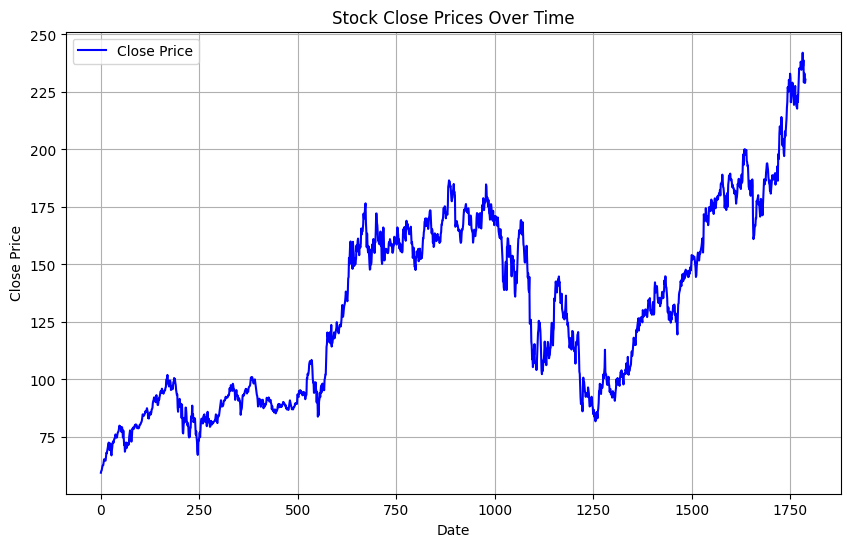

In [122]:

# Ensure the Date column is set as the index
df_AMZN['Date'] = pd.to_datetime(df_AMZN['Date'])  # Ensure Date is in datetime format
# Plot the Close prices
plt.figure(figsize=(10, 6))  # Optional: Adjust figure size for better visualization
plt.plot(df_AMZN['Close'], label='Close Price', color='blue')
plt.title('Stock Close Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.grid(True)
plt.show()

## FEATURE ENGINEERING 

## Adding Weekday Column

In [14]:
# Add a new Weekday column (0=Monday, 1=Tuesday, ..., 6=Sunday)
df_AMZN['Weekday'] = df_AMZN['Date'].dt.weekday

# Verify the Weekday column
print(df_AMZN[['Date', 'Weekday']].head(20))

         Date  Weekday
0  2018-01-02        1
1  2018-01-03        2
2  2018-01-04        3
3  2018-01-05        4
4  2018-01-08        0
5  2018-01-09        1
6  2018-01-10        2
7  2018-01-11        3
8  2018-01-12        4
9  2018-01-16        1
10 2018-01-17        2
11 2018-01-18        3
12 2018-01-19        4
13 2018-01-22        0
14 2018-01-23        1
15 2018-01-24        2
16 2018-01-25        3
17 2018-01-26        4
18 2018-01-29        0
19 2018-01-30        1


In [15]:
print(df_AMZN[['Date', 'Weekday']].tail(27))

           Date  Weekday
1762 2025-01-03        4
1763 2025-01-06        0
1764 2025-01-07        1
1765 2025-01-08        2
1766 2025-01-10        4
1767 2025-01-13        0
1768 2025-01-14        1
1769 2025-01-15        2
1770 2025-01-16        3
1771 2025-01-17        4
1772 2025-01-21        1
1773 2025-01-22        2
1774 2025-01-23        3
1775 2025-01-24        4
1776 2025-01-27        0
1777 2025-01-28        1
1778 2025-01-29        2
1779 2025-01-30        3
1780 2025-01-31        4
1781 2025-02-03        0
1782 2025-02-04        1
1783 2025-02-05        2
1784 2025-02-06        3
1785 2025-02-07        4
1786 2025-02-10        0
1787 2025-02-11        1
1788 2025-02-12        2


In [16]:
# Count occurrences of each weekday in the dataset
weekday_counts = df_AMZN['Weekday'].value_counts().sort_index()

print("Weekday Distribution:")
print(weekday_counts)


Weekday Distribution:
Weekday
0    334
1    369
2    365
3    361
4    360
Name: count, dtype: int64


In [17]:
df_AMZN.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Weekday'], dtype='object')

####  Reasons for Missing Weekdays in Data
 - Weekend Closures: Stock markets are closed on Saturdays and Sundays.
 - Public Holidays: Markets don’t operate on holidays.
 - Data Gaps: Missing data could be due to incomplete records.
 - Unusual Events: Markets may close for emergencies like natural disasters or national crises.


##### **Handling Missing Weekdays in Stock Market Data**

- **Fill Missing Weekdays**:
  - Needed for **time-series models** (e.g., LSTM, ARIMA) to ensure continuous data.
  - Techniques:
    - **Forward-Fill (ffill)**: Propagate the last known value.
    - **Interpolation**: Estimate values between gaps.
    - **NaN Filling**: Let the model handle missing data if supported.

- **Skip Filling**:
  - For **non-sequential models** (e.g., Random Forest, XGBoost): Irregular intervals are fine.
  - Focus only on **trading days** for analyses like day-of-week patterns.


Weekday
0    131.251346
1    131.251734
2    130.901559
3    130.443374
4    130.592321
Name: Close, dtype: float64


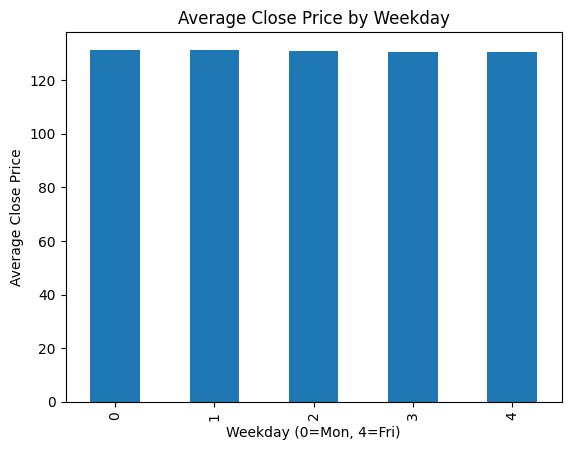

In [18]:
# Group by Weekday and calculate the mean Close price
weekday_avg_Close = df_AMZN.groupby('Weekday')['Close'].mean()

# Print or plot the results
print(weekday_avg_Close)

# Plot the weekday analysis
import matplotlib.pyplot as plt
weekday_avg_Close.plot(kind='bar', title='Average Close Price by Weekday')
plt.xlabel('Weekday (0=Mon, 4=Fri)')
plt.ylabel('Average Close Price')
plt.show()


###  'Close' prices by weekdays

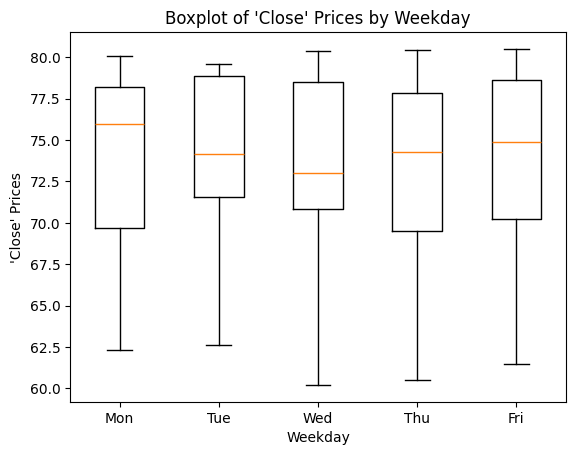

In [19]:
import matplotlib.pyplot as plt

# Extract weekdays and 'Close' prices directly from the DataFrame
weekday = df_AMZN['Weekday']  # Weekday is already available in the DataFrame
inp = df_AMZN['Close']  # 'Close' prices

# Initialize lists for each weekday
mon, tue, wed, thu, fri = [], [], [], [], []

# Adjust start and calibration
start = 1
calib = 100

# Group 'Close' prices by weekdays
for i in range(start, min(start + calib, len(inp))):
    if weekday.iloc[i] == 0:
        mon.append(inp.iloc[i])
    elif weekday.iloc[i] == 1:
        tue.append(inp.iloc[i])
    elif weekday.iloc[i] == 2:
        wed.append(inp.iloc[i])
    elif weekday.iloc[i] == 3:
        thu.append(inp.iloc[i])
    elif weekday.iloc[i] == 4:
        fri.append(inp.iloc[i])

# Plot the boxplot
fig, ax = plt.subplots()
ax.boxplot([mon, tue, wed, thu, fri], labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri'])
plt.title("Boxplot of 'Close' Prices by Weekday")
plt.xlabel("Weekday")
plt.ylabel("'Close' Prices")
plt.show()


## Adding month column

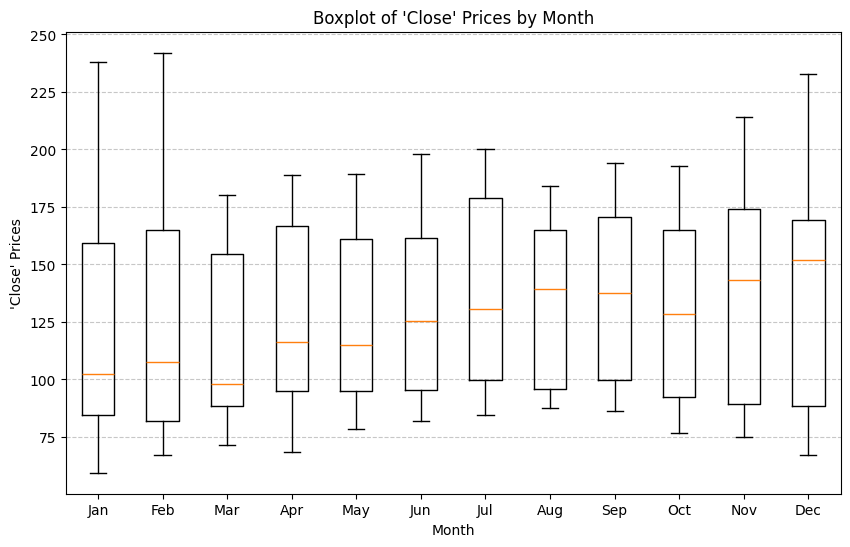

In [20]:
import matplotlib.pyplot as plt

# Extract 'Month' from 'Date'
df_AMZN['Month'] = df_AMZN['Date'].dt.month

# Group 'Close' prices by 'Month'
monthly_data = [df_AMZN[df_AMZN['Month'] == month]['Close'] for month in range(1, 13)]

# Create a boxplot
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(monthly_data, labels=[
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])
plt.title("Boxplot of 'Close' Prices by Month")
plt.xlabel("Month")
plt.ylabel("'Close' Prices")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


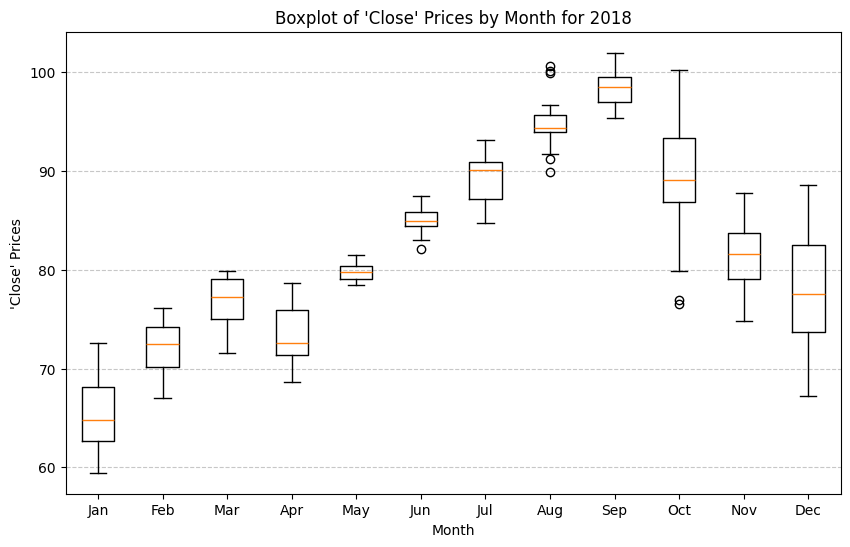

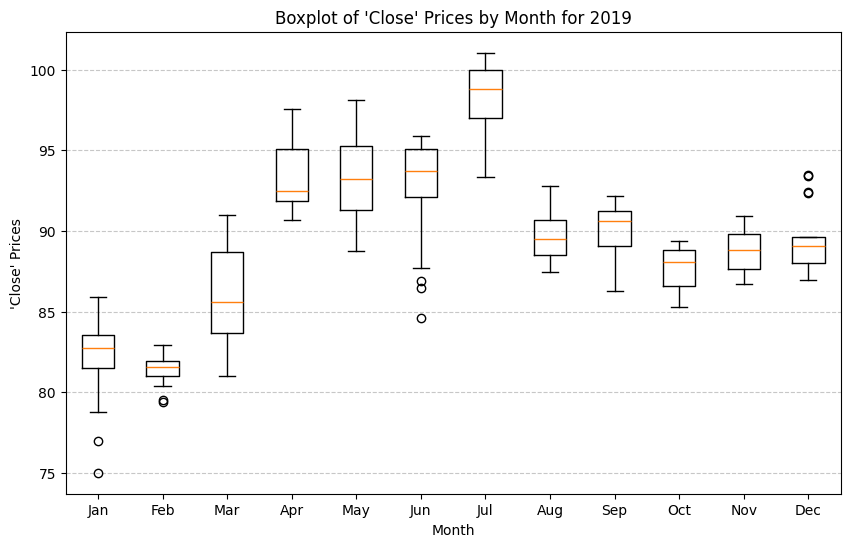

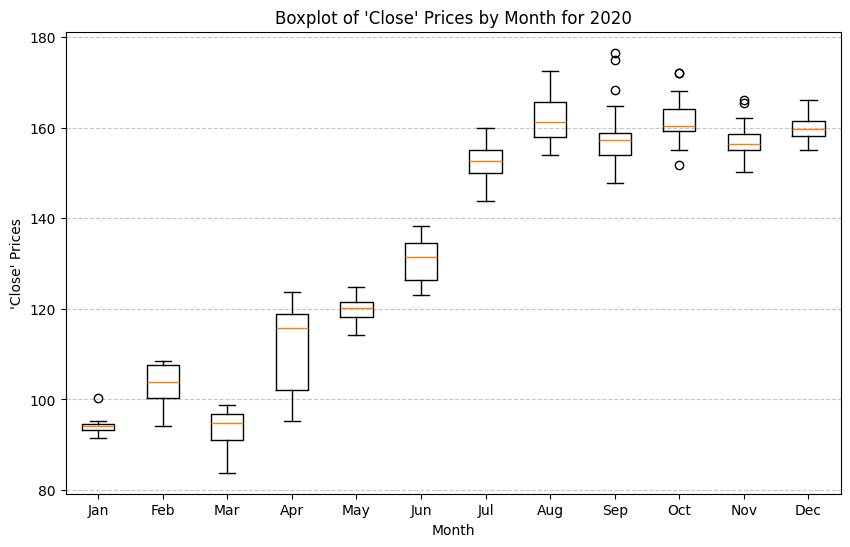

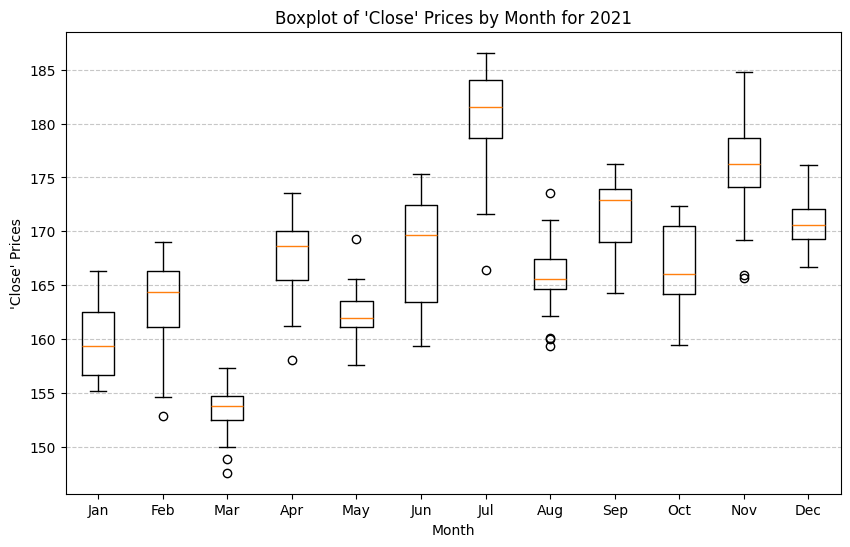

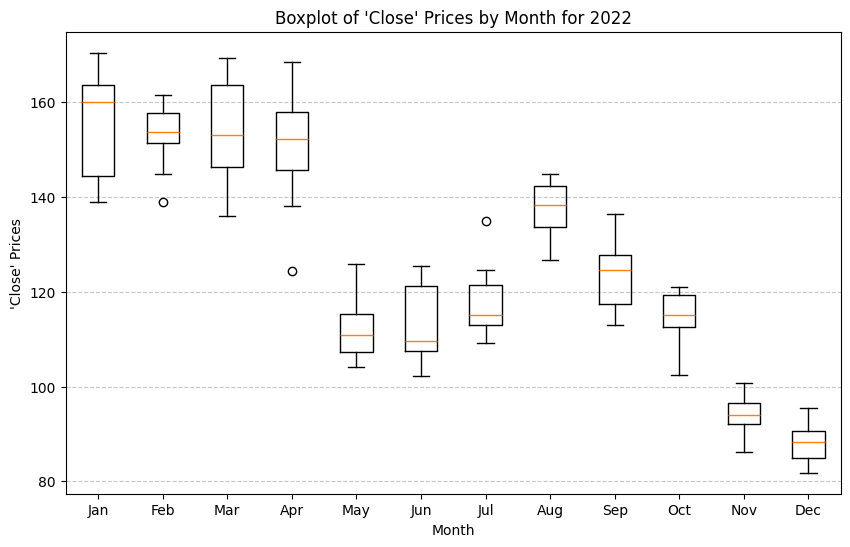

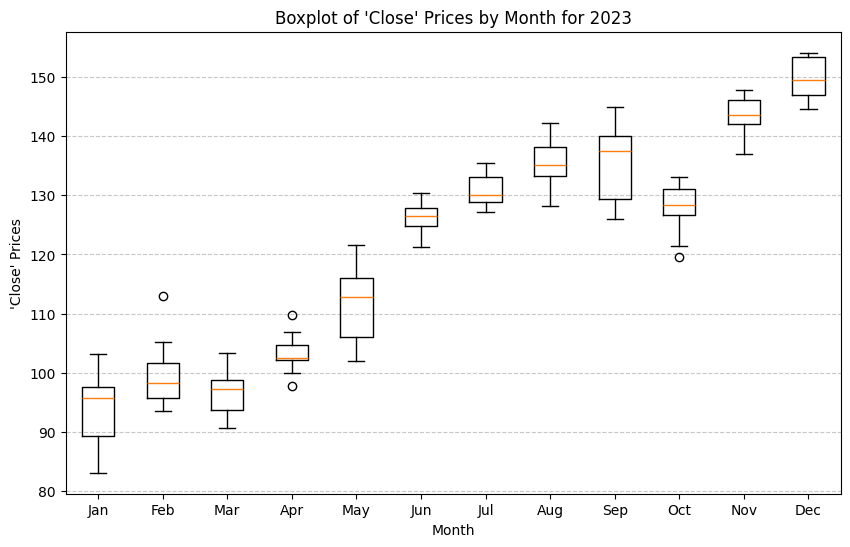

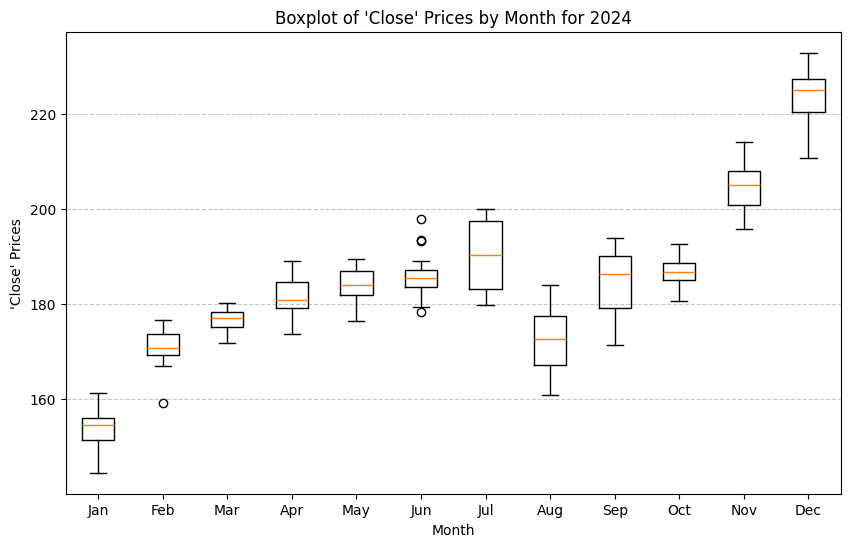

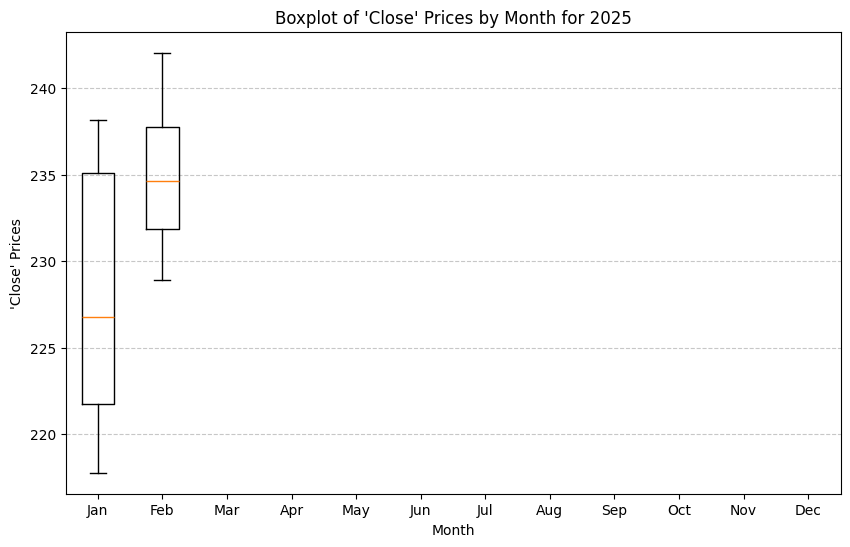

In [21]:

# Ensure 'Date' column is in datetime format
df_AMZN['Date'] = pd.to_datetime(df_AMZN['Date'], errors='coerce')

# Extract 'Year' and 'Month' from 'Date'
df_AMZN['Year'] = df_AMZN['Date'].dt.year
df_AMZN['Month'] = df_AMZN['Date'].dt.month

# Get unique years in the dataset
years = df_AMZN['Year'].unique()

# Generate boxplots for each year
for year in sorted(years):
    # Filter data for the current year
    year_data = df_AMZN[df_AMZN['Year'] == year]

    # Group 'Close' prices by 'Month'
    monthly_data = [year_data[year_data['Month'] == month]['Close'] for month in range(1, 13)]

    # Create the boxplot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.boxplot(monthly_data, labels=[
        'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
    ])
    plt.title(f"Boxplot of 'Close' Prices by Month for {year}")
    plt.xlabel("Month")
    plt.ylabel("'Close' Prices")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


## Adding Technical Indicators 

In [22]:
!pip install ta

In [23]:
# Import TA-Lib for technical analysis (if not installed, run: pip install ta)
import ta

# Add Moving Averages
df_AMZN['SMA_5'] = df_AMZN['Close'].rolling(window=5).mean()
df_AMZN['SMA_10'] = df_AMZN['Close'].rolling(window=10).mean()
df_AMZN['SMA_50'] = df_AMZN['Close'].rolling(window=50).mean()

df_AMZN['EMA_10'] = ta.trend.ema_indicator(df_AMZN['Close'], window=10)
df_AMZN['EMA_50'] = ta.trend.ema_indicator(df_AMZN['Close'], window=50)


In [24]:
# Add RSI
df_AMZN['RSI'] = ta.momentum.rsi(df_AMZN['Close'], window=14)

# Add Rate of Change (ROC)
df_AMZN['ROC'] = ta.momentum.roc(df_AMZN['Close'], window=10)

# Add Stochastic Oscillator
df_AMZN['Stochastic_Oscillator'] = ta.momentum.stoch(df_AMZN['High'], df_AMZN['Low'], df_AMZN['Close'], window=14, smooth_window=3)


In [25]:
# Add Bollinger Bands
bb = ta.volatility.BollingerBands(df_AMZN['Close'], window=20, window_dev=2)
df_AMZN['BB_Upper'] = bb.bollinger_hband()
df_AMZN['BB_Lower'] = bb.bollinger_lband()
df_AMZN['BB_Middle'] = bb.bollinger_mavg()

# Add ATR (Average True Range)
df_AMZN['ATR'] = ta.volatility.average_true_range(df_AMZN['High'], df_AMZN['Low'], df_AMZN['Close'], window=14)

# Add Standard Deviation over 20 days
df_AMZN['Std_Dev'] = df_AMZN['Close'].rolling(window=20).std()


In [26]:
# Calculate MACD
df_AMZN['EMA_12'] = df_AMZN['Close'].ewm(span=12, adjust=False).mean()
df_AMZN['EMA_26'] = df_AMZN['Close'].ewm(span=26, adjust=False).mean()
df_AMZN['MACD'] = df_AMZN['EMA_12'] - df_AMZN['EMA_26']
df_AMZN['Signal_Line'] = df_AMZN['MACD'].ewm(span=9, adjust=False).mean()

# Drop intermediate columns (EMA_12 & EMA_26)
df_AMZN.drop(columns=['EMA_12', 'EMA_26'], inplace=True)


In [27]:
# Add On-Balance Volume (OBV)
df_AMZN['OBV'] = ta.volume.on_balance_volume(df_AMZN['Close'], df_AMZN['Volume'])

# Add Chaikin Money Flow (CMF)
df_AMZN['CMF'] = ta.volume.chaikin_money_flow(df_AMZN['High'], df_AMZN['Low'], df_AMZN['Close'], df_AMZN['Volume'], window=20)

# Add VWAP (Volume Weighted Average Price)
df_AMZN['VWAP'] = ta.volume.volume_weighted_average_price(df_AMZN['High'], df_AMZN['Low'], df_AMZN['Close'], df_AMZN['Volume'], window=20)


In [28]:
# Display updated DataFrame
print(df_AMZN.head())

        Date       Open       High        Low      Close    Volume  Weekday  \
0 2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000        1   
1 2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000        2   
2 2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000        3   
3 2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000        4   
4 2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000        0   

   Month  Year    SMA_5  ...  BB_Upper  BB_Lower  BB_Middle  ATR  Std_Dev  \
0      1  2018      NaN  ...       NaN       NaN        NaN  0.0      NaN   
1      1  2018      NaN  ...       NaN       NaN        NaN  0.0      NaN   
2      1  2018      NaN  ...       NaN       NaN        NaN  0.0      NaN   
3      1  2018      NaN  ...       NaN       NaN        NaN  0.0      NaN   
4      1  2018  60.7881  ...       NaN       NaN        NaN  0.0      NaN   

       MACD  Signal_Line        OBV  CMF  VWAP  
0  0.000000  

Keep both MACD & Signal_Line initially, check their correlation with stock prices, and drop one if it’s redundant.

In [29]:
print(df_AMZN.tail())


           Date        Open        High         Low       Close    Volume  \
1784 2025-02-06  238.009995  239.660004  236.009995  238.830002  60897100   
1785 2025-02-07  232.500000  234.809998  228.059998  229.149994  77539300   
1786 2025-02-10  230.550003  233.919998  229.199997  233.139999  35419900   
1787 2025-02-11  231.919998  233.440002  230.130005  232.759995  23713700   
1788 2025-02-12  230.460007  231.179993  228.160004  228.929993  32212400   

      Weekday  Month  Year       SMA_5  ...    BB_Upper    BB_Lower  \
1784        3      2  2025  238.431998  ...  246.623017  215.443984   
1785        4      2  2025  236.725998  ...  246.464132  216.304869   
1786        0      2  2025  235.869998  ...  246.059533  218.129467   
1787        1      2  2025  234.009998  ...  245.294928  220.324070   
1788        2      2  2025  232.561996  ...  243.967567  222.768431   

       BB_Middle       ATR   Std_Dev      MACD  Signal_Line         OBV  \
1784  231.033501  5.437642  7.99725

## Adding economic Indicators

### Adding GDP

In [30]:
import pandas as pd
import numpy as np
from datetime import datetime

# Load GDP dataset
gdp_df = pd.read_csv("GDP.csv")

# Preprocess GDP
gdp_df['DATE'] = pd.to_datetime(gdp_df['DATE'], errors='coerce')
gdp_df.rename(columns={"DATE": "Date"}, inplace=True)  # Rename for merging

# Define today's date
today = datetime.today()

# Create a full daily date range from the minimum date to today
full_date_range = pd.date_range(start=gdp_df['Date'].min(), end=today, freq='D')

# Reindex the DataFrame to include all dates up to today
gdp_df = gdp_df.set_index('Date').reindex(full_date_range)

# Forward-fill missing GDP values
gdp_df = gdp_df.ffill().reset_index()

# Rename columns for clarity
gdp_df.columns = ['Date', 'GDP']

# 🔹 Calculate GDP Growth Rate
gdp_df['GDP_Growth_Rate'] = gdp_df['GDP'].pct_change(periods=365) * 100  # Year-over-Year Growth

# Fill NaN values (first row will be NaN)
gdp_df['GDP_Growth_Rate'] = gdp_df['GDP_Growth_Rate'].fillna(method='bfill')

# Display the updated DataFrame
print(gdp_df[['Date', 'GDP', 'GDP_Growth_Rate']])


           Date        GDP  GDP_Growth_Rate
0    2018-01-01  20328.553         3.851956
1    2018-01-02  20328.553         3.851956
2    2018-01-03  20328.553         3.851956
3    2018-01-04  20328.553         3.851956
4    2018-01-05  20328.553         3.851956
...         ...        ...              ...
2596 2025-02-09  29354.321         2.551182
2597 2025-02-10  29354.321         2.551182
2598 2025-02-11  29354.321         2.551182
2599 2025-02-12  29354.321         2.551182
2600 2025-02-13  29354.321         2.551182

[2601 rows x 3 columns]


### Adding Unemployment Rate

In [31]:
# Load Unemployment rate dataset
unemployment_df = pd.read_csv("UNRATE.csv")

# Preprocess Unemployment
unemployment_df['DATE'] = pd.to_datetime(unemployment_df['DATE'], errors='coerce')
unemployment_df.rename(columns={"DATE": "Date"}, inplace=True)  # Rename for merging

# Create a full daily date range from the minimum date to today
full_date_range = pd.date_range(start=unemployment_df['Date'].min(), end=today, freq='D')

# Reindex the DataFrame to include all dates up to today
unemployment_df = unemployment_df.set_index('Date').reindex(full_date_range)

# Forward-fill missing unemployment rates
unemployment_df = unemployment_df.ffill().reset_index()

# Rename columns for clarity
unemployment_df.columns = ['Date', 'UNRATE']

# Display the updated DataFrame
print(unemployment_df)


           Date  UNRATE
0    2018-01-01     4.0
1    2018-01-02     4.1
2    2018-01-03     4.0
3    2018-01-04     4.0
4    2018-01-05     3.8
...         ...     ...
2596 2025-02-09     4.2
2597 2025-02-10     4.2
2598 2025-02-11     4.2
2599 2025-02-12     4.2
2600 2025-02-13     4.2

[2601 rows x 2 columns]


## Merging GDP and unemployment rate columns to df_AMZN dataset

In [32]:
# Merge the DataFrames
df_AMZN = pd.merge(df_AMZN, gdp_df, on='Date', how='left')
df_AMZN = pd.merge(df_AMZN, unemployment_df, on='Date', how='left')

In [33]:
df_AMZN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1789 entries, 0 to 1788
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   1789 non-null   datetime64[ns]
 1   Open                   1789 non-null   float64       
 2   High                   1789 non-null   float64       
 3   Low                    1789 non-null   float64       
 4   Close                  1789 non-null   float64       
 5   Volume                 1789 non-null   int64         
 6   Weekday                1789 non-null   int32         
 7   Month                  1789 non-null   int32         
 8   Year                   1789 non-null   int32         
 9   SMA_5                  1785 non-null   float64       
 10  SMA_10                 1780 non-null   float64       
 11  SMA_50                 1740 non-null   float64       
 12  EMA_10                 1780 non-null   float64       
 13  EMA

In [34]:
print(df_AMZN.head())

        Date       Open       High        Low      Close    Volume  Weekday  \
0 2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000        1   
1 2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000        2   
2 2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000        3   
3 2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000        4   
4 2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000        0   

   Month  Year    SMA_5  ...  ATR  Std_Dev      MACD  Signal_Line        OBV  \
0      1  2018      NaN  ...  0.0      NaN  0.000000     0.000000   53890000   
1      1  2018      NaN  ...  0.0      NaN  0.060587     0.012117  116066000   
2      1  2018      NaN  ...  0.0      NaN  0.128863     0.035467  176508000   
3      1  2018      NaN  ...  0.0      NaN  0.258865     0.080146  247402000   
4      1  2018  60.7881  ...  0.0      NaN  0.428486     0.149814  332992000   

   CMF  VWAP        GDP  GDP_Growth_Rate  UN

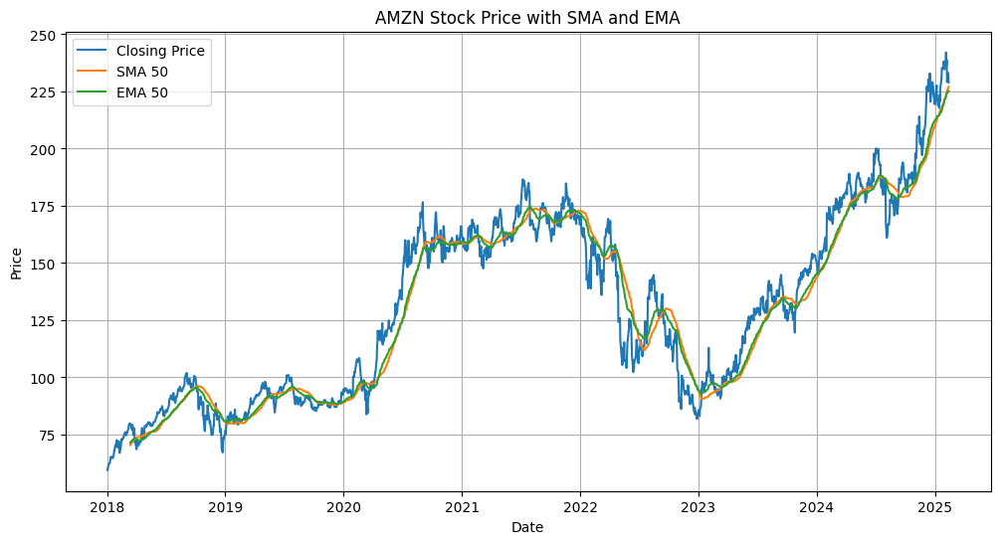

In [35]:
# Plot the closing prices
plt.figure(figsize=(12, 6))
plt.plot(df_AMZN['Date'], df_AMZN['Close'], label='Closing Price')
plt.plot(df_AMZN['Date'], df_AMZN['SMA_50'], label='SMA 50')
plt.plot(df_AMZN['Date'], df_AMZN['EMA_50'], label='EMA 50')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('AMZN Stock Price with SMA and EMA')
plt.legend()
plt.grid(True)
plt.show()


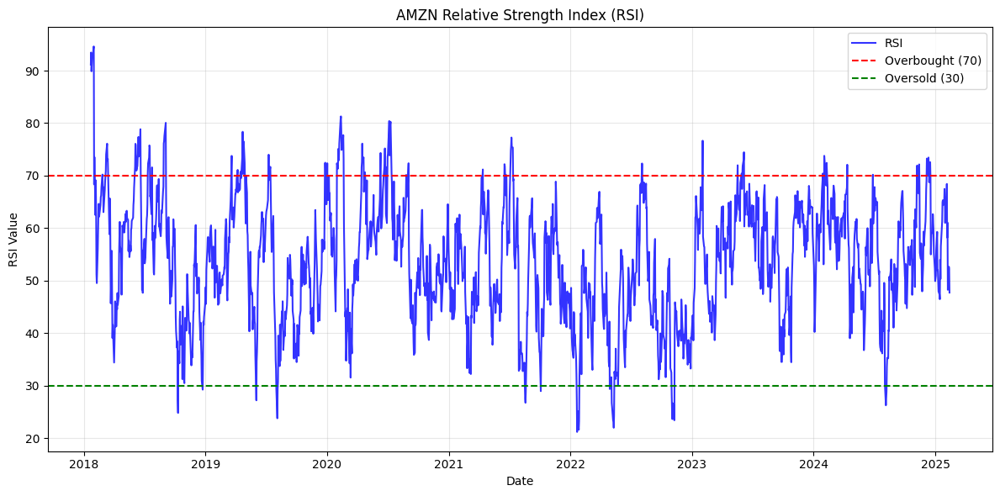

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot RSI values
plt.plot(df_AMZN['Date'], df_AMZN['RSI'], label='RSI', color='blue', alpha=0.8)

# Add overbought and oversold levels
plt.axhline(70, color='red', linestyle='--', label='Overbought (70)')
plt.axhline(30, color='green', linestyle='--', label='Oversold (30)')

# Add grid and labels
plt.grid(alpha=0.3)
plt.xlabel('Date')
plt.ylabel('RSI Value')
plt.title('AMZN Relative Strength Index (RSI)')
plt.legend()

plt.tight_layout()
plt.show()


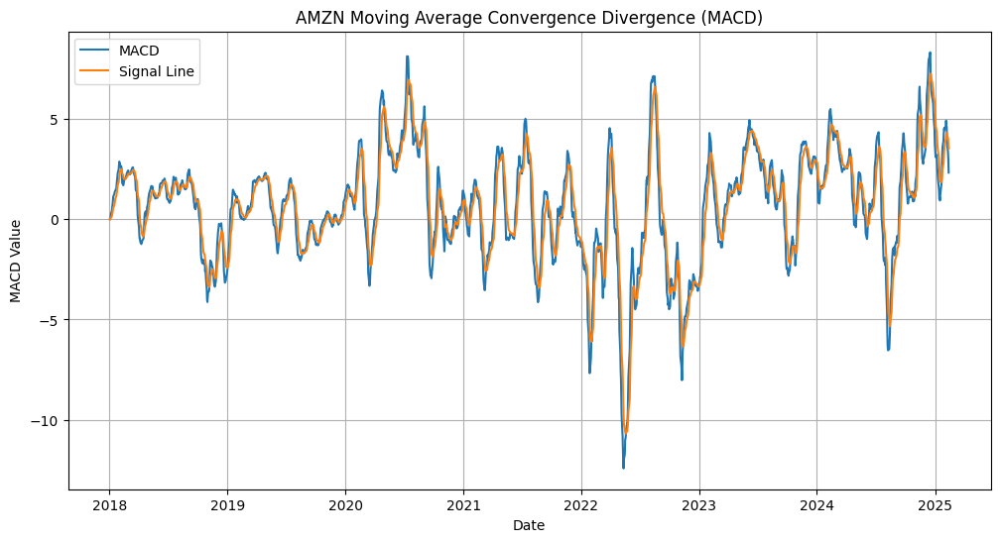

In [37]:
# Plot MACD
plt.figure(figsize=(12, 6))
plt.plot(df_AMZN['Date'], df_AMZN['MACD'], label='MACD')
plt.plot(df_AMZN['Date'], df_AMZN['Signal_Line'], label='Signal Line')
plt.xlabel('Date')
plt.ylabel('MACD Value')
plt.title('AMZN Moving Average Convergence Divergence (MACD)')
plt.legend()
plt.grid(True)
plt.show()

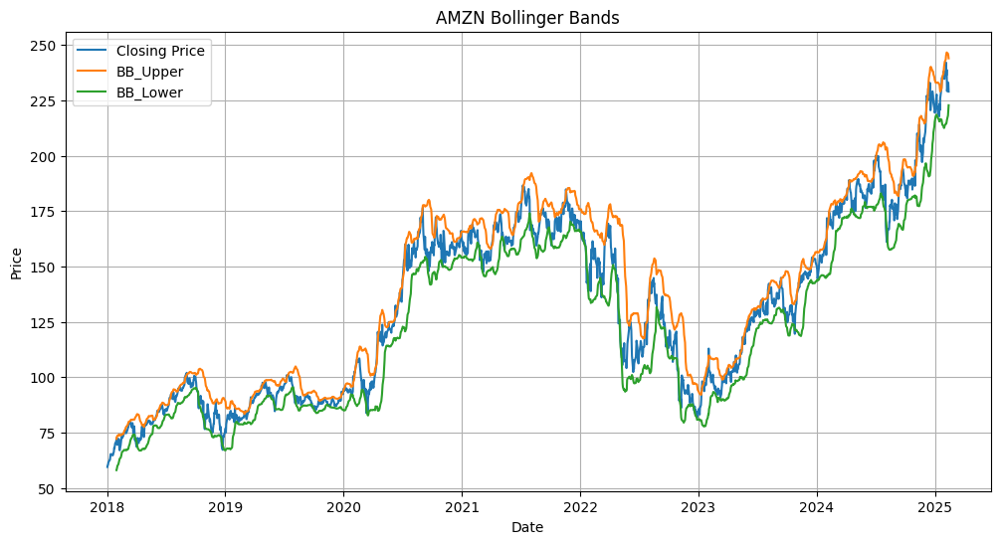

In [38]:
# Plot Bollinger Bands
plt.figure(figsize=(12, 6))
plt.plot(df_AMZN['Date'], df_AMZN['Close'], label='Closing Price')
plt.plot(df_AMZN['Date'], df_AMZN['BB_Upper'], label='BB_Upper')
plt.plot(df_AMZN['Date'], df_AMZN['BB_Lower'], label='BB_Lower')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('AMZN Bollinger Bands')
plt.legend()
plt.grid(True)
plt.show()

In [39]:
df_AMZN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1789 entries, 0 to 1788
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   1789 non-null   datetime64[ns]
 1   Open                   1789 non-null   float64       
 2   High                   1789 non-null   float64       
 3   Low                    1789 non-null   float64       
 4   Close                  1789 non-null   float64       
 5   Volume                 1789 non-null   int64         
 6   Weekday                1789 non-null   int32         
 7   Month                  1789 non-null   int32         
 8   Year                   1789 non-null   int32         
 9   SMA_5                  1785 non-null   float64       
 10  SMA_10                 1780 non-null   float64       
 11  SMA_50                 1740 non-null   float64       
 12  EMA_10                 1780 non-null   float64       
 13  EMA

In [40]:
df_AMZN.head()

,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,...,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE
0,2018-01-02,58.599998,59.500000,58.525501,59.450500,53890000,1,1,2018,NaN,...,0.0,NaN,0.000000,0.000000,53890000,NaN,NaN,20328.553,3.851956,4.1
1,2018-01-03,59.415001,60.274502,59.415001,60.209999,62176000,2,1,2018,NaN,...,0.0,NaN,0.060587,0.012117,116066000,NaN,NaN,20328.553,3.851956,4.0
2,2018-01-04,60.250000,60.793499,60.233002,60.479500,60442000,3,1,2018,NaN,...,0.0,NaN,0.128863,0.035467,176508000,NaN,NaN,20328.553,3.851956,4.0
3,2018-01-05,60.875500,61.457001,60.500000,61.457001,70894000,4,1,2018,NaN,...,0.0,NaN,0.258865,0.080146,247402000,NaN,NaN,20328.553,3.851956,3.8
4,2018-01-08,61.799999,62.653999,61.601501,62.343498,85590000,0,1,2018,60.7881,...,0.0,NaN,0.428486,0.149814,332992000,NaN,NaN,20328.553,3.851956,3.8


In [41]:
df_AMZN.tail()

,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,...,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE
1784,2025-02-06,238.009995,239.660004,236.009995,238.830002,60897100,3,2,2025,238.431998,...,5.437642,7.997253,4.609799,4.321827,7431994100,0.277751,231.369826,29354.321,2.551182,4.2
1785,2025-02-07,232.500000,234.809998,228.059998,229.149994,77539300,4,2,2025,236.725998,...,5.818525,7.735688,3.747573,4.206976,7354454800,0.182926,231.612116,29354.321,2.551182,4.2
1786,2025-02-10,230.550003,233.919998,229.199997,233.139999,35419900,0,2,2025,235.869998,...,5.743630,7.163911,3.347624,4.035106,7389874700,0.218041,232.251987,29354.321,2.551182,4.2
1787,2025-02-11,231.919998,233.440002,230.130005,232.759995,23713700,1,2,2025,234.009998,...,5.569799,6.404890,2.965811,3.821247,7366161000,0.224714,232.764699,29354.321,2.551182,4.2
1788,2025-02-12,230.460007,231.179993,228.160004,228.929993,32212400,2,2,2025,232.561996,...,5.500527,5.437464,2.327343,3.522466,7333948600,0.216108,233.086868,29354.321,2.551182,4.2


In [42]:
df_AMZN.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Weekday', 'Month',
       'Year', 'SMA_5', 'SMA_10', 'SMA_50', 'EMA_10', 'EMA_50', 'RSI', 'ROC',
       'Stochastic_Oscillator', 'BB_Upper', 'BB_Lower', 'BB_Middle', 'ATR',
       'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'CMF', 'VWAP', 'GDP',
       'GDP_Growth_Rate', 'UNRATE'],
      dtype='object')

## Adding Lagged features 

In [43]:
# Shift target column to create the next day's target
df_AMZN['Close_t+1'] = df_AMZN['Close'].shift(-1)

# Create lagged features for predictors
df_AMZN['Close_t-1'] = df_AMZN['Close'].shift(1)
df_AMZN['Close_t-2'] = df_AMZN['Close'].shift(2)
df_AMZN['Volume_t-1'] = df_AMZN['Volume'].shift(1)

## Adding Market Wide Features
- S&P 500, NASDAQ, VIX (Volatility Index)
- Put/Call Ratio (Investor Sentiment)

In [44]:
# Download Data for S&P 500 and NASDAQ
sp500 = yf.download('^GSPC', start='2018-01-01', end=end_date)
nasdaq = yf.download('^IXIC', start='2018-01-01', end=end_date)

print(sp500.head())
print(nasdaq.head())

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Price         Adj Close        Close         High          Low         Open  \
Ticker            ^GSPC        ^GSPC        ^GSPC        ^GSPC        ^GSPC   
Date                                                                          
2018-01-02  2695.810059  2695.810059  2695.889893  2682.360107  2683.729980   
2018-01-03  2713.060059  2713.060059  2714.370117  2697.770020  2697.850098   
2018-01-04  2723.989990  2723.989990  2729.290039  2719.070068  2719.310059   
2018-01-05  2743.149902  2743.149902  2743.449951  2727.919922  2731.330078   
2018-01-08  2747.709961  2747.709961  2748.510010  2737.600098  2742.669922   

Price           Volume  
Ticker           ^GSPC  
Date                    
2018-01-02  3397430000  
2018-01-03  3544030000  
2018-01-04  3697340000  
2018-01-05  3239280000  
2018-01-08  3246160000  
Price         Adj Close        Close         High          Low         Open  \
Ticker            ^IXIC        ^IXIC        ^IXIC        ^IXIC        ^IXIC   
Date     

In [45]:
# Reset Index (Convert Date Index to Column)
sp500 = sp500.reset_index()
nasdaq = nasdaq.reset_index()


print(sp500.head())
print(nasdaq.head())

# Drop the 'Ticker' level
sp500.columns = sp500.columns.droplevel('Ticker')
nasdaq.columns = nasdaq.columns.droplevel('Ticker')

sp500.columns.name = None
nasdaq.columns.name = None

sp500.head()
nasdaq.head()

Price        Date    Adj Close        Close         High          Low  \
Ticker                   ^GSPC        ^GSPC        ^GSPC        ^GSPC   
0      2018-01-02  2695.810059  2695.810059  2695.889893  2682.360107   
1      2018-01-03  2713.060059  2713.060059  2714.370117  2697.770020   
2      2018-01-04  2723.989990  2723.989990  2729.290039  2719.070068   
3      2018-01-05  2743.149902  2743.149902  2743.449951  2727.919922   
4      2018-01-08  2747.709961  2747.709961  2748.510010  2737.600098   

Price          Open      Volume  
Ticker        ^GSPC       ^GSPC  
0       2683.729980  3397430000  
1       2697.850098  3544030000  
2       2719.310059  3697340000  
3       2731.330078  3239280000  
4       2742.669922  3246160000  
Price        Date    Adj Close        Close         High          Low  \
Ticker                   ^IXIC        ^IXIC        ^IXIC        ^IXIC   
0      2018-01-02  7006.899902  7006.899902  7006.910156  6924.080078   
1      2018-01-03  7065.529785 

,Date,Adj Close,Close,High,Low,Open,Volume
0,2018-01-02,7006.899902,7006.899902,7006.910156,6924.080078,6937.649902,1929700000
1,2018-01-03,7065.529785,7065.529785,7069.149902,7016.700195,7017.069824,2173130000
2,2018-01-04,7077.910156,7077.910156,7098.049805,7072.379883,7089.500000,2103220000
3,2018-01-05,7136.560059,7136.560059,7137.040039,7097.080078,7105.740234,2024000000
4,2018-01-08,7157.390137,7157.390137,7161.350098,7124.089844,7135.379883,2055010000


In [46]:
# Keep Only Relevant Columns (Date, Close, Volume)
sp500 = sp500[['Date', 'Close', 'Volume']]
nasdaq = nasdaq[['Date', 'Close', 'Volume']]

# Rename Columns for Clarity
sp500.rename(columns={'Close': 'SP500_Close', 'Volume': 'SP500_Volume'}, inplace=True)
nasdaq.rename(columns={'Close': 'NASDAQ_Close', 'Volume': 'NASDAQ_Volume'}, inplace=True)

# Save Cleaned Data (Optional)
sp500.to_csv("Cleaned_SP500.csv", index=False)
nasdaq.to_csv("Cleaned_NASDAQ.csv", index=False)


In [47]:
sp500


,Date,SP500_Close,SP500_Volume
0,2018-01-02,2695.810059,3397430000
1,2018-01-03,2713.060059,3544030000
2,2018-01-04,2723.989990,3697340000
3,2018-01-05,2743.149902,3239280000
4,2018-01-08,2747.709961,3246160000
...,...,...,...
1784,2025-02-06,6083.569824,4847120000
1785,2025-02-07,6025.990234,4766900000
1786,2025-02-10,6066.439941,4458760000
1787,2025-02-11,6068.500000,4324880000


### Merging the data  

In [48]:

# Merge S&P 500 Data
df_AMZN = df_AMZN.merge(sp500, on='Date', how='left')

# Merge NASDAQ Data
df_AMZN = df_AMZN.merge(nasdaq, on='Date', how='left')

# Forward-Fill Missing Values (If Any)
df_AMZN.fillna(method='ffill', inplace=True)

# Display Updated DataFrame
print(df_AMZN.head())

        Date       Open       High        Low      Close    Volume  Weekday  \
0 2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000        1   
1 2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000        2   
2 2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000        3   
3 2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000        4   
4 2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000        0   

   Month  Year    SMA_5  ...  GDP_Growth_Rate  UNRATE  Close_t+1  Close_t-1  \
0      1  2018      NaN  ...         3.851956     4.1  60.209999        NaN   
1      1  2018      NaN  ...         3.851956     4.0  60.479500  59.450500   
2      1  2018      NaN  ...         3.851956     4.0  61.457001  60.209999   
3      1  2018      NaN  ...         3.851956     3.8  62.343498  60.479500   
4      1  2018  60.7881  ...         3.851956     3.8  62.634998  61.457001   

   Close_t-2  Volume_t-1  SP500_Close  SP500_Volum

### Adding Inflation Rate, Consumer Price Index and 10-Year Treasury Inflation-Indexed Security (Real Yield)

 1. T5YIE → 5-Year Breakeven Inflation Rate
    - Measures expected inflation over the next 5 years.
    - Impact: A rising T5YIE suggests higher expected inflation, leading to potential interest rate hikes and affecting stock prices negatively.
    - Captures inflation expectations, influencing investor sentiment.

 2. CPIAUCSL → Consumer Price Index (CPI)
    - Measures actual inflation rate (YoY change in CPI).
    - Impact: High CPI indicates rising inflation, which can impact interest rates, corporate earnings, and stock prices.
    - Real-world inflation rate, affecting interest rates & stock valuations.

 3. DFII10 → 10-Year Treasury Inflation-Indexed Security (Real Yield)
    - Real yield on 10-year Treasury bonds, adjusted for inflation.
    - Impact: Higher real yields suggest rising risk-free returns, making stocks less attractive.
    - Measures real bond yields, impacting equity attractiveness.

In [49]:
# Function to process economic data
def process_economic_data(df, value_column, new_column_name):
    """Fills missing dates, forward-fills missing values, and calculates Year-over-Year growth."""
    
    # Convert 'Date' to datetime format
    df['Date'] = pd.to_datetime(df['Date'])

    # Create a full daily date range from the minimum date to today
    full_date_range = pd.date_range(start=df['Date'].min(), end=today, freq='D')

    # Reindex the DataFrame to include all dates up to today
    df = df.set_index('Date').reindex(full_date_range)

    # Forward-fill missing values
    df = df.ffill()

    # Reset index and ensure 'Date' is a column, removing any extra index
    df = df.reset_index().rename(columns={'index': 'Date'})

    return df

# Load Data
t5yie = pd.read_csv("T5YIE.csv")
cpi = pd.read_csv("CPIAUCSL.csv")
dfii10 = pd.read_csv("DFII10.csv")

# Convert 'observation_date' to 'Date'
t5yie.rename(columns={'observation_date': 'Date'}, inplace=True)
cpi.rename(columns={'observation_date': 'Date'}, inplace=True)
dfii10.rename(columns={'observation_date': 'Date'}, inplace=True)

# Convert 'Date' to datetime format
t5yie['Date'] = pd.to_datetime(t5yie['Date'])
cpi['Date'] = pd.to_datetime(cpi['Date'])
dfii10['Date'] = pd.to_datetime(dfii10['Date'])

# Rename Data Columns for Clarity
t5yie.rename(columns={'T5YIE': 'Inflation_rate'}, inplace=True)
cpi.rename(columns={'CPIAUCSL': 'CPI'}, inplace=True)
dfii10.rename(columns={'DFII10': '10_Yr_Yield'}, inplace=True)

# Process Economic Data with the Fix
t5yie = process_economic_data(t5yie, 'Inflation_rate', 'Inflation_rate')
cpi = process_economic_data(cpi, 'CPI', 'CPI')
dfii10 = process_economic_data(dfii10, '10_Yr_Yield', '10_Yr_Yield')

# Display Processed Data (Without Extra Index)
print(t5yie.head())

        Date  Inflation_rate
0 2018-01-02            1.90
1 2018-01-03            1.87
2 2018-01-04            1.92
3 2018-01-05            1.95
4 2018-01-06            1.95


In [50]:
cpi.head()


,Date,CPI
0,2018-01-01,248.859
1,2018-01-02,248.859
2,2018-01-03,248.859
3,2018-01-04,248.859
4,2018-01-05,248.859


In [51]:
dfii10.head()

,Date,10_Yr_Yield
0,2018-01-02,0.46
1,2018-01-03,0.46
2,2018-01-04,0.45
3,2018-01-05,0.46
4,2018-01-06,0.46


In [52]:



# Merge with stock dataset
df_AMZN = df_AMZN.merge(t5yie, on='Date', how='left')
df_AMZN = df_AMZN.merge(cpi, on='Date', how='left')
df_AMZN = df_AMZN.merge(dfii10, on='Date', how='left')

# Forward-fill missing values
df_AMZN.fillna(method='ffill', inplace=True)

# Display updated DataFrame
print(df_AMZN.head())

        Date       Open       High        Low      Close    Volume  Weekday  \
0 2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000        1   
1 2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000        2   
2 2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000        3   
3 2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000        4   
4 2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000        0   

   Month  Year    SMA_5  ...  Close_t-1  Close_t-2  Volume_t-1  SP500_Close  \
0      1  2018      NaN  ...        NaN        NaN         NaN  2695.810059   
1      1  2018      NaN  ...  59.450500        NaN  53890000.0  2713.060059   
2      1  2018      NaN  ...  60.209999  59.450500  62176000.0  2723.989990   
3      1  2018      NaN  ...  60.479500  60.209999  60442000.0  2743.149902   
4      1  2018  60.7881  ...  61.457001  60.479500  70894000.0  2747.709961   

   SP500_Volume  NASDAQ_Close  NASDAQ_Volume  Infl

## Dropping null values

In [53]:
# Drop rows with NaN values caused by shifting
df_AMZN = df_AMZN.dropna()
df_AMZN.reset_index(drop=True, inplace=True)
df_AMZN.head()

,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,...,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield
0,2018-03-14,79.849998,80.321999,79.544502,79.550003,85188000,2,3,2018,79.083202,...,79.408997,79.919502,130638000.0,2749.479980,3394630000,7496.810059,2112950000,2.04,249.577,0.74
1,2018-03-15,79.750000,79.845497,78.905502,79.115997,81394000,3,3,2018,79.387801,...,79.550003,79.408997,85188000.0,2747.330078,3543710000,7481.740234,2008290000,2.07,249.577,0.74
2,2018-03-16,79.172501,79.472000,78.375000,78.584000,108500000,4,3,2018,79.315700,...,79.115997,79.550003,81394000.0,2752.010010,5429140000,7481.990234,3089970000,2.05,249.577,0.77
3,2018-03-19,77.726501,78.083000,76.267502,77.246498,131616000,0,3,2018,78.781099,...,78.584000,79.115997,108500000.0,2712.919922,3327460000,7344.240234,2352810000,2.04,249.577,0.77
4,2018-03-20,77.516998,79.349998,77.270500,79.325500,91632000,1,3,2018,78.764400,...,77.246498,78.584000,131616000.0,2716.939941,3272590000,7364.299805,1976000000,2.05,249.577,0.81


In [54]:
df_AMZN.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Weekday', 'Month',
       'Year', 'SMA_5', 'SMA_10', 'SMA_50', 'EMA_10', 'EMA_50', 'RSI', 'ROC',
       'Stochastic_Oscillator', 'BB_Upper', 'BB_Lower', 'BB_Middle', 'ATR',
       'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'CMF', 'VWAP', 'GDP',
       'GDP_Growth_Rate', 'UNRATE', 'Close_t+1', 'Close_t-1', 'Close_t-2',
       'Volume_t-1', 'SP500_Close', 'SP500_Volume', 'NASDAQ_Close',
       'NASDAQ_Volume', 'Inflation_rate', 'CPI', '10_Yr_Yield'],
      dtype='object')

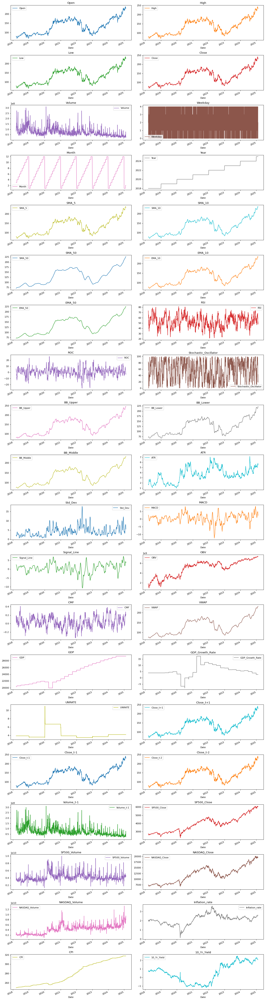

In [55]:

# Define colors for plotting
colors = plt.cm.get_cmap("tab10").colors  # Using tab10 colormap for colors


def plot_stock_features(df_AMZN):
    feature_keys = [col for col in df_AMZN.columns if col not in ['Date', 'Ticker']]
    fig, axes = plt.subplots(nrows=len(feature_keys)//2 + len(feature_keys)%2, ncols=2, figsize=(16, len(feature_keys) * 1.5), dpi=80, facecolor="w", edgecolor="k")
    axes = axes.flatten()
    
    for i, key in enumerate(feature_keys):
        ax = axes[i]
        df_AMZN.plot(x='Date', y=key, ax=ax, color=colors[i % len(colors)], title=f"{key}", rot=25)
        ax.legend([key])
    
    plt.tight_layout()
    plt.show()

plot_stock_features(df_AMZN)


In [56]:
df_AMZN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1740 entries, 0 to 1739
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   1740 non-null   datetime64[ns]
 1   Open                   1740 non-null   float64       
 2   High                   1740 non-null   float64       
 3   Low                    1740 non-null   float64       
 4   Close                  1740 non-null   float64       
 5   Volume                 1740 non-null   int64         
 6   Weekday                1740 non-null   int32         
 7   Month                  1740 non-null   int32         
 8   Year                   1740 non-null   int32         
 9   SMA_5                  1740 non-null   float64       
 10  SMA_10                 1740 non-null   float64       
 11  SMA_50                 1740 non-null   float64       
 12  EMA_10                 1740 non-null   float64       
 13  EMA

In [57]:
# Save the updated DataFrame
df_AMZN.to_csv('merged_df_AMZN.csv', index=False)

In [58]:
print(df_AMZN)


           Date        Open        High         Low       Close     Volume  \
0    2018-03-14   79.849998   80.321999   79.544502   79.550003   85188000   
1    2018-03-15   79.750000   79.845497   78.905502   79.115997   81394000   
2    2018-03-16   79.172501   79.472000   78.375000   78.584000  108500000   
3    2018-03-19   77.726501   78.083000   76.267502   77.246498  131616000   
4    2018-03-20   77.516998   79.349998   77.270500   79.325500   91632000   
...         ...         ...         ...         ...         ...        ...   
1735 2025-02-06  238.009995  239.660004  236.009995  238.830002   60897100   
1736 2025-02-07  232.500000  234.809998  228.059998  229.149994   77539300   
1737 2025-02-10  230.550003  233.919998  229.199997  233.139999   35419900   
1738 2025-02-11  231.919998  233.440002  230.130005  232.759995   23713700   
1739 2025-02-12  230.460007  231.179993  228.160004  228.929993   32212400   

      Weekday  Month  Year       SMA_5  ...   Close_t-1   Close

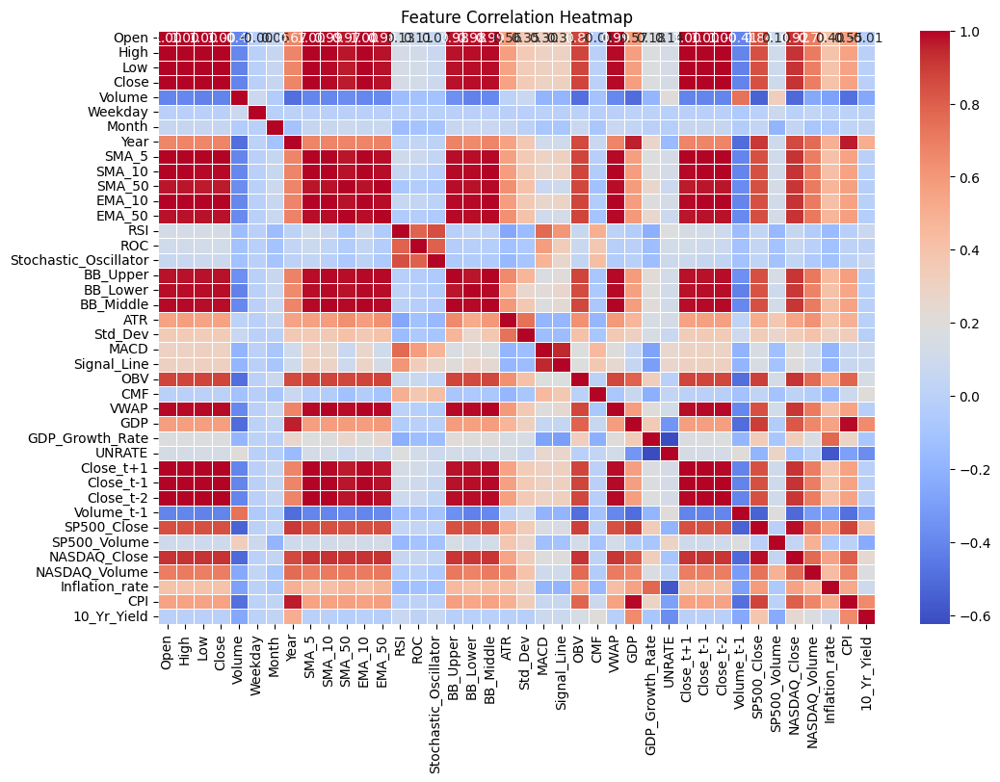

In [85]:

def plot_correlation_heatmap(df_AMZN):
    feature_keys = [col for col in df_AMZN.columns if col not in ['Date', 'Ticker']]
    plt.figure(figsize=(12, 8))
    sns.heatmap(df_AMZN[feature_keys].corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title("Feature Correlation Heatmap")
    plt.show()
    
plot_correlation_heatmap(df_AMZN)  

### correlation nmatrix

In [86]:
# Select only numeric columns (ignore non-numeric ones)
df_numeric = df_AMZN.select_dtypes(include=['number'])


# Compute the correlation matrix
correlation_matrix = df_numeric.corr().round(2)  # Round values to ensure they are formatted properly
print(correlation_matrix)



                       Open  High   Low  Close  Volume  Weekday  Month  Year  \
Open                   1.00  1.00  1.00   1.00   -0.41    -0.00   0.06  0.67   
High                   1.00  1.00  1.00   1.00   -0.40    -0.01   0.06  0.67   
Low                    1.00  1.00  1.00   1.00   -0.42    -0.00   0.06  0.67   
Close                  1.00  1.00  1.00   1.00   -0.41    -0.01   0.06  0.67   
Volume                -0.41 -0.40 -0.42  -0.41    1.00     0.09  -0.05 -0.50   
Weekday               -0.00 -0.01 -0.00  -0.01    0.09     1.00  -0.01  0.00   
Month                  0.06  0.06  0.06   0.06   -0.05    -0.01   1.00 -0.11   
Year                   0.67  0.67  0.67   0.67   -0.50     0.00  -0.11  1.00   
SMA_5                  1.00  1.00  1.00   1.00   -0.40    -0.01   0.06  0.67   
SMA_10                 0.99  0.99  0.99   0.99   -0.40    -0.01   0.06  0.67   
SMA_50                 0.97  0.97  0.97   0.97   -0.38    -0.01   0.08  0.67   
EMA_10                 1.00  1.00  1.00 

In [87]:
# Apply the rule of thumb: Select features with correlation >= |0.5| with the target variable 'Close_t+1'
selected_features = correlation_matrix['Close_t+1'][abs(correlation_matrix['Close_t+1']) >= 0.5].index.tolist()

# Remove the target variable from the feature list (we don't normalize it)
selected_features.remove('Close_t+1')

print(f"✅ Selected Features for Training: {selected_features}")


✅ Selected Features for Training: ['Open', 'High', 'Low', 'Close', 'Year', 'SMA_5', 'SMA_10', 'SMA_50', 'EMA_10', 'EMA_50', 'BB_Upper', 'BB_Lower', 'BB_Middle', 'ATR', 'OBV', 'VWAP', 'GDP', 'Close_t-1', 'Close_t-2', 'SP500_Close', 'NASDAQ_Close', 'NASDAQ_Volume', 'CPI']


In [62]:
# Set a correlation threshold (e.g., 0.9 to remove highly correlated features)
threshold = 0.9

# Find pairs of highly correlated features
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if correlation_matrix.iloc[i, j] >= threshold:
            feature_name = correlation_matrix.columns[i]
            correlated_features.add(feature_name)  # Add the feature to drop

print(f"Highly Correlated Features (Threshold = {threshold}): {correlated_features}")


Highly Correlated Features (Threshold = 0.9): {'Signal_Line', 'BB_Lower', 'GDP', 'High', 'BB_Upper', 'EMA_10', 'EMA_50', 'SP500_Close', 'BB_Middle', 'CPI', 'SMA_5', 'VWAP', 'Close', 'Close_t-2', 'Low', 'Close_t+1', 'Close_t-1', 'SMA_50', 'NASDAQ_Close', 'SMA_10'}


Since many of the features are highly correlated, we group them by type to keep only the most representative ones.

    🔹 1. Price-Based Features (Highly Correlated)
        🔹 Keep: Close, SP500_Close, NASDAQ_Close
        🔻 Remove: Close_t-1, Close_t-2, High, Low, VWAP (Redundant with Close)

    🔹 2. Moving Averages (Highly Correlated)
        🔹 Keep: SMA_50, EMA_50 (Keeps one short-term and one long-term MA)
        🔻 Remove: SMA_5, SMA_10, SMA_200, EMA_10, EMA_200 (Too similar to other MAs)
    
    🔹 3. Volatility Indicators
        🔹 Keep: BB_Upper, BB_Lower
        🔻 Remove: BB_Middle, Signal_Line (Less useful than the main bands)
    
    🔹 4. Economic Indicators
        🔹 Keep: GDP, SP500_Close, NASDAQ_Close
        🔻 Remove: None (Macroeconomic factors are important)

## Feature Importance Analysis



# Ensure the Date column is removed from X
X = df_AMZN.drop(columns=['Date', 'Close_t+1', 'Close'])  # Remove Date before training
y = df_AMZN['Close_t+1']  # Target variable

# Train Random Forest Model
#model = RandomForestRegressor(n_estimators=100, random_state=42)
#model.fit(X, y)

# Get Feature Importance Scores
feature_importance = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print(feature_importance)


# Traning the data on RF model

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error


# Define features and target
features = ['Open', 'High', 'Low', 'Volume', 'Close']
target = 'Close_t+1'

# Split data into training and testing sets
X = df_AMZN[features]
y = df_AMZN[target]


# Drop rows with missing values (if any)
df_AMZN = df_AMZN.dropna(subset=features + [target])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [64]:
# Make predictions
y_pred = rf_model.predict(X_test)


In [65]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print the results
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R² Score: {r2}")


Mean Absolute Error (MAE): 2.1549851752971785
Mean Squared Error (MSE): 7.817363535003162
Root Mean Squared Error (RMSE): 2.795954852103868
R² Score: 0.9950910512402961


### **Interpreting Scores**
- **Mean Absolute Error (MAE)**:
  - Average error: **2.44 units**.
  - Predictions are relatively close to actual values on average.

- **Mean Squared Error (MSE)**:
  - Penalized average squared error: **10.68 units squared**.
  - Indicates some moderate-sized prediction errors.

- **Root Mean Squared Error (RMSE)**:
  - Error in the same unit as the target: **3.27 units**.
  - Reflects reasonably small deviations from actual values.

- **R² Score**:
  - Explains **99.3%** of the variance in `Close` prices.
  - Suggests the model fits the data very well.

---

### **Overall Evaluation**
- Low errors (MAE, RMSE) combined with a high R² indicate the model is **highly accurate**.

### Predicting the Next Day's Closing Price Using the Latest Data

In [66]:
df_AMZN.tail()

,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,...,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield
1735,2025-02-06,238.009995,239.660004,236.009995,238.830002,60897100,3,2,2025,238.431998,...,236.169998,242.059998,38727300.0,6083.569824,4847120000,19791.990234,6642100000,2.57,317.685,2.08
1736,2025-02-07,232.500000,234.809998,228.059998,229.149994,77539300,4,2,2025,236.725998,...,238.830002,236.169998,60897100.0,6025.990234,4766900000,19523.400391,7748940000,2.57,317.685,2.08
1737,2025-02-10,230.550003,233.919998,229.199997,233.139999,35419900,0,2,2025,235.869998,...,229.149994,238.830002,77539300.0,6066.439941,4458760000,19714.269531,9535440000,2.57,317.685,2.08
1738,2025-02-11,231.919998,233.440002,230.130005,232.759995,23713700,1,2,2025,234.009998,...,233.139999,229.149994,35419900.0,6068.500000,4324880000,19643.859375,9269380000,2.57,317.685,2.08
1739,2025-02-12,230.460007,231.179993,228.160004,228.929993,32212400,2,2,2025,232.561996,...,232.759995,233.139999,23713700.0,6051.970215,4627960000,19649.949219,7946550000,2.57,317.685,2.08


In [67]:

# Get the last two rows of the dataset for lagged features
last_row = df_AMZN.iloc[-1].copy()
second_last_row = df_AMZN.iloc[-2].copy()


In [68]:
# Printing all the values used for prediction

print(f"Open: {last_row['Open']}")
print(f"High: {last_row['High']}")
print(f"Low: {last_row['Low']}")
print(f"Volume: {last_row['Volume']}")
print(f"Close: {last_row['Close']}")

Open: 230.4600067138672
High: 231.17999267578125
Low: 228.16000366210935
Volume: 32212400
Close: 228.92999267578125


In [69]:


# Prepare the input for prediction, ensuring all features are included
input_data = pd.DataFrame({
    'Open': [last_row['Open']],
    'High': [last_row['High']],
    'Low': [last_row['Low']],
    'Volume': [last_row['Volume']],
    'Close': [last_row['Close']],
})

# Predict the next day's price
predicted_price = rf_model.predict(input_data)[0]



##### Displaying the result


In [70]:

print(f"Predicted Close Price for the Next Day: {predicted_price}")


Predicted Close Price for the Next Day: 229.05959411621095


### Evaluating Model Performance on the Last 60 Trading Days

In [71]:
import pandas as pd
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Extract the last 60 trading days from the dataset
last_60_days = df_AMZN.iloc[-60:].copy()

# Features and target for the last 60 days
X_last_60 = last_60_days[features]
y_last_60 = last_60_days[target]

# Predict the 'Close_t+1' for the last 60 days
y_last_60_pred = rf_model.predict(X_last_60)

# Shift the date column to reflect the actual next day's date
last_60_days['Date'] = last_60_days['Date'].shift(-1)

# Add the next trading day for the last record
last_60_days.iloc[-1, last_60_days.columns.get_loc('Date')] = "Next Possible Trading Day"

# Combine predictions with dates
results = pd.DataFrame({
    'Date': last_60_days['Date'],
    'Predicted': y_last_60_pred,
    'Actual': y_last_60.values
})

# Display the results
print(results)

# Calculate evaluation metrics
mae = mean_absolute_error(y_last_60, y_last_60_pred)
mse = mean_squared_error(y_last_60, y_last_60_pred)
rmse = mse ** 0.5

print(f"\nEvaluation Metrics for Last 60 Trading Days:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


                           Date   Predicted      Actual
1680        2024-11-15 00:00:00  207.361901  202.610001
1681        2024-11-18 00:00:00  205.996299  201.699997
1682        2024-11-19 00:00:00  205.243800  204.610001
1683        2024-11-20 00:00:00  205.055203  202.880005
1684        2024-11-21 00:00:00  205.245000  198.380005
1685        2024-11-22 00:00:00  198.307597  197.119995
1686        2024-11-25 00:00:00  200.983397  201.449997
1687        2024-11-26 00:00:00  204.982899  207.860001
1688        2024-11-27 00:00:00  207.610901  205.740005
1689        2024-11-29 00:00:00  208.377301  207.889999
1690        2024-12-02 00:00:00  209.803704  210.710007
1691        2024-12-03 00:00:00  212.054602  213.440002
1692        2024-12-04 00:00:00  216.116403  218.160004
1693        2024-12-05 00:00:00  220.227601  220.550003
1694        2024-12-06 00:00:00  224.545800  227.029999
1695        2024-12-09 00:00:00  226.360002  226.089996
1696        2024-12-10 00:00:00  226.902596  225

In [72]:
# Add the actual direction to the last 60 days data
last_60_days['Actual_Direction'] = (last_60_days[target] - last_60_days['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Predicted direction based on predictions
predicted_directions = np.where(y_last_60_pred - last_60_days['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (last_60_days['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(last_60_days)) * 100

# Print the result
print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 90.00%


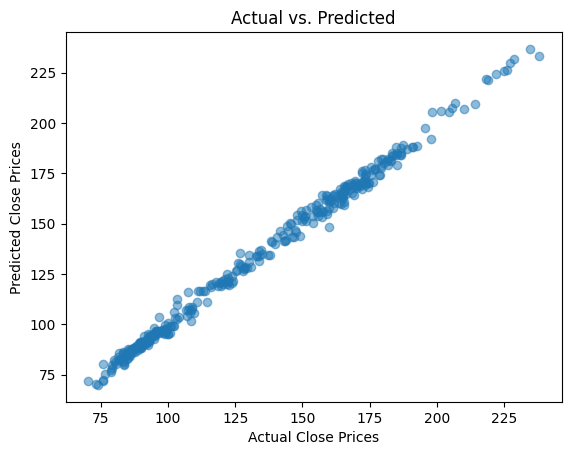

In [73]:
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Close Prices')
plt.ylabel('Predicted Close Prices')
plt.title('Actual vs. Predicted')
plt.show()


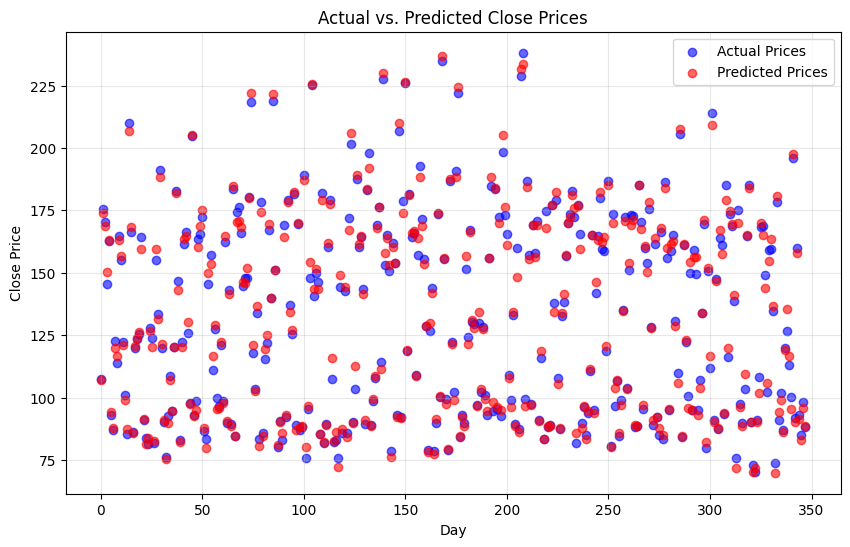

In [74]:
import matplotlib.pyplot as plt

# Create a sequence of days for the x-axis
days = range(len(y_test))  # Number of test samples

# Plot actual and predicted values
plt.figure(figsize=(10, 6))
plt.scatter(days, y_test, color='blue', alpha=0.6, label='Actual Prices')
plt.scatter(days, y_pred, color='red', alpha=0.6, label='Predicted Prices')
plt.xlabel('Day')
plt.ylabel('Close Price')
plt.title('Actual vs. Predicted Close Prices')
plt.legend()
plt.grid(alpha=0.3)
plt.show()


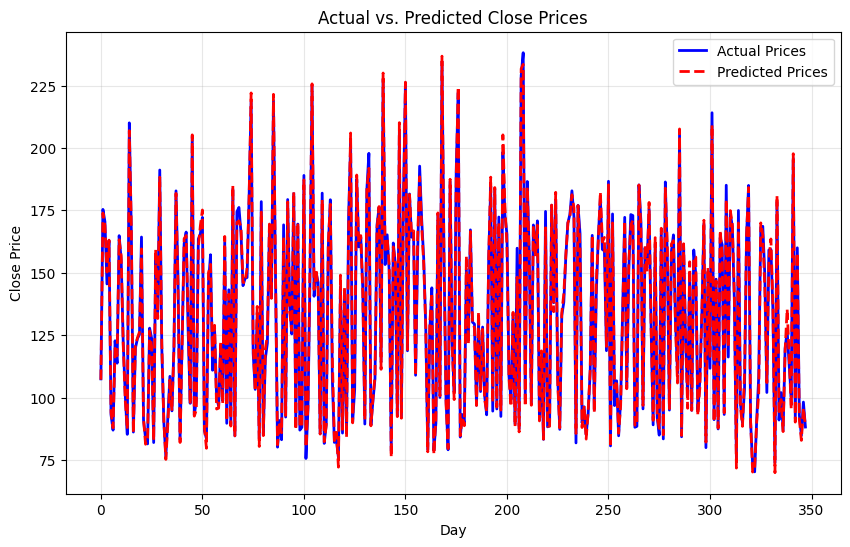

In [75]:
import matplotlib.pyplot as plt

# Create a sequence of days for the x-axis
days = range(len(y_test))  # Number of test samples

# Plot actual and predicted values as lines
plt.figure(figsize=(10, 6))
plt.plot(days, y_test, color='blue', label='Actual Prices', linewidth=2)
plt.plot(days, y_pred, color='red', linestyle='--', label='Predicted Prices', linewidth=2)
plt.xlabel('Day')
plt.ylabel('Close Price')
plt.title('Actual vs. Predicted Close Prices')
plt.legend()
plt.grid(alpha=0.3)
plt.show()


# Predicting on the Last 60 days

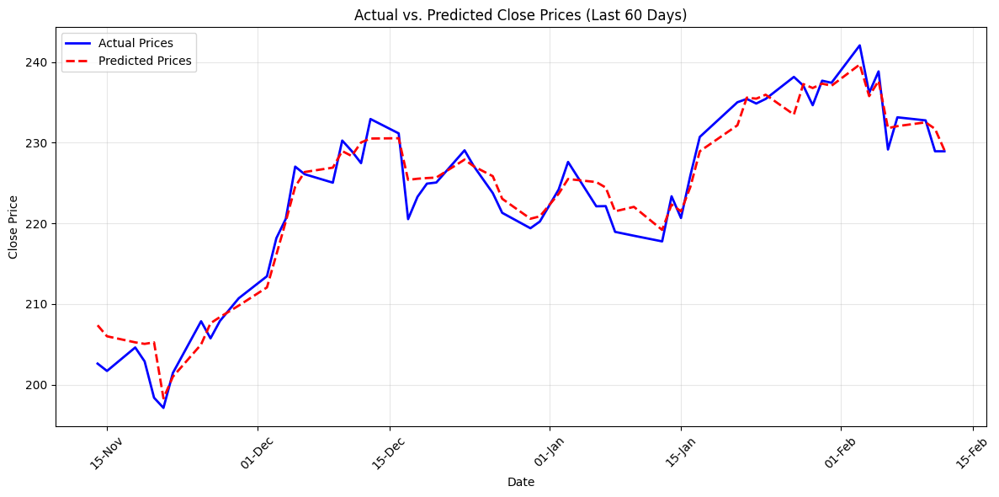

In [76]:
import matplotlib.pyplot as plt

# Extract the last 60 days of data
last_60_days = df_AMZN.iloc[-60:]

# Extract dates, actual prices, and predicted prices
dates = last_60_days['Date']  # Dates for the last 60 days
X_last_60 = last_60_days[features]
y_last_60 = last_60_days[target]
y_last_60_pred = rf_model.predict(X_last_60)  # Predictions for the last 60 days

# Plot actual and predicted values as line charts
plt.figure(figsize=(12, 6))
plt.plot(dates, y_last_60, color='blue', label='Actual Prices', linewidth=2)
plt.plot(dates, y_last_60_pred, color='red', linestyle='--', label='Predicted Prices', linewidth=2)

# Format the x-axis for dates
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d-%b'))  # Day and month (e.g., 09-Oct)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add labels, title, and legend
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs. Predicted Close Prices (Last 60 Days)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


## Training the model on selective additional  fetures

In [77]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Define features and target
features1 = [ 'Close_t-1', 'Close_t-2', 'Volume',
    'SMA_50', 'EMA_50',
    'RSI', 'MACD', 'Signal_Line',
    'BB_Upper', 'BB_Lower', 'ATR',
    'OBV', 'VWAP',
    'GDP_Growth_Rate', 'UNRATE', 'Inflation_rate', 'CPI', '10_Yr_Yield',
    'SP500_Close', 'NASDAQ_Close',
    'Weekday', 'Month', 'Year']
target = 'Close_t+1'

# Split data into training and testing sets
X = df_AMZN[features1]
y = df_AMZN[target]


# Drop rows with missing values (if any)
df_AMZN = df_AMZN.dropna(subset=features1 + [target])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # Shuffle = True here

# Train a Random Forest model
rf_model1 = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model1.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [78]:
y_pred = rf_model1.predict(X_test)  # Ensure X_test is used
print(f"Shape of y_pred: {y_pred.shape}")


Shape of y_pred: (348,)


In [79]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print the results
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R² Score: {r2}")

Mean Absolute Error (MAE): 2.3966421482480813
Mean Squared Error (MSE): 10.603120147538995
Root Mean Squared Error (RMSE): 3.2562432568128252
R² Score: 0.9933417227861807


### Evaluating Model Performance on the Last 60 Trading Days

In [80]:
import pandas as pd
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Extract the last 60 trading days from the dataset
last_60_days = df_AMZN.iloc[-60:].copy()

# Features and target for the last 60 days
X_last_60 = last_60_days[features1]
y_last_60 = last_60_days[target]

# Predict the 'Close_t+1' for the last 60 days
y_last_60_pred = rf_model1.predict(X_last_60)

# Shift the date column to reflect the actual next day's date
last_60_days['Date'] = last_60_days['Date'].shift(-1)

# Add the next trading day for the last record
last_60_days.iloc[-1, last_60_days.columns.get_loc('Date')] = "Next Possible Trading Day"

# Combine predictions with dates
results = pd.DataFrame({
    'Date': last_60_days['Date'],
    'Predicted': y_last_60_pred,
    'Actual': y_last_60.values
})

# Display the results
print(results)

# Calculate evaluation metrics
mae = mean_absolute_error(y_last_60, y_last_60_pred)
mse = mean_squared_error(y_last_60, y_last_60_pred)
rmse = mse ** 0.5

print(f"\nEvaluation Metrics for Last 60 Trading Days:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


                           Date   Predicted      Actual
1680        2024-11-15 00:00:00  206.118400  202.610001
1681        2024-11-18 00:00:00  203.161199  201.699997
1682        2024-11-19 00:00:00  202.419200  204.610001
1683        2024-11-20 00:00:00  203.075601  202.880005
1684        2024-11-21 00:00:00  202.059599  198.380005
1685        2024-11-22 00:00:00  199.100197  197.119995
1686        2024-11-25 00:00:00  201.879498  201.449997
1687        2024-11-26 00:00:00  206.600600  207.860001
1688        2024-11-27 00:00:00  207.911200  205.740005
1689        2024-11-29 00:00:00  208.458900  207.889999
1690        2024-12-02 00:00:00  210.140804  210.710007
1691        2024-12-03 00:00:00  213.509502  213.440002
1692        2024-12-04 00:00:00  216.867803  218.160004
1693        2024-12-05 00:00:00  220.778402  220.550003
1694        2024-12-06 00:00:00  225.040100  227.029999
1695        2024-12-09 00:00:00  226.381698  226.089996
1696        2024-12-10 00:00:00  226.058595  225

In [81]:
# Add the actual direction to the last 60 days data
last_60_days['Actual_Direction'] = (last_60_days[target] - last_60_days['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Predicted direction based on predictions
predicted_directions = np.where(y_last_60_pred - last_60_days['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (last_60_days['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(last_60_days)) * 100

# Print the result
print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 90.00%


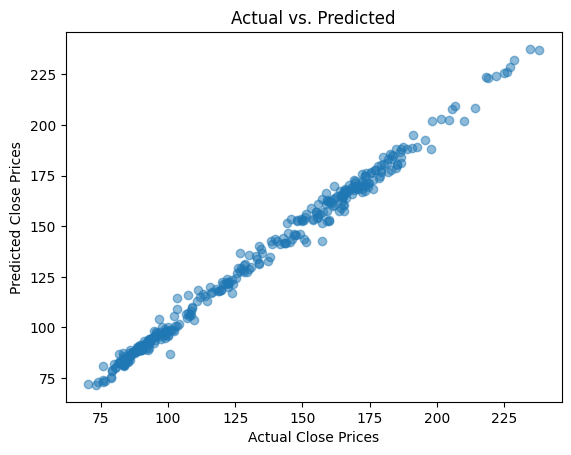

In [82]:
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Close Prices')
plt.ylabel('Predicted Close Prices')
plt.title('Actual vs. Predicted')
plt.show()


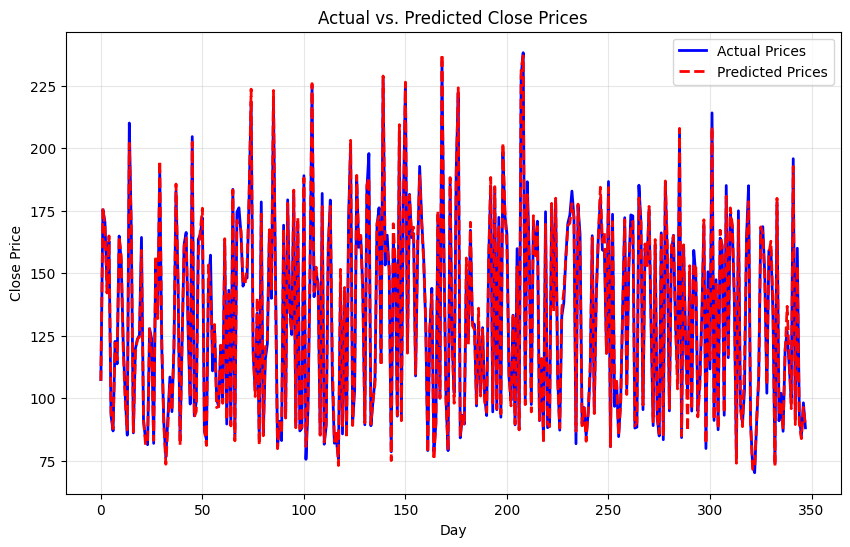

In [83]:
import matplotlib.pyplot as plt

# Create a sequence of days for the x-axis
days = range(len(y_test))  # Number of test samples

# Plot actual and predicted values as lines
plt.figure(figsize=(10, 6))
plt.plot(days, y_test, color='blue', label='Actual Prices', linewidth=2)
plt.plot(days, y_pred, color='red', linestyle='--', label='Predicted Prices', linewidth=2)
plt.xlabel('Day')
plt.ylabel('Close Price')
plt.title('Actual vs. Predicted Close Prices')
plt.legend()
plt.grid(alpha=0.3)
plt.show()


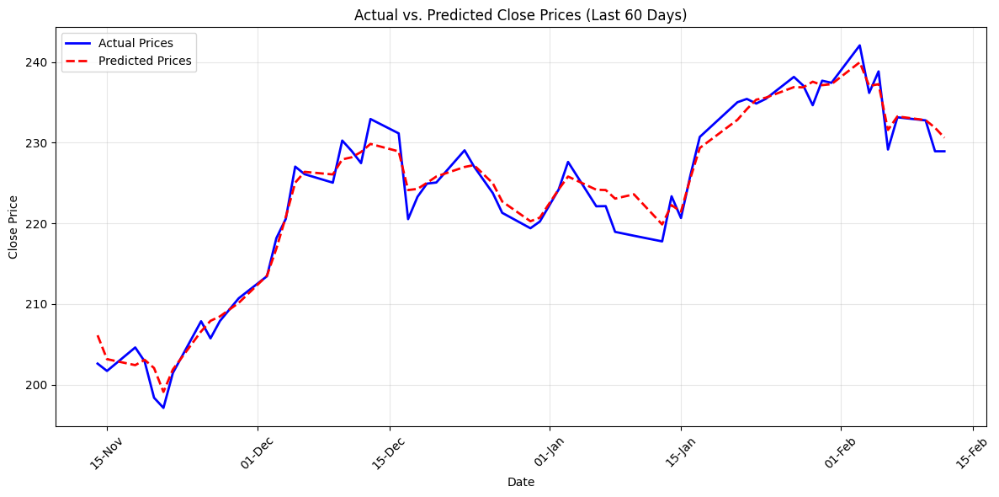

In [84]:
import matplotlib.pyplot as plt

# Extract the last 60 days of data
last_60_days = df_AMZN.iloc[-60:]

# Extract dates, actual prices, and predicted prices
dates = last_60_days['Date']  # Dates for the last 60 days
X_last_60 = last_60_days[features1]
y_last_60 = last_60_days[target]
y_last_60_pred = rf_model1.predict(X_last_60)  # Predictions for the last 60 days

# Plot actual and predicted values as line charts
plt.figure(figsize=(12, 6))
plt.plot(dates, y_last_60, color='blue', label='Actual Prices', linewidth=2)
plt.plot(dates, y_last_60_pred, color='red', linestyle='--', label='Predicted Prices', linewidth=2)

# Format the x-axis for dates
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d-%b'))  # Day and month (e.g., 09-Oct)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add labels, title, and legend
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs. Predicted Close Prices (Last 60 Days)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


## Training the model  by splitting the data chronologically

## using the 90:10 split

In [2144]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.9)  # 90% for training
test_size = total_rows - train_size  # Remaining 10% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 90% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 10% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (90%): {train_size}")
print(f"Testing Size (10%): {test_size}")




Total Rows: 1738
Training Size (90%): 1564
Testing Size (10%): 174


In [2145]:
# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']

features = ['Open', 'High', 'Low', 'Volume', 'Close']
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest rf_model
rf_model2 = RandomForestRegressor(n_estimators=200, random_state=42,max_depth=8, min_samples_split=10)
rf_model2.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model2.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)

Mean Absolute Error (MAE): 15.169907053535868
Mean Squared Error (MSE): 508.0872812364284
Root Mean Squared Error (RMSE): 22.540791495340805

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
1564 2024-05-31  178.339996  177.154385
1565 2024-06-03  179.339996  177.343482
1566 2024-06-04  181.279999  177.271904
1567 2024-06-05  185.000000  180.419990
1568 2024-06-06  184.300003  184.727136
...         ...         ...         ...
1733 2025-02-04  236.169998  187.755897
1734 2025-02-05  238.830002  187.005584
1735 2025-02-06  229.149994  186.750755
1736 2025-02-07  233.139999  186.730474
1737 2025-02-10  233.139999  187.755897

[174 rows x 3 columns]


#### Calculating directional accuracy

In [2146]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 57.47%


#### Evaluating both Training and testing sets 

In [2147]:
# Evaluate on the training set
y_train_pred = rf_model2.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = rf_model2.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")


Training MSE: 3.32321196049742, Testing MSE: 508.0872812364284
Training RMSE: 1.8229678989212674, Testing RMSE: 22.540791495340805
Training R²: 0.997160044476573, Testing R²: -0.20032381326461057


### Cross-Validation

In [2148]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


## Using 85:15 split 

In [2149]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.85)  # 85% for training
test_size = total_rows - train_size  # Remaining 15% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (85%): {train_size}")
print(f"Testing Size (15%): {test_size}")



Total Rows: 1738
Training Size (85%): 1477
Testing Size (15%): 261


In [2150]:

# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1',  
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']
    
features = ['Open', 'High', 'Low', 'Volume', 'Close']    
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2151]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)


Mean Absolute Error (MAE): 12.505412104814905
Mean Squared Error (MSE): 421.90079401287215
Root Mean Squared Error (RMSE): 20.540223806299487

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
1477 2024-01-26  161.259995  158.338377
1478 2024-01-29  159.000000  161.352007
1479 2024-01-30  155.199997  159.223057
1480 2024-01-31  159.279999  155.093698
1481 2024-02-01  171.809998  158.886144
...         ...         ...         ...
1733 2025-02-04  236.169998  183.425704
1734 2025-02-05  238.830002  183.425704
1735 2025-02-06  229.149994  183.105884
1736 2025-02-07  233.139999  183.559919
1737 2025-02-10  233.139999  183.425704

[261 rows x 3 columns]


#### Calculating directional accuracy

In [2152]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 57.09%


## Evaluating both Training and testing sets 

In [2153]:
# Evaluate on the training set
y_train_pred = rf_model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = rf_model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")


Training MSE: 1.1308237144827633, Testing MSE: 421.90079401287215
Training RMSE: 1.0634019533942767, Testing RMSE: 20.540223806299487
Training R²: 0.998937086601524, Testing R²: -0.0754622374191054


### Cross-Validation

In [2154]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


## Using 80:20 split 

In [2155]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.80)  # 85% for training
test_size = total_rows - train_size  # Remaining 15% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (80%): {train_size}")
print(f"Testing Size (20%): {test_size}")



Total Rows: 1738
Training Size (80%): 1390
Testing Size (20%): 348


In [2156]:

# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1',  
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']
    
features = ['Open', 'High', 'Low', 'Volume', 'Close']    
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2157]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)


Mean Absolute Error (MAE): 10.039851758233432
Mean Squared Error (MSE): 319.8584069449154
Root Mean Squared Error (RMSE): 17.884585735904405

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
1390 2023-09-21  129.119995  129.506551
1391 2023-09-22  131.270004  129.766471
1392 2023-09-25  125.980003  131.581109
1393 2023-09-26  125.980003  125.779770
1394 2023-09-27  125.980003  125.898914
...         ...         ...         ...
1733 2025-02-04  236.169998  183.390889
1734 2025-02-05  238.830002  183.390889
1735 2025-02-06  229.149994  182.982324
1736 2025-02-07  233.139999  183.438499
1737 2025-02-10  233.139999  183.390889

[348 rows x 3 columns]


#### Calculating directional accuracy

In [2158]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 57.47%


In [2159]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(final_rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 8.889820962442105 ± 5.730149509945628


## Using 75:25 split 

In [2160]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.75)  # 75% for training
test_size = total_rows - train_size  # Remaining 25% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (75%): {train_size}")
print(f"Testing Size (25%): {test_size}")



Total Rows: 1738
Training Size (75%): 1303
Testing Size (25%): 435


In [2161]:

# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1',  
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']
    
features = ['Open', 'High', 'Low', 'Volume', 'Close']    
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2162]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)


Mean Absolute Error (MAE): 8.47984636486536
Mean Squared Error (MSE): 257.8675084359964
Root Mean Squared Error (RMSE): 16.058253592342986

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
1303 2023-05-17  118.150002  115.202726
1304 2023-05-18  116.250000  120.538099
1305 2023-05-19  115.010002  116.451255
1306 2023-05-22  114.989998  117.499566
1307 2023-05-23  116.750000  117.229861
...         ...         ...         ...
1733 2025-02-04  236.169998  183.352584
1734 2025-02-05  238.830002  183.352584
1735 2025-02-06  229.149994  183.001254
1736 2025-02-07  233.139999  183.490244
1737 2025-02-10  233.139999  183.352584

[435 rows x 3 columns]


#### Calculating directional accuracy

In [2163]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 60.69%


### Cross-Validation

In [2164]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


## Using 70:30 split 

In [2165]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.70)  # 85% for training
test_size = total_rows - train_size  # Remaining 15% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (85%): {train_size}")
print(f"Testing Size (15%): {test_size}")



Total Rows: 1738
Training Size (85%): 1216
Testing Size (15%): 522


In [2166]:

# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1',  
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']
    
features = ['Open', 'High', 'Low', 'Volume', 'Close']    
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2167]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)


Mean Absolute Error (MAE): 7.3857104082947975
Mean Squared Error (MSE): 216.25116567184352
Root Mean Squared Error (RMSE): 14.705480803831051

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
1216 2023-01-11   95.269997   94.307190
1217 2023-01-12   98.120003   96.313575
1218 2023-01-13   96.050003   96.558594
1219 2023-01-17   95.459999   96.891844
1220 2023-01-18   93.680000   96.448898
...         ...         ...         ...
1733 2025-02-04  236.169998  183.314979
1734 2025-02-05  238.830002  183.314979
1735 2025-02-06  229.149994  182.973659
1736 2025-02-07  233.139999  183.552534
1737 2025-02-10  233.139999  183.314979

[522 rows x 3 columns]


#### Calculating directional accuracy

In [2168]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 64.18%


### Cross-Validation

In [2169]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


## Using 65:35 split 

In [2170]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.65)  # 85% for training
test_size = total_rows - train_size  # Remaining 15% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (85%): {train_size}")
print(f"Testing Size (15%): {test_size}")



Total Rows: 1738
Training Size (85%): 1129
Testing Size (15%): 609


In [2171]:

# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1',  
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']
    
features = ['Open', 'High', 'Low', 'Volume', 'Close']    
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2172]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)


Mean Absolute Error (MAE): 6.676217323015086
Mean Squared Error (MSE): 185.54854925398368
Root Mean Squared Error (RMSE): 13.621620654458987

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
1129 2022-09-07  129.820007  130.164915
1130 2022-09-08  133.270004  130.036443
1131 2022-09-09  136.449997  131.002450
1132 2022-09-12  126.820000  136.298297
1133 2022-09-13  128.550003  127.828670
...         ...         ...         ...
1733 2025-02-04  236.169998  183.484033
1734 2025-02-05  238.830002  183.484033
1735 2025-02-06  229.149994  183.126019
1736 2025-02-07  233.139999  183.692494
1737 2025-02-10  233.139999  183.484033

[609 rows x 3 columns]


#### Calculating directional accuracy

In [2173]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 65.19%


### Cross-Validation

In [2174]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


## Using 50:50 split 

In [2175]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.5)  # 85% for training
test_size = total_rows - train_size  # Remaining 15% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (85%): {train_size}")
print(f"Testing Size (15%): {test_size}")



Total Rows: 1738
Training Size (85%): 869
Testing Size (15%): 869


In [2176]:

# Define features and target
#features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1',  
 #           'NASDAQ_Close','CPI', 'OBV', 'VWAP', 'SMA_50', 'BB_Middle']
    
features = ['Open', 'High', 'Low', 'Volume', 'Close']    
target = 'Close_t+1'

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2177]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'],  # Include dates for the test set
    'Actual': y_test,
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)


Mean Absolute Error (MAE): 5.76589007168014
Mean Squared Error (MSE): 133.219945474038
Root Mean Squared Error (RMSE): 11.5420945011743

Predictions vs. Actuals for the Test Set:
           Date      Actual   Predicted
869  2021-08-25  165.800003  165.063467
870  2021-08-26  167.481506  164.815943
871  2021-08-27  171.078506  167.252654
872  2021-08-30  173.539505  172.403932
873  2021-08-31  173.949997  174.145321
...         ...         ...         ...
1733 2025-02-04  236.169998  184.214558
1734 2025-02-05  238.830002  184.214558
1735 2025-02-06  229.149994  183.229800
1736 2025-02-07  233.139999  184.781210
1737 2025-02-10  233.139999  184.214558

[869 rows x 3 columns]


#### Calculating directional accuracy

In [2178]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 65.48%


### Cross-Validation

In [2179]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


In [2180]:
# Reset 'Date' from the index
df_AMZN.reset_index(inplace=True)

# Verify the change
print(df_AMZN.head())


   index       Date       Open       High        Low      Close     Volume  \
0      0 2018-03-14  79.849998  80.321999  79.544502  79.550003   85188000   
1      1 2018-03-15  79.750000  79.845497  78.905502  79.115997   81394000   
2      2 2018-03-16  79.172501  79.472000  78.375000  78.584000  108500000   
3      3 2018-03-19  77.726501  78.083000  76.267502  77.246498  131616000   
4      4 2018-03-20  77.516998  79.349998  77.270500  79.325500   91632000   

   Weekday  Month  Year      SMA_5     SMA_10    SMA_50     EMA_10     EMA_50  \
0        2      3  2018  79.083202  77.541351  70.40240  77.865868  71.401164   
1        3      3  2018  79.387801  77.985700  70.79571  78.093164  71.703707   
2        4      3  2018  79.315700  78.342850  71.16319  78.182407  71.973522   
3        0      3  2018  78.781099  78.449451  71.49853  78.012242  72.180306   
4        1      3  2018  78.764400  78.693800  71.85590  78.251016  72.460509   

         RSI       ROC  Stochastic_Oscillato

In [2181]:
df_AMZN

,index,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,SMA_10,SMA_50,EMA_10,EMA_50,RSI,ROC,Stochastic_Oscillator,BB_Upper,BB_Lower,BB_Middle,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE,Close_t+1,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield
0,0,2018-03-14,79.849998,80.321999,79.544502,79.550003,85188000,2,3,2018,79.083202,77.541351,70.40240,77.865868,71.401164,73.193860,5.193568,83.670749,80.423398,71.340402,75.881900,1.701038,2.329739,2.593251,2.443817,1860242000,0.182807,75.630861,20328.553,3.851956,3.9,79.115997,79.408997,79.919502,130638000.0,2749.479980,3394630000,7496.810059,2112950000,2.04,249.577,0.74
1,1,2018-03-15,79.750000,79.845497,78.905502,79.115997,81394000,3,3,2018,79.387801,77.985700,70.79571,78.093164,71.703707,70.281764,5.950647,78.330123,80.689953,71.730198,76.210075,1.646678,2.298129,2.533738,2.461802,1778848000,0.108389,76.001000,20328.553,3.851956,3.9,78.584000,79.550003,79.408997,85188000.0,2747.330078,3543710000,7481.740234,2008290000,2.07,249.577,0.74
2,2,2018-03-16,79.172501,79.472000,78.375000,78.584000,108500000,4,3,2018,79.315700,78.342850,71.16319,78.182407,71.973522,66.774713,4.761210,71.783664,80.837446,72.132305,76.484875,1.607415,2.232822,2.415799,2.452601,1670348000,0.045134,76.327979,20328.553,3.851956,3.9,77.246498,79.115997,79.550003,81394000.0,2752.010010,5429140000,7481.990234,3089970000,2.05,249.577,0.77
3,3,2018-03-19,77.726501,78.083000,76.267502,77.246498,131616000,0,3,2018,78.781099,78.449451,71.49853,78.012242,72.180306,58.826949,1.399311,55.325135,80.668599,72.782351,76.725475,1.658064,2.022780,2.189170,2.399915,1538732000,0.082601,76.539415,20328.553,3.851956,3.9,79.325500,78.584000,79.115997,108500000.0,2712.919922,3327460000,7344.240234,2352810000,2.04,249.577,0.77
4,4,2018-03-20,77.516998,79.349998,77.270500,79.325500,91632000,1,3,2018,78.764400,78.693800,71.85590,78.251016,72.460509,65.667404,3.178243,80.908149,80.810687,73.231064,77.020875,1.689881,1.944132,2.152511,2.350434,1630364000,0.125728,76.833825,20328.553,3.851956,3.9,79.093002,77.246498,78.584000,131616000.0,2716.939941,3272590000,7364.299805,1976000000,2.05,249.577,0.81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1733,1733,2025-02-04,239.009995,242.520004,238.029999,242.059998,29713800,1,2,2025,237.773999,236.771999,223.34480,235.830918,223.051813,68.419108,4.919592,97.928831,245.179831,214.359171,229.769501,5.476317,7.905332,4.921836,4.147878,7409824300,0.250286,229.913362,29354.321,2.551182,4.2,236.169998,237.419998,237.679993,37285900.0,6037.879883,4410160000,19654.019531,6477050000,2.59,317.685,2.08
1734,1734,2025-02-05,237.020004,238.320007,235.199997,236.169998,38727300,2,2,2025,237.593997,236.887999,224.01060,235.892569,223.566252,58.213014,0.493598,71.409256,245.818196,214.576805,230.197501,5.575152,8.013248,4.657659,4.249834,7371097000,0.207235,230.435511,29354.321,2.551182,4.2,238.830002,242.059998,237.419998,29713800.0,6061.479980,4756250000,19692.330078,6712220000,2.57,317.685,2.08
1735,1735,2025-02-06,238.009995,239.660004,236.009995,238.830002,60897100,3,2,2025,238.431998,237.228999,224.81960,236.426648,224.164830,61.039570,1.448477,81.018508,246.623017,215.443984,231.033501,5.437642,7.997253,4.609799,4.321827,7431994100,0.277751,231.369826,29354.321,2.551182,4.2,229.149994,236.169998,242.059998,38727300.0,6083.569824,4847120000,19791.990234,6642100000,2.57,317.685,2.08
1736,1736,2025-02-07,232.500000,234.809998,228.059998,229.149994,77454000,4,2,2025,236.725998,236.658998,225.46020,235.103620,224.360327,48.249160,-2.427086,19.747855,246.464132,216.304869,231.384500,5.818525,7.735688,3.747573,4.206976,7354540100,0.183024,231.612223,29354.321,2.551182,4.2,233.139999,238.830002,236.169998,60897100.0,6025.990234,4766900000,19523.400391,7748940000,2.57,317.685,2.08


In [2182]:
# Rounding all float values to 2 decimal points
df_AMZN = df_AMZN.round(2)

# Print the updated DataFrame
print(df_AMZN.head())


   index       Date   Open   High    Low  Close     Volume  Weekday  Month  \
0      0 2018-03-14  79.85  80.32  79.54  79.55   85188000        2      3   
1      1 2018-03-15  79.75  79.85  78.91  79.12   81394000        3      3   
2      2 2018-03-16  79.17  79.47  78.38  78.58  108500000        4      3   
3      3 2018-03-19  77.73  78.08  76.27  77.25  131616000        0      3   
4      4 2018-03-20  77.52  79.35  77.27  79.33   91632000        1      3   

   Year  SMA_5  SMA_10  SMA_50  EMA_10  EMA_50    RSI   ROC  \
0  2018  79.08   77.54   70.40   77.87   71.40  73.19  5.19   
1  2018  79.39   77.99   70.80   78.09   71.70  70.28  5.95   
2  2018  79.32   78.34   71.16   78.18   71.97  66.77  4.76   
3  2018  78.78   78.45   71.50   78.01   72.18  58.83  1.40   
4  2018  78.76   78.69   71.86   78.25   72.46  65.67  3.18   

   Stochastic_Oscillator  BB_Upper  BB_Lower  BB_Middle   ATR  Std_Dev  MACD  \
0                  83.67     80.42     71.34      75.88  1.70     2.33  

In [2183]:
df_AMZN.describe()

,index,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,SMA_10,SMA_50,EMA_10,EMA_50,RSI,ROC,Stochastic_Oscillator,BB_Upper,BB_Lower,BB_Middle,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE,Close_t+1,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield
count,1738.000000,1738,1738.000000,1738.000000,1738.000000,1738.000000,1.738000e+03,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1.738000e+03,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1738.000000,1.738000e+03,1738.000000,1.738000e+03,1738.000000,1.738000e+03,1738.000000,1738.000000,1738.000000
mean,868.500000,2021-08-25 02:42:23.613348608,132.511674,134.059770,130.831985,132.479770,7.440104e+07,2.024166,6.596663,2021.142693,132.302526,132.072543,130.273982,132.072595,130.314028,53.294166,0.861041,56.736623,140.194235,123.034183,131.614327,3.562727,4.401341,0.628285,0.624609,5.009032e+09,0.036381,131.490834,24480.866007,5.670644,4.233372,132.568142,132.391318,132.305455,7.445591e+07,3914.446979,4.167912e+09,12013.839085,4.296558e+09,2.111979,279.642296,0.557727
min,0.000000,2018-03-14 00:00:00,67.300000,69.800000,65.350000,67.200000,1.500750e+07,0.000000,1.000000,2018.000000,70.320000,70.900000,70.400000,71.830000,71.400000,21.170000,-26.050000,0.000000,77.510000,66.840000,72.640000,0.980000,0.670000,-12.430000,-10.700000,9.472120e+08,-0.340000,72.220000,19935.440000,-8.200000,3.400000,67.200000,67.200000,67.200000,1.500750e+07,2237.400000,1.296530e+09,6192.920000,9.589500e+08,0.140000,249.580000,-1.190000
25%,434.250000,2019-12-03 06:00:00,93.940000,95.032500,92.935000,94.130000,4.852982e+07,1.000000,4.000000,2019.000000,93.905000,94.050000,93.690000,93.952500,93.615000,45.205000,-2.887500,29.977500,99.400000,87.412500,93.882500,2.770000,2.580000,-1.030000,-0.877500,3.375639e+09,-0.050000,93.815000,21684.550000,3.850000,3.600000,94.130000,94.115000,94.065000,4.856048e+07,2987.072500,3.551438e+09,8308.360000,2.581025e+09,1.720000,257.000000,-0.530000
50%,868.500000,2021-08-24 12:00:00,130.350000,131.990000,128.740000,130.020000,6.392285e+07,2.000000,7.000000,2021.000000,130.180000,129.870000,129.685000,130.265000,129.185000,53.815000,1.135000,61.065000,140.335000,121.130000,130.465000,3.530000,3.880000,0.890000,0.890000,5.542204e+09,0.030000,130.440000,23921.990000,4.960000,3.900000,130.095000,129.980000,129.890000,6.398500e+07,3949.330000,3.951635e+09,11989.490000,4.448795e+09,2.180000,272.790000,0.680000
75%,1302.750000,2023-05-16 18:00:00,165.207500,166.660000,163.330000,164.957500,8.886735e+07,3.000000,10.000000,2023.000000,164.505000,164.700000,161.435000,164.445000,161.997500,61.545000,4.697500,84.137500,174.217500,155.085000,164.110000,4.500000,5.640000,2.407500,2.257500,6.206758e+09,0.120000,164.587500,27453.820000,7.900000,4.200000,164.960000,164.935000,164.885000,8.894600e+07,4480.452500,4.534548e+09,14431.177500,5.225805e+09,2.450000,303.360000,1.560000
max,1737.000000,2025-02-10 00:00:00,239.020000,242.520000,238.030000,242.060000,3.113460e+08,4.000000,12.000000,2025.000000,238.430000,237.230000,226.090000,236.430000,224.700000,81.290000,26.240000,100.000000,246.620000,218.490000,232.090000,7.150000,17.800000,8.330000,7.260000,7.439346e+09,0.410000,232.250000,29354.320000,17.220000,11.000000,242.060000,242.060000,242.060000,3.113460e+08,6118.710000,9.976520e+09,20173.890000,1.337113e+10,3.590000,317.680000,2.520000
std,501.861701,NaN,39.681130,40.028289,39.304406,39.671316,3.900043e+07,1.401329,3.416768,2.004401,39.485396,39.257870,37.803861,39.193952,37.662972,11.289508,6.524960,30.121180,40.892311,37.296658,38.831999,1.341135,2.497053,2.832434,2.640342,1.596053e+09,0.125502,38.868891,3158.349551,4.404995,1.068501,39.724375,39.618097,39.569956,3.901244e+07,941.360192,1.

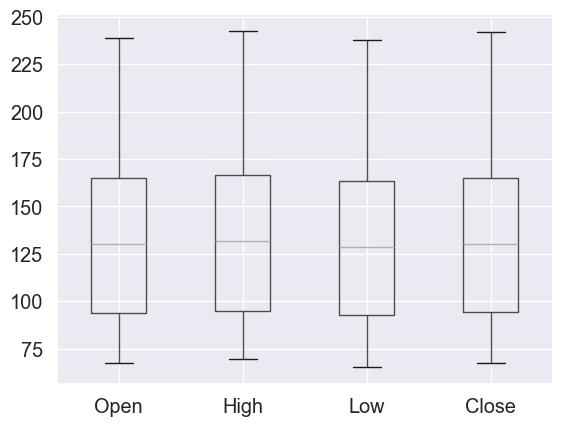

In [2184]:
import matplotlib.pyplot as plt
df_AMZN[['Open', 'High', 'Low', 'Close']].boxplot()
plt.show()


## Predicting the direction of Stock Price

In [2185]:
df_AMZN['Target'] = (df_AMZN['Close_t+1'] > df_AMZN['Close']).astype(int)
df_AMZN.head()

,index,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,SMA_10,SMA_50,EMA_10,EMA_50,RSI,ROC,Stochastic_Oscillator,BB_Upper,BB_Lower,BB_Middle,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE,Close_t+1,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield,Target
0,0,2018-03-14,79.85,80.32,79.54,79.55,85188000,2,3,2018,79.08,77.54,70.40,77.87,71.40,73.19,5.19,83.67,80.42,71.34,75.88,1.70,2.33,2.59,2.44,1860242000,0.18,75.63,20328.55,3.85,3.9,79.12,79.41,79.92,130638000.0,2749.48,3394630000,7496.81,2112950000,2.04,249.58,0.74,0
1,1,2018-03-15,79.75,79.85,78.91,79.12,81394000,3,3,2018,79.39,77.99,70.80,78.09,71.70,70.28,5.95,78.33,80.69,71.73,76.21,1.65,2.30,2.53,2.46,1778848000,0.11,76.00,20328.55,3.85,3.9,78.58,79.55,79.41,85188000.0,2747.33,3543710000,7481.74,2008290000,2.07,249.58,0.74,0
2,2,2018-03-16,79.17,79.47,78.38,78.58,108500000,4,3,2018,79.32,78.34,71.16,78.18,71.97,66.77,4.76,71.78,80.84,72.13,76.48,1.61,2.23,2.42,2.45,1670348000,0.05,76.33,20328.55,3.85,3.9,77.25,79.12,79.55,81394000.0,2752.01,5429140000,7481.99,3089970000,2.05,249.58,0.77,0
3,3,2018-03-19,77.73,78.08,76.27,77.25,131616000,0,3,2018,78.78,78.45,71.50,78.01,72.18,58.83,1.40,55.33,80.67,72.78,76.73,1.66,2.02,2.19,2.40,1538732000,0.08,76.54,20328.55,3.85,3.9,79.33,78.58,79.12,108500000.0,2712.92,3327460000,7344.24,2352810000,2.04,249.58,0.77,1
4,4,2018-03-20,77.52,79.35,77.27,79.33,91632000,1,3,2018,78.76,78.69,71.86,78.25,72.46,65.67,3.18,80.91,80.81,73.23,77.02,1.69,1.94,2.15,2.35,1630364000,0.13,76.83,20328.55,3.85,3.9,79.09,77.25,78.58,131616000.0,2716.94,3272590000,7364.30,1976000000,2.05,249.58,0.81,0


In [2186]:
df_AMZN.tail()

,index,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,SMA_10,SMA_50,EMA_10,EMA_50,RSI,ROC,Stochastic_Oscillator,BB_Upper,BB_Lower,BB_Middle,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE,Close_t+1,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield,Target
1733,1733,2025-02-04,239.01,242.52,238.03,242.06,29713800,1,2,2025,237.77,236.77,223.34,235.83,223.05,68.42,4.92,97.93,245.18,214.36,229.77,5.48,7.91,4.92,4.15,7409824300,0.25,229.91,29354.32,2.55,4.2,236.17,237.42,237.68,37285900.0,6037.88,4410160000,19654.02,6477050000,2.59,317.68,2.08,0
1734,1734,2025-02-05,237.02,238.32,235.20,236.17,38727300,2,2,2025,237.59,236.89,224.01,235.89,223.57,58.21,0.49,71.41,245.82,214.58,230.20,5.58,8.01,4.66,4.25,7371097000,0.21,230.44,29354.32,2.55,4.2,238.83,242.06,237.42,29713800.0,6061.48,4756250000,19692.33,6712220000,2.57,317.68,2.08,1
1735,1735,2025-02-06,238.01,239.66,236.01,238.83,60897100,3,2,2025,238.43,237.23,224.82,236.43,224.16,61.04,1.45,81.02,246.62,215.44,231.03,5.44,8.00,4.61,4.32,7431994100,0.28,231.37,29354.32,2.55,4.2,229.15,236.17,242.06,38727300.0,6083.57,4847120000,19791.99,6642100000,2.57,317.68,2.08,0
1736,1736,2025-02-07,232.50,234.81,228.06,229.15,77454000,4,2,2025,236.73,236.66,225.46,235.10,224.36,48.25,-2.43,19.75,246.46,216.30,231.38,5.82,7.74,3.75,4.21,7354540100,0.18,231.61,29354.32,2.55,4.2,233.14,238.83,236.17,60897100.0,6025.99,4766900000,19523.40,7748940000,2.57,317.68,2.08,1
1737,1737,2025-02-10,230.54,233.91,229.20,233.14,35283207,0,2,2025,235.87,236.43,226.09,234.75,224.70,52.65,-0.97,43.70,246.06,218.13,232.09,5.74,7.16,3.35,4.04,7389823307,0.22,232.25,29354.32,2.55,4.2,233.14,229.15,238.83,77454000.0,6066.44,2743606000,19714.27,9034119000,2.57,317.68,2.08,0


In [2187]:
df_AMZN["Target"].value_counts()

Target
1    913
0    825
Name: count, dtype: int64

In [2188]:
import pandas as pd

# Example: Calculate for 'Close' prices
skewness = df_AMZN['Close'].skew()
kurtosis = df_AMZN['Close'].kurtosis()
std_dev = df_AMZN['Close'].std()

print(f"Skewness: {skewness}")
print(f"Kurtosis: {kurtosis}")
print(f"Standard Deviation: {std_dev}")


Skewness: 0.30956134998363655
Kurtosis: -0.9174904578134666
Standard Deviation: 39.671316214256436


In [2189]:
df_AMZN.columns

Index(['index', 'Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Weekday',
       'Month', 'Year', 'SMA_5', 'SMA_10', 'SMA_50', 'EMA_10', 'EMA_50', 'RSI',
       'ROC', 'Stochastic_Oscillator', 'BB_Upper', 'BB_Lower', 'BB_Middle',
       'ATR', 'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'CMF', 'VWAP', 'GDP',
       'GDP_Growth_Rate', 'UNRATE', 'Close_t+1', 'Close_t-1', 'Close_t-2',
       'Volume_t-1', 'SP500_Close', 'SP500_Volume', 'NASDAQ_Close',
       'NASDAQ_Volume', 'Inflation_rate', 'CPI', '10_Yr_Yield', 'Target'],
      dtype='object')

### Training on Randomforest 

- Random forests work by training a bunch of individual decision trees with randomised parameters, and averaging those results from decision trees
- because of the process they are resistant to overfit
- they can also pickup non-linear tendencies in the data(ex: open price and target)

In [2190]:
from sklearn.ensemble import RandomForestClassifier

#initialising the model

# n_estimators=100.... no.of individual decision trees we'd like to train

# min_samples_split=100.....helps to protect us against overfitting
# (decision trees have a tendency to overfit, if they build the tree too deelpy)
# (the higher we set it, the less accurate the model will be, but the less it will overfit....
## .... we might need to experiment with this and find the optimal number)

#  random_state = 1 ... ensures reproducibility by controlling the randomness in model training, 
##...so the results are consistent across runs. 
##..This is important for debugging and comparing model performance.



## using 80:20 split 

In [2191]:
# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.8)  # 90% for training
test_size = total_rows - train_size  # Remaining 10% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 90% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 10% rows for testing


# Define features and target for classification
features = ['Open', 'High', 'Low', 'Volume', 'Close_t-1', 'Close_t-2', 'Volume_t-1', 'Weekday', 'Month']
target = 'Target'


In [2192]:
# Split the dataset
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]


In [2193]:
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")


X_train shape: (1390, 9)
X_test shape: (348, 9)


In [2194]:

# Train the Random Forest Classifier with the best parameters
rf_classifier = RandomForestClassifier(
    max_depth=10,
    min_samples_leaf=4,
    min_samples_split=2,
    n_estimators=100,
    random_state=42
)
rf_classifier.fit(X_train, y_train)


RandomForestClassifier(max_depth=10, min_samples_leaf=4, random_state=42)

In [2195]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Predict on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("Confusion Matrix:\n", conf_matrix)
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Accuracy: 48.56%
Confusion Matrix:
 [[ 83  79]
 [100  86]]

Classification Report:
               precision    recall  f1-score   support

           0       0.45      0.51      0.48       162
           1       0.52      0.46      0.49       186

    accuracy                           0.49       348
   macro avg       0.49      0.49      0.49       348
weighted avg       0.49      0.49      0.49       348



In [2196]:
# Create a DataFrame to show predictions and actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'].reset_index(drop=True),  # Reset index for alignment
    'Actual': y_test.reset_index(drop=True),          # Actual values
    'Predicted': y_pred                               # Predicted values
})

# Display the results
print("Date-Wise Predictions and Actuals:")
print(results)

# Optionally, save to CSV for further analysis
#results.to_csv("test_predictions.csv", index=False)



Date-Wise Predictions and Actuals:
          Date  Actual  Predicted
0   2023-09-21       0          1
1   2023-09-22       1          0
2   2023-09-25       0          0
3   2023-09-26       0          1
4   2023-09-27       0          0
..         ...     ...        ...
343 2025-02-04       0          1
344 2025-02-05       1          0
345 2025-02-06       0          0
346 2025-02-07       1          0
347 2025-02-10       0          0

[348 rows x 3 columns]


In [2197]:
# Get value counts for actual and predicted values
actual_counts = y_test.value_counts()
predicted_counts = pd.Series(y_pred).value_counts()

# Display the counts
print("Actual Value Counts:")
print(actual_counts)

print("\nPredicted Value Counts:")
print(predicted_counts)


Actual Value Counts:
Target
1    186
0    162
Name: count, dtype: int64

Predicted Value Counts:
0    183
1    165
Name: count, dtype: int64


In [2198]:
# Calculate the number of correct predictions
correct_predictions = (results['Actual'] == results['Predicted']).sum()

# Calculate accuracy
accuracy = (correct_predictions / len(results)) * 100

# Print the accuracy
print(f"Directional Accuracy: {accuracy:.2f}%")


Directional Accuracy: 48.56%


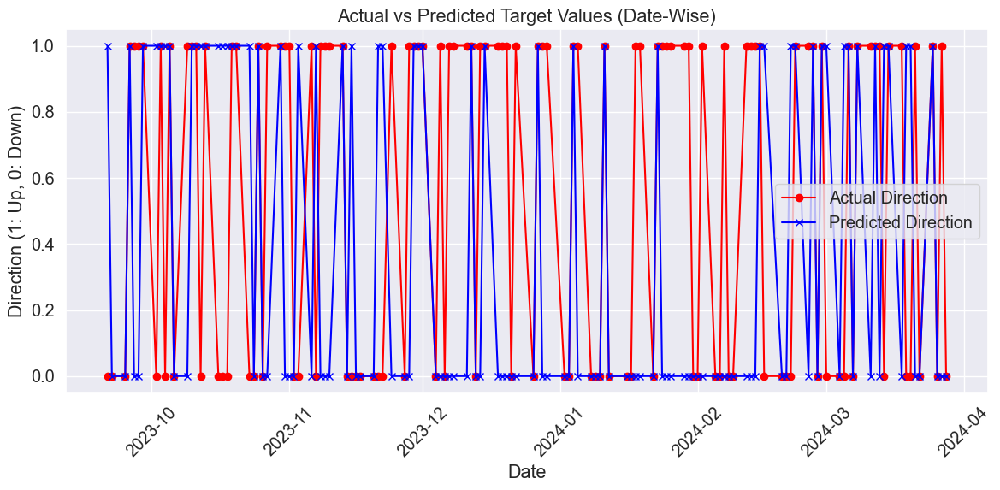

In [2199]:
combined['Date'] = test_data['Date'].reset_index(drop=True)

# Plot using dates
plt.figure(figsize=(12, 6))
plt.plot(combined['Date'], combined['Actual'], label='Actual Direction', marker='o', color='red')
plt.plot(combined['Date'], combined['Predicted'], label='Predicted Direction', marker='x', color='blue')

# Format the x-axis
plt.xticks(rotation=45)
plt.title('Actual vs Predicted Target Values (Date-Wise)')
plt.xlabel('Date')
plt.ylabel('Direction (1: Up, 0: Down)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


############################

In [2200]:
df_AMZN

,index,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_5,SMA_10,SMA_50,EMA_10,EMA_50,RSI,ROC,Stochastic_Oscillator,BB_Upper,BB_Lower,BB_Middle,ATR,Std_Dev,MACD,Signal_Line,OBV,CMF,VWAP,GDP,GDP_Growth_Rate,UNRATE,Close_t+1,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,SP500_Volume,NASDAQ_Close,NASDAQ_Volume,Inflation_rate,CPI,10_Yr_Yield,Target
0,0,2018-03-14,79.85,80.32,79.54,79.55,85188000,2,3,2018,79.08,77.54,70.40,77.87,71.40,73.19,5.19,83.67,80.42,71.34,75.88,1.70,2.33,2.59,2.44,1860242000,0.18,75.63,20328.55,3.85,3.9,79.12,79.41,79.92,130638000.0,2749.48,3394630000,7496.81,2112950000,2.04,249.58,0.74,0
1,1,2018-03-15,79.75,79.85,78.91,79.12,81394000,3,3,2018,79.39,77.99,70.80,78.09,71.70,70.28,5.95,78.33,80.69,71.73,76.21,1.65,2.30,2.53,2.46,1778848000,0.11,76.00,20328.55,3.85,3.9,78.58,79.55,79.41,85188000.0,2747.33,3543710000,7481.74,2008290000,2.07,249.58,0.74,0
2,2,2018-03-16,79.17,79.47,78.38,78.58,108500000,4,3,2018,79.32,78.34,71.16,78.18,71.97,66.77,4.76,71.78,80.84,72.13,76.48,1.61,2.23,2.42,2.45,1670348000,0.05,76.33,20328.55,3.85,3.9,77.25,79.12,79.55,81394000.0,2752.01,5429140000,7481.99,3089970000,2.05,249.58,0.77,0
3,3,2018-03-19,77.73,78.08,76.27,77.25,131616000,0,3,2018,78.78,78.45,71.50,78.01,72.18,58.83,1.40,55.33,80.67,72.78,76.73,1.66,2.02,2.19,2.40,1538732000,0.08,76.54,20328.55,3.85,3.9,79.33,78.58,79.12,108500000.0,2712.92,3327460000,7344.24,2352810000,2.04,249.58,0.77,1
4,4,2018-03-20,77.52,79.35,77.27,79.33,91632000,1,3,2018,78.76,78.69,71.86,78.25,72.46,65.67,3.18,80.91,80.81,73.23,77.02,1.69,1.94,2.15,2.35,1630364000,0.13,76.83,20328.55,3.85,3.9,79.09,77.25,78.58,131616000.0,2716.94,3272590000,7364.30,1976000000,2.05,249.58,0.81,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1733,1733,2025-02-04,239.01,242.52,238.03,242.06,29713800,1,2,2025,237.77,236.77,223.34,235.83,223.05,68.42,4.92,97.93,245.18,214.36,229.77,5.48,7.91,4.92,4.15,7409824300,0.25,229.91,29354.32,2.55,4.2,236.17,237.42,237.68,37285900.0,6037.88,4410160000,19654.02,6477050000,2.59,317.68,2.08,0
1734,1734,2025-02-05,237.02,238.32,235.20,236.17,38727300,2,2,2025,237.59,236.89,224.01,235.89,223.57,58.21,0.49,71.41,245.82,214.58,230.20,5.58,8.01,4.66,4.25,7371097000,0.21,230.44,29354.32,2.55,4.2,238.83,242.06,237.42,29713800.0,6061.48,4756250000,19692.33,6712220000,2.57,317.68,2.08,1
1735,1735,2025-02-06,238.01,239.66,236.01,238.83,60897100,3,2,2025,238.43,237.23,224.82,236.43,224.16,61.04,1.45,81.02,246.62,215.44,231.03,5.44,8.00,4.61,4.32,7431994100,0.28,231.37,29354.32,2.55,4.2,229.15,236.17,242.06,38727300.0,6083.57,4847120000,19791.99,6642100000,2.57,317.68,2.08,0
1736,1736,2025-02-07,232.50,234.81,228.06,229.15,77454000,4,2,2025,236.73,236.66,225.46,235.10,224.36,48.25,-2.43,19.75,246.46,216.30,231.38,5.82,7.74,3.75,4.21,7354540100,0.18,231.61,29354.32,2.55,4.2,233.14,238.83,236.17,60897100.0,6025.99,4766900000,19523.40,7748940000,2.57,317.68,2.08,1


In [2201]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


In [2202]:
# Calculate the training and testing sizes dynamically
total_rows = len(df_AMZN)
train_size = int(total_rows * 0.80)  # 85% for training
test_size = total_rows - train_size  # Remaining 15% for testing

# Split the dataset
train_data = df_AMZN.iloc[:train_size]  # First 85% rows for training
test_data = df_AMZN.iloc[train_size:]  # Remaining 15% rows for testing

# Display the sizes of the training and testing datasets
print(f"Total Rows: {total_rows}")
print(f"Training Size (85%): {train_size}")
print(f"Testing Size (15%): {test_size}")


Total Rows: 1738
Training Size (85%): 1390
Testing Size (15%): 348


In [2203]:
selected_features

['Open',
 'High',
 'Low',
 'Close',
 'Year',
 'SMA_5',
 'SMA_10',
 'SMA_50',
 'EMA_10',
 'EMA_50',
 'BB_Upper',
 'BB_Lower',
 'BB_Middle',
 'ATR',
 'OBV',
 'VWAP',
 'GDP',
 'Close_t-1',
 'Close_t-2',
 'SP500_Close',
 'NASDAQ_Close',
 'NASDAQ_Volume',
 'CPI']

In [2204]:

# Define features and target
features = [
    'Close',
 'Close_t-1',
 'Close_t-2',
 'Volume',
 'SMA_50',
 'EMA_50',
 'RSI',
 'Stochastic_Oscillator',
 'MACD',
 'Signal_Line',
 'BB_Upper',
 'BB_Lower',
 'ATR',
 'OBV',
 'VWAP',
 'GDP',
 'GDP_Growth_Rate',
 'UNRATE',
 'Inflation_rate',
 'CPI',
 '10_Yr_Yield',
 'SP500_Close',
 'NASDAQ_Close',
 'Weekday',
 'Month',
 'Year'
]
target = 'Close_t+1'

# Drop any rows with missing values in the features or target columns
train_data = train_data.dropna(subset=features + [target])
test_data = test_data.dropna(subset=features + [target])

# Prepare training and testing sets
X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]

# Train the Random Forest model
rf_model2 = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model2.fit(X_train, y_train)



RandomForestRegressor(random_state=42)

In [2205]:
# Predict on the test set
y_pred = rf_model2.predict(X_test)

# Evaluate the rf_model2
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Display predictions vs. actual values with dates
results = pd.DataFrame({
    'Date': test_data['Date'].reset_index(drop=True),  # Include dates for the test set
    'Actual': y_test.reset_index(drop=True),
    'Predicted': y_pred
})

print("\nPredictions vs. Actuals for the Test Set:")
print(results)

# Optionally save the results to a CSV
# results.to_csv("test_predictions.csv", index=False)


Mean Absolute Error (MAE): 11.818965229885068
Mean Squared Error (MSE): 372.87369100830455
Root Mean Squared Error (RMSE): 19.30993762310755

Predictions vs. Actuals for the Test Set:
          Date  Actual  Predicted
0   2023-09-21  129.12   135.1736
1   2023-09-22  131.27   135.1448
2   2023-09-25  125.98   135.5615
3   2023-09-26  125.98   125.9227
4   2023-09-27  125.98   125.6332
..         ...     ...        ...
343 2025-02-04  236.17   181.5989
344 2025-02-05  238.83   180.3356
345 2025-02-06  229.15   180.5151
346 2025-02-07  233.14   179.7713
347 2025-02-10  233.14   180.2859

[348 rows x 3 columns]


### **Interpretation of Metrics**

#### **1. Metrics (Set 1)**
- **MAE**: 3.19 → Average error of predictions is 3.19 units.
- **MSE**: 16.22 → Slightly higher squared error, penalizing large deviations more.
- **RMSE**: 4.03 → Indicates moderate deviations between actual and predicted values.

#### **2. Metrics (Set 2)**
- **MAE**: 3.09 → Average error of predictions is slightly lower at 3.09 units.
- **MSE**: 15.67 → Lower squared error compared to Set 1, fewer large deviations.
- **RMSE**: 3.96 → Indicates slightly better accuracy than Set 1.

---
- **Set 2 performs slightly better than Set 1** with:
  - Lower MAE (3.09 vs. 3.19).
  - Lower MSE (15.67 vs. 16.22).
  - Lower RMSE (3.96 vs. 4.03).
- Both sets show moderate prediction accuracy with minor deviations.

#### Calculating directional accuracy

In [2206]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 57.18%


#### Evaluating both Training and testing sets 

In [2207]:
# Evaluate on the training set
y_train_pred = rf_model2.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = rf_model2.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")


Training MSE: 1.144057609999991, Testing MSE: 372.87369100830455
Training RMSE: 1.0696062873786742, Testing RMSE: 19.30993762310755
Training R²: 0.9989575512899123, Testing R²: 0.5240727975527342


### Cross-Validation

In [2208]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_model2, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.240108155054477 ± 6.131811838809776


### **Performing Grid Search to Optimize Hyperparameters and Reduce Variability**

In [2209]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    RandomForestRegressor(random_state=42),
    param_grid,
    cv=5,
    scoring='neg_root_mean_squared_error',  # Optimize for RMSE
    verbose=2,
    n_jobs=-1
)

# Run grid search on training data
grid_search.fit(X_train, y_train)

# Best parameters
print("Best Parameters:", grid_search.best_params_)

# Train model with best parameters
best_model = grid_search.best_estimator_


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


In [2210]:

# Get the best score
print("Best Score (Negative RMSE):", grid_search.best_score_)

Best Score (Negative RMSE): -4.051745589529512


In [2211]:
# Access all results
results = pd.DataFrame(grid_search.cv_results_)
print(results[['params', 'mean_test_score']])

                                               params  mean_test_score
0   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.369573
1   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.375351
2   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.361309
3   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.361395
4   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.376063
..                                                ...              ...
76  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.106687
77  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.102407
78  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.051746
79  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.083556
80  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.083009

[81 rows x 2 columns]


In [2212]:
# Train the final model with the best parameters
final_rf_model2 = RandomForestRegressor(
    max_depth=10,
    min_samples_leaf=4,
    min_samples_split=10,
    n_estimators=100,
    random_state=42
)
final_rf_model2.fit(X_train, y_train)


RandomForestRegressor(max_depth=10, min_samples_leaf=4, min_samples_split=10,
                      random_state=42)

In [2213]:
# Predict on the test set
y_pred = final_rf_model2.predict(X_test)

# Calculate evaluation metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


Mean Absolute Error (MAE): 10.879271266917867
Mean Squared Error (MSE): 346.2356743284124
Root Mean Squared Error (RMSE): 18.607409124550692


In [2214]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 59.77%


In [2215]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Evaluate on the training set
y_train_pred = final_rf_model2.predict(X_train)  # Use final_model
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = final_rf_model2.predict(X_test)  # Use final_model
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")


Training MSE: 3.1211514689103717, Testing MSE: 346.2356743284124
Training RMSE: 1.7666780886484021, Testing RMSE: 18.607409124550692
Training R²: 0.9971560520254272, Testing R²: 0.5580729350333973


In [2216]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(final_rf_model2, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 8.885565142977962 ± 5.696936378138939


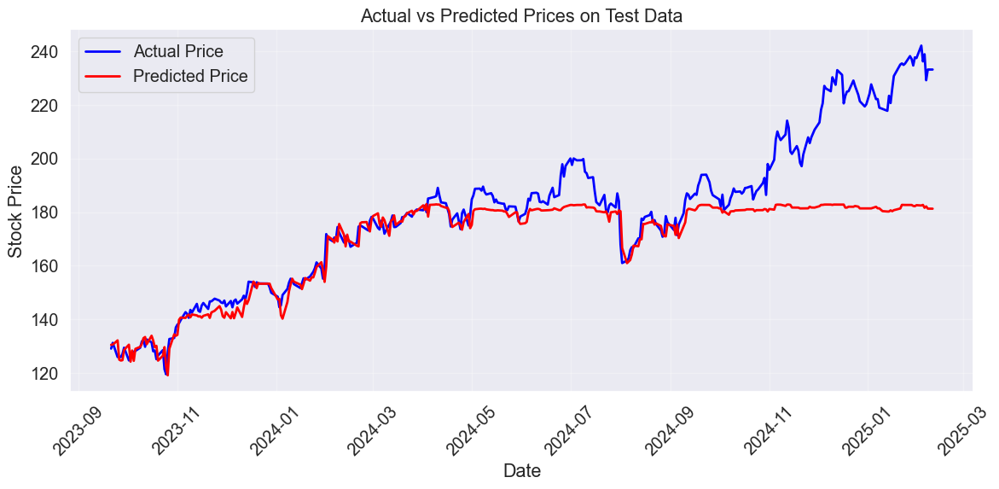

In [2217]:
import matplotlib.pyplot as plt

# Predict on the test set
y_pred = final_rf_model2.predict(X_test)

# Create a DataFrame to combine actual and predicted values with dates
results = pd.DataFrame({
    'Date': test_data['Date'].reset_index(drop=True),  # Reset index for alignment
    'Actual': y_test.reset_index(drop=True),          # Actual values
    'Predicted': y_pred                               # Predicted values
})


# Plot the actual vs predicted prices as a smooth line chart
plt.figure(figsize=(12, 6))
plt.plot(results['Date'], results['Actual'], label='Actual Price', color='blue', linewidth=2)
plt.plot(results['Date'], results['Predicted'], label='Predicted Price', color='red', linewidth=2)
plt.title('Actual vs Predicted Prices on Test Data')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)  # Rotate date labels for better readability
plt.tight_layout()
plt.show()



#  LSTM 

In [123]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Keras modules for deep learning
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model

from tensorflow.keras.layers import Input, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam




from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import TimeDistributed

import tensorflow as tf
import keras
from keras import optimizers
from keras.callbacks import History
from keras.models import Model
from keras.layers import Dense, Dropout, LSTM, Input, Activation, concatenate


In [124]:

# Load the CSV file into a DataFrame
data = pd.read_csv('merged_df_AMZN.csv')

# Display the first few rows
print(data.head())

# Check column names
print(data.columns)


         Date       Open       High        Low      Close     Volume  Weekday  \
0  2018-03-14  79.849998  80.321999  79.544502  79.550003   85188000        2   
1  2018-03-15  79.750000  79.845497  78.905502  79.115997   81394000        3   
2  2018-03-16  79.172501  79.472000  78.375000  78.584000  108500000        4   
3  2018-03-19  77.726501  78.083000  76.267502  77.246498  131616000        0   
4  2018-03-20  77.516998  79.349998  77.270500  79.325500   91632000        1   

   Month  Year      SMA_5     SMA_10    SMA_50     EMA_10     EMA_50  \
0      3  2018  79.083202  77.541351  70.40240  77.865868  71.401164   
1      3  2018  79.387801  77.985700  70.79571  78.093164  71.703707   
2      3  2018  79.315700  78.342850  71.16319  78.182407  71.973522   
3      3  2018  78.781099  78.449451  71.49853  78.012242  72.180306   
4      3  2018  78.764400  78.693800  71.85590  78.251016  72.460509   

         RSI       ROC  Stochastic_Oscillator   BB_Upper   BB_Lower  \
0  73.193

In [125]:
print(data.tail())


            Date        Open        High         Low       Close    Volume  \
1735  2025-02-06  238.009995  239.660004  236.009995  238.830002  60897100   
1736  2025-02-07  232.500000  234.809998  228.059998  229.149994  77539300   
1737  2025-02-10  230.550003  233.919998  229.199997  233.139999  35419900   
1738  2025-02-11  231.919998  233.440002  230.130005  232.759995  23713700   
1739  2025-02-12  230.460007  231.179993  228.160004  228.929993  32212400   

      Weekday  Month  Year       SMA_5      SMA_10    SMA_50      EMA_10  \
1735        3      2  2025  238.431998  237.228999  224.8196  236.426648   
1736        4      2  2025  236.725998  236.658998  225.4602  235.103620   
1737        0      2  2025  235.869998  236.430998  226.0940  234.746598   
1738        1      2  2025  234.009998  235.891998  226.5920  234.385397   
1739        2      2  2025  232.561996  235.077997  227.0558  233.393506   

          EMA_50        RSI       ROC  Stochastic_Oscillator    BB_Upper  

#### Scaling the data 

In [126]:
data.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Weekday', 'Month',
       'Year', 'SMA_5', 'SMA_10', 'SMA_50', 'EMA_10', 'EMA_50', 'RSI', 'ROC',
       'Stochastic_Oscillator', 'BB_Upper', 'BB_Lower', 'BB_Middle', 'ATR',
       'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'CMF', 'VWAP', 'GDP',
       'GDP_Growth_Rate', 'UNRATE', 'Close_t+1', 'Close_t-1', 'Close_t-2',
       'Volume_t-1', 'SP500_Close', 'SP500_Volume', 'NASDAQ_Close',
       'NASDAQ_Volume', 'Inflation_rate', 'CPI', '10_Yr_Yield'],
      dtype='object')

### **Feature Selection**


## **Price-Based Features**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `Close`         | ✅ YES   | Core variable, used for trend modeling |
| `Close_t-1`     | ✅ YES   | Previous day's closing price (essential for LSTM memory) |
| `Close_t-2`     | ✅ YES   | Two-day lag, useful for short-term dependencies |
| `Open`, `High`, `Low` | ✅ YES  | Needed for **LSTM**, captures daily price fluctuations |

---

## **Moving Averages (Trend Indicators)**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `SMA_5`, `SMA_10` | ❌ NO  | Too short-term, redundant |
| `SMA_50`        | ✅ YES   | Mid-term trend analysis |
| `EMA_10`        | ❌ NO  | Similar to SMA_5, unnecessary |
| `EMA_50`        | ✅ YES   | Short-term trend indicator |

---

## ** Momentum Indicators**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `RSI`           | ✅ YES   | Detects overbought/oversold conditions |
| `ROC`           | ❌ NO  | Less useful than RSI for trend detection |
| `Stochastic_Oscillator` | ✅ YES   | Identifies price momentum shifts |

---

## **Volatility Indicators**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `BB_Upper`, `BB_Lower` | ✅ YES   | Helps identify price breakouts |
| `BB_Middle`     | ❌ NO  | Redundant, already covered by SMA |
| `ATR`           | ✅ YES   | Measures market volatility |
| `Std_Dev`       | ❌ NO  | Similar to ATR but less informative |

---

## **Volume & Liquidity Indicators**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `Volume`        | ✅ YES   | Measures market activity |
| `NASDAQ_Volume` | ✅ YES   | Tech sector volume trend |
| `SP500_Volume`  | ✅ YES   | Broad market volume trend |
| `MACD`, `Signal_Line` | ✅ YES   | Trend-following indicators |
| `OBV`           | ✅ YES   | Measures buying/selling pressure |
| `CMF`           | ❌ NO  | Less widely used than OBV |
| `VWAP`          | ✅ YES   | Institutional trading benchmark |

---

## **Macroeconomic & Market-Wide Indicators**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `GDP`           | ✅ YES   | Tracks economic strength |
| `GDP_Growth_Rate` | ✅ YES   | Captures long-term economic trends |
| `UNRATE`        | ✅ YES   | Unemployment affects market sentiment |
| `SP500_Close`   | ✅ YES   | Broad market sentiment |
| `NASDAQ_Close`  | ✅ YES   | Tech sector trend |
| `Inflation_rate` | ✅ YES   | Inflation impacts stock valuation |
| `CPI`           | ✅ YES   | Purchasing power indicator |
| `10_Yr_Yield`   | ✅ YES   | Interest rate effect on stocks |

---

## **Temporal Features**
| **Feature**       | **Keep?** | **Reason** |
|------------------|----------|-----------|
| `Weekday`, `Month`, `Year` | ✅ YES   | Captures seasonality & cyclic patterns |


    selected_features = 
         [ 'Open', 'High', 'Low', 'Close', 'Close_t-1', 'Close_t-2', 'Volume', 'Weekday', 'Month',
           'Year', 'SMA_50', 'EMA_50', 'RSI', 'ROC',
           'Stochastic_Oscillator', 'BB_Upper', 'BB_Lower', 'ATR',
           'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'VWAP',
           'GDP_Growth_Rate', 'UNRATE', 'NASDAQ_Volume', 'SP500_Volume',
           'Volume_t-1', 'SP500_Close', 'NASDAQ_Close', 'Inflation_rate', 'CPI', '10_Yr_Yield']

In [127]:
data.dropna(inplace=True)
data.drop(['Date', 'SMA_5', 'SMA_10','EMA_10','ROC', 'BB_Middle', 'CMF', 'GDP', 'SP500_Volume', 'NASDAQ_Volume'], axis=1, inplace=True)

In [128]:
pd.set_option('display.max_columns', None)

# Moving 'Close_t+1' to the last column
data = data[[col for col in data.columns if col != 'Close_t+1'] + ['Close_t+1']]


data.head(20)

,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_50,EMA_50,RSI,Stochastic_Oscillator,BB_Upper,BB_Lower,ATR,Std_Dev,MACD,Signal_Line,OBV,VWAP,GDP_Growth_Rate,UNRATE,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,NASDAQ_Close,Inflation_rate,CPI,10_Yr_Yield,Close_t+1
0,79.849998,80.321999,79.544502,79.550003,85188000,2,3,2018,70.40240,71.401164,73.193860,83.670749,80.423398,71.340402,1.701038,2.329739,2.593251,2.443817,1860242000,75.630861,3.851956,3.9,79.408997,79.919502,130638000.0,2749.479980,7496.810059,2.04,249.577,0.74,79.115997
1,79.750000,79.845497,78.905502,79.115997,81394000,3,3,2018,70.79571,71.703707,70.281764,78.330123,80.689953,71.730198,1.646678,2.298129,2.533738,2.461802,1778848000,76.001000,3.851956,3.9,79.550003,79.408997,85188000.0,2747.330078,7481.740234,2.07,249.577,0.74,78.584000
2,79.172501,79.472000,78.375000,78.584000,108500000,4,3,2018,71.16319,71.973522,66.774713,71.783664,80.837446,72.132305,1.607415,2.232822,2.415799,2.452601,1670348000,76.327979,3.851956,3.9,79.115997,79.550003,81394000.0,2752.010010,7481.990234,2.05,249.577,0.77,77.246498
3,77.726501,78.083000,76.267502,77.246498,131616000,0,3,2018,71.49853,72.180306,58.826949,55.325135,80.668599,72.782351,1.658064,2.022780,2.189170,2.399915,1538732000,76.539415,3.851956,3.9,78.584000,79.115997,108500000.0,2712.919922,7344.240234,2.04,249.577,0.77,79.325500
4,77.516998,79.349998,77.270500,79.325500,91632000,1,3,2018,71.85590,72.460509,65.667404,80.908149,80.810687,73.231064,1.689881,1.944132,2.152511,2.350434,1630364000,76.833825,3.851956,3.9,77.246498,78.584000,131616000.0,2716.939941,7364.299805,2.05,249.577,0.81,79.093002
5,79.322502,79.500000,78.158501,79.093002,95016000,2,3,2018,72.19089,72.720607,64.379252,78.047159,80.918391,73.618060,1.664996,1.872495,2.080712,2.296490,1535348000,77.083052,3.851956,3.9,79.325500,77.246498,91632000.0,2711.929932,7345.290039,1.96,249.577,0.80,77.246002
6,78.273499,78.692497,77.120003,77.246002,126412000,3,3,2018,72.48311,72.898074,55.127617,46.814136,80.798535,74.035816,1.686997,1.734601,1.853409,2.207874,1408936000,77.248208,3.851956,3.9,79.093002,79.325500,95016000.0,2643.689941,7166.680176,2.03,249.577,0.75,74.778000
7,76.950500,77.450996,74.767998,74.778000,160120000,4,3,2018,72.72434,72.971796,45.681087,0.163728,80.820398,73.991753,1.758140,1.751511,1.457323,2.057763,1248816000,77.231729,3.851956,3.9,77.246002,79.093002,126412000.0,2588.260010,6992.669922,2.01,249.577,0.75,77.792999
8,76.500000,77.849503,74.962502,77.792999,112494000,0,3,2018,73.00352,73.160863,55.673922,49.517121,80.854824,74.126876,1.851951,1.725682,1.370904,1.920392,1361310000,77.276236,3.851956,3.9,74.778000,77.246002,160120000.0,2658.550049,7220.540039,2.01,249.577,0.77,74.852501
9,78.620003,78.798500,74.115997,74.852501,139992000,1,3,2018,73.19537,73.227202,46.658487,10.893410,80.915765,73.991285,2.054133,1.776092,1.053005,1.746914,1221318000,77.255845,3.851956,3.9,77.792999,74.778000,112494000.0,2612.620117,7008.810059,1.94,249.577,0.71,71.570999


In [129]:
print(data.shape)
print(type(data))

(1740, 31)
<class 'pandas.core.frame.DataFrame'>


In [130]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range=(0,1))
data_scaled = sc.fit_transform(data)
print(data_scaled)

[[0.07308406 0.06091125 0.0822012  ... 0.         0.52021563 0.0681566 ]
 [0.07250173 0.05815242 0.07850072 ... 0.         0.52021563 0.06511421]
 [0.0691387  0.05598996 0.07542855 ... 0.         0.52830189 0.05746532]
 ...
 [0.95067551 0.95020796 0.94886494 ... 1.         0.88140162 0.94681519]
 [0.95865359 0.9474289  0.95425067 ... 1.         0.88140162 0.92491219]
 [0.95015142 0.93434397 0.94284228 ... 1.         0.88140162 0.92491219]]


###  Creating Input Sequences

In [131]:

# Define look-back window (number of previous days used for prediction)
look_back = 7

# Prepare X (features) and y (target)
X = []  # List to hold feature sequences
y = data_scaled[look_back:, -1]  # Target variable (last column after look_back shift)

# Create sequences for each feature
for j in range(30):  # Only using the first 30 features
    feature_sequences = []  # Store sequences for feature j
    for i in range(look_back, data_scaled.shape[0]):  
        feature_sequences.append(data_scaled[i - look_back:i, j])  # Collect past look_back values
    X.append(feature_sequences)

# Convert to NumPy array and adjust shape
X = np.moveaxis(np.array(X), [0], [2])  # Move axis to match LSTM input shape

# Reshape target variable y to match expected LSTM input
y = np.reshape(y, (len(y), 1))

# Print shapes for verification
print("X shape:", X.shape)  # (samples, look_back, features)
print("y shape:", y.shape)  # (samples, 1)


X shape: (1733, 7, 30)
y shape: (1733, 1)


In [132]:
# Define train-test split ratio (80% train, 20% test)
train_size = int(len(X) * 0.8)

# Split data into training and testing sets
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Print shapes for verification
print(f"Train Size: {train_size}")
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

# Display first few training target values
print("First few y_train values:", y_train[:5])


Train Size: 1386
X_train shape: (1386, 7, 30)
X_test shape: (347, 7, 30)
y_train shape: (1386, 1)
y_test shape: (347, 1)
First few y_train values: [[0.06059064]
 [0.04377454]
 [0.0250083 ]
 [0.02956045]
 [0.00801492]]


In [133]:
# Define LSTM model
lstm_input = Input(shape=(look_back, 30), name='lstm_input')
x = LSTM(150, name='lstm_layer')(lstm_input)
x = Dense(1, name='dense_layer')(x)
output = Activation('linear', name='output')(x)

# Create and compile the model
model = Model(inputs=lstm_input, outputs=output)
model.compile(optimizer=Adam(), loss='mse')

# Train the model
history = model.fit(
    X_train, y_train,
    batch_size=15,
    epochs=50,
    shuffle=True,
    validation_split=0.1
)

Epoch 1/50
84/84 [==============================] - 13s 35ms/step - loss: 0.0076 - val_loss: 0.0016
Epoch 2/50
84/84 [==============================] - 1s 13ms/step - loss: 7.9245e-04 - val_loss: 0.0016
Epoch 3/50
84/84 [==============================] - 1s 13ms/step - loss: 6.9999e-04 - val_loss: 9.5158e-04
Epoch 4/50
84/84 [==============================] - 1s 14ms/step - loss: 6.4628e-04 - val_loss: 9.0643e-04
Epoch 5/50
84/84 [==============================] - 1s 13ms/step - loss: 6.6096e-04 - val_loss: 0.0019
Epoch 6/50
84/84 [==============================] - 1s 14ms/step - loss: 7.1750e-04 - val_loss: 7.4647e-04
Epoch 7/50
84/84 [==============================] - 1s 13ms/step - loss: 6.7173e-04 - val_loss: 8.4834e-04
Epoch 8/50
84/84 [==============================] - 1s 14ms/step - loss: 6.6733e-04 - val_loss: 0.0012
Epoch 9/50
84/84 [==============================] - 1s 13ms/step - loss: 7.1535e-04 - val_loss: 4.7605e-04
Epoch 10/50
84/84 [==============================] - 1s 

In [134]:
y_pred = model.predict(X_test)
for i in range(10):
    print(y_pred[i], y_test[i])

11/11 [==============================] - 2s 9ms/step
[0.31142554] [0.33616226]
[0.28944254] [0.33616226]
[0.28292418] [0.34268169]
[0.28681505] [0.35606369]
[0.30065113] [0.32895657]
[0.30321276] [0.34199541]
[0.2800843] [0.33604786]
[0.28733552] [0.34748545]
[0.28734854] [0.34920107]
[0.30167896] [0.356178]


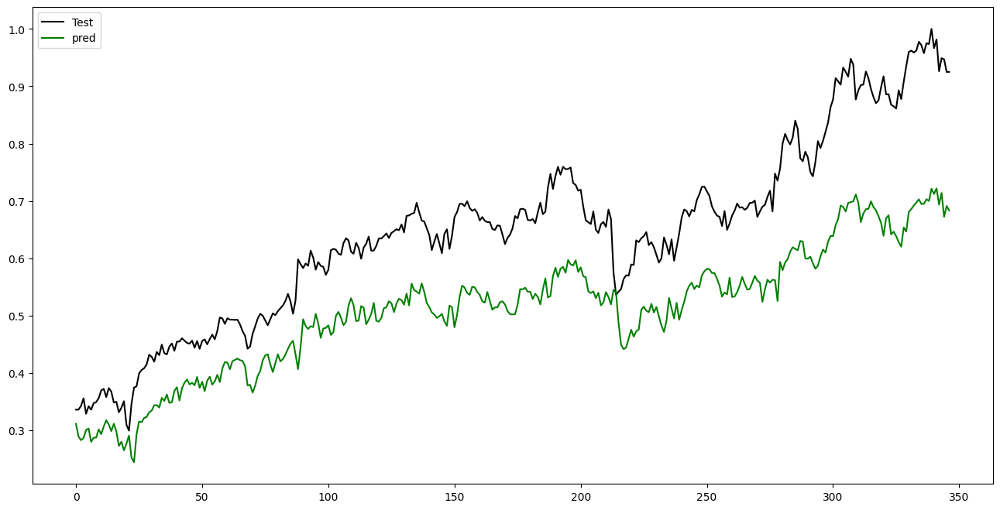

In [135]:
plt.figure(figsize=(16,8))
plt.plot(y_test, color = 'black', label = 'Test')
plt.plot(y_pred, color = 'green', label = 'pred')
plt.legend()
plt.show()

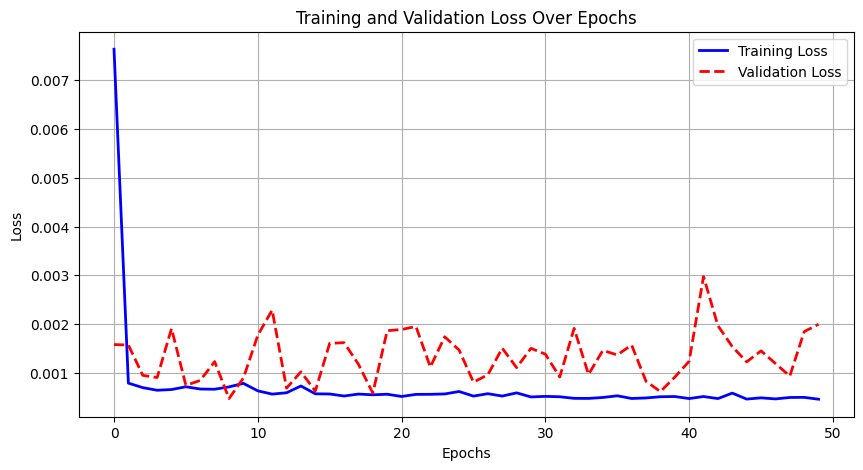

In [136]:
# Extract loss values
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss', color='blue', linewidth=2)
plt.plot(val_loss, label='Validation Loss', color='red', linestyle='dashed', linewidth=2)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [137]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")

Directional Accuracy: 50.29%


#### **Validation Loss is low, but the Directional Accuracy is poor (around 48.84%).**
- **This can happen due to several reasons:**

   The model is optimized for Mean Squared Error (MSE), which measures how close the predicted values are to actual values and doesn't consider **directional movement**.

    - Fix: Use a loss function that considers directional movement, like Huber loss or Directional Loss


   **Overfitting** on Training Data : Validation loss is smooth, but validation accuracy is low. 
    The model is fitting training data too well but failing on unseen trends in validation.

    - Fix: Use Dropout layers to prevent overfitting

   To capture longer **historical patterns**

    - Fix: Increase look-back window from 7 to 15 (or more) 

   Scaling the entire dataset before splitting → Causes **data leakage** (test data influences training)
 
    - Fix: We need to ensure Proper Scaling in LSTM
    - After splitting the dataset, scale separately for training and test sets to prevent data leakage.
    - Fit the scaler only on the training data and apply the same scaling to the test set.
    - Scale before creating sequences (look-back window) to ensure proper data normalization without future data influence.

-----

### Training the data again considering the  above conditions  

----

In [104]:
data.head(20)

,Open,High,Low,Close,Volume,Weekday,Month,Year,SMA_50,EMA_50,RSI,Stochastic_Oscillator,BB_Upper,BB_Lower,ATR,Std_Dev,MACD,Signal_Line,OBV,VWAP,GDP_Growth_Rate,UNRATE,Close_t-1,Close_t-2,Volume_t-1,SP500_Close,NASDAQ_Close,Inflation_rate,CPI,10_Yr_Yield,Close_t+1
0,79.849998,80.321999,79.544502,79.550003,85188000,2,3,2018,70.40240,71.401164,73.193860,83.670749,80.423398,71.340402,1.701038,2.329739,2.593251,2.443817,1860242000,75.630861,3.851956,3.9,79.408997,79.919502,130638000.0,2749.479980,7496.810059,2.04,249.577,0.74,79.115997
1,79.750000,79.845497,78.905502,79.115997,81394000,3,3,2018,70.79571,71.703707,70.281764,78.330123,80.689953,71.730198,1.646678,2.298129,2.533738,2.461802,1778848000,76.001000,3.851956,3.9,79.550003,79.408997,85188000.0,2747.330078,7481.740234,2.07,249.577,0.74,78.584000
2,79.172501,79.472000,78.375000,78.584000,108500000,4,3,2018,71.16319,71.973522,66.774713,71.783664,80.837446,72.132305,1.607415,2.232822,2.415799,2.452601,1670348000,76.327979,3.851956,3.9,79.115997,79.550003,81394000.0,2752.010010,7481.990234,2.05,249.577,0.77,77.246498
3,77.726501,78.083000,76.267502,77.246498,131616000,0,3,2018,71.49853,72.180306,58.826949,55.325135,80.668599,72.782351,1.658064,2.022780,2.189170,2.399915,1538732000,76.539415,3.851956,3.9,78.584000,79.115997,108500000.0,2712.919922,7344.240234,2.04,249.577,0.77,79.325500
4,77.516998,79.349998,77.270500,79.325500,91632000,1,3,2018,71.85590,72.460509,65.667404,80.908149,80.810687,73.231064,1.689881,1.944132,2.152511,2.350434,1630364000,76.833825,3.851956,3.9,77.246498,78.584000,131616000.0,2716.939941,7364.299805,2.05,249.577,0.81,79.093002
5,79.322502,79.500000,78.158501,79.093002,95016000,2,3,2018,72.19089,72.720607,64.379252,78.047159,80.918391,73.618060,1.664996,1.872495,2.080712,2.296490,1535348000,77.083052,3.851956,3.9,79.325500,77.246498,91632000.0,2711.929932,7345.290039,1.96,249.577,0.80,77.246002
6,78.273499,78.692497,77.120003,77.246002,126412000,3,3,2018,72.48311,72.898074,55.127617,46.814136,80.798535,74.035816,1.686997,1.734601,1.853409,2.207874,1408936000,77.248208,3.851956,3.9,79.093002,79.325500,95016000.0,2643.689941,7166.680176,2.03,249.577,0.75,74.778000
7,76.950500,77.450996,74.767998,74.778000,160120000,4,3,2018,72.72434,72.971796,45.681087,0.163728,80.820398,73.991753,1.758140,1.751511,1.457323,2.057763,1248816000,77.231729,3.851956,3.9,77.246002,79.093002,126412000.0,2588.260010,6992.669922,2.01,249.577,0.75,77.792999
8,76.500000,77.849503,74.962502,77.792999,112494000,0,3,2018,73.00352,73.160863,55.673922,49.517121,80.854824,74.126876,1.851951,1.725682,1.370904,1.920392,1361310000,77.276236,3.851956,3.9,74.778000,77.246002,160120000.0,2658.550049,7220.540039,2.01,249.577,0.77,74.852501
9,78.620003,78.798500,74.115997,74.852501,139992000,1,3,2018,73.19537,73.227202,46.658487,10.893410,80.915765,73.991285,2.054133,1.776092,1.053005,1.746914,1221318000,77.255845,3.851956,3.9,77.792999,74.778000,112494000.0,2612.620117,7008.810059,1.94,249.577,0.71,71.570999


In [105]:
print(data.shape)
print(type(data))

(1740, 31)
<class 'pandas.core.frame.DataFrame'>


In [106]:
from tensorflow.keras.losses import Huber


# Defining Features & Target
features = data.columns[:30]
target = 'Close_t+1'

# Splitting Data Chronologically (80% Train, 20% Test)
train_size = int(len(data) * 0.8)
train_data = data.iloc[:train_size]
test_data = data.iloc[train_size:]

# Applying Scaling Separately 
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Scaling features separately for train/test 
train_scaled = scaler_X.fit_transform(train_data[features])
test_scaled = scaler_X.transform(test_data[features])

# Scaling the target variable separately
y_train_scaled = scaler_y.fit_transform(train_data[[target]])
y_test_scaled = scaler_y.transform(test_data[[target]])

In [109]:


# Create Sequences
look_back = 15  # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Defining LSTM Model with Dropout
model = Sequential([
    LSTM(128, return_sequences=True, input_shape=(look_back, len(features))),  # First LSTM layer
    Dropout(0.2),  # Prevent overfitting
    LSTM(64, return_sequences=False),  # Second LSTM layer
    Dropout(0.2),  # Additional dropout for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dense(1)  # Output layer for regression
])

# Compile Model with Directional-Aware Loss Function
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber_loss')

# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs=100,
    callbacks=[early_stopping],
    shuffle=True
)

NameError: name 'tf' is not defined

11/11 [==============================] - 3s 16ms/step
Final RMSE: 20.963204729220152


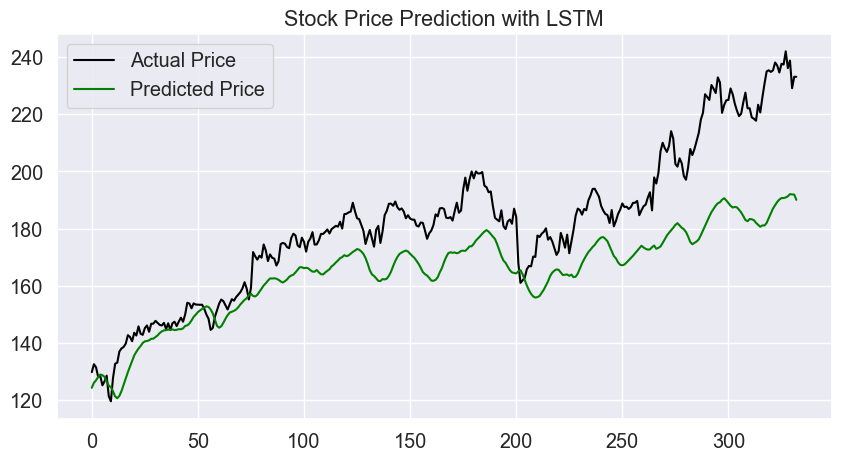

In [2356]:
# Make Predictions & Reverse Scaling
y_pred_scaled = model.predict(X_test)

# Inverse transform to original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_unscaled = scaler_y.inverse_transform(y_test)

# Evaluate Model Performance
mse = mean_squared_error(y_test_unscaled, y_pred)
rmse = np.sqrt(mse)
print(f"Final RMSE: {rmse}")

# Plot Actual vs. Predicted Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.show()


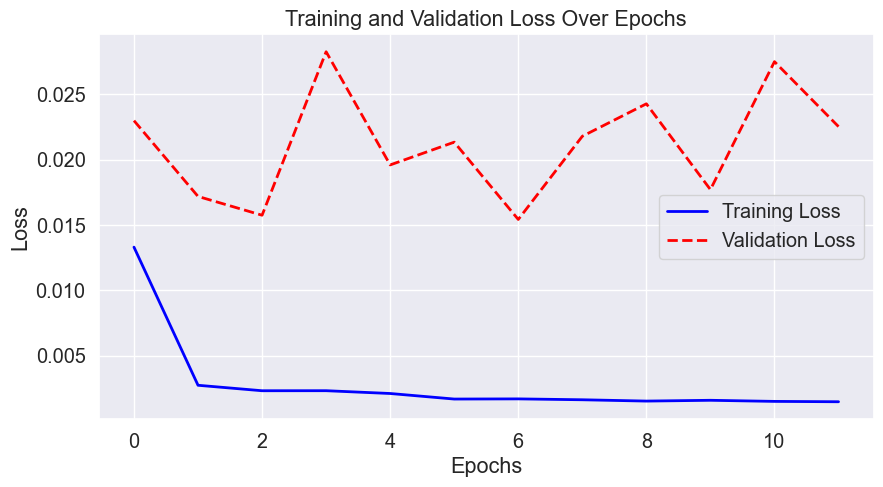

In [2357]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2358]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 50.60%


---

enhancements:
    
    - Increase Look-Back Window Further (15 → 30)
    - Use Bidirectional LSTM for Better Pattern Recognition
    - Reduce Learning Rate Dynamically Using ReduceLROnPlateau
    - Use Huber Loss + MAE Together for More Stability
    - Normalize Entire Feature Set (Not Just Close Price)

In [2359]:
from tensorflow.keras.losses import Huber


# Defining Features & Target
features = data.columns[:30]
target = 'Close_t+1'

# Splitting Data Chronologically (80% Train, 20% Test)
train_size = int(len(data) * 0.8)
train_data = data.iloc[:train_size]
test_data = data.iloc[train_size:]

# Applying Scaling Separately 
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Scaling features separately for train/test 
train_scaled = scaler_X.fit_transform(train_data[features])
test_scaled = scaler_X.transform(test_data[features])

# Scaling the target variable separately
y_train_scaled = scaler_y.fit_transform(train_data[[target]])
y_test_scaled = scaler_y.transform(test_data[[target]])

In [2360]:


# Create Sequences
look_back = 30  # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Defining LSTM Model with Dropout
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=True), input_shape=(look_back, len(features))),  # BiLSTM
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compile Model with Directional-Aware Loss Function
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber_loss', metrics=['mae'])

# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-5, verbose=1)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs= 50,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/50
43/43 [==============================] - 24s 166ms/step - loss: 0.0112 - mae: 0.0986 - val_loss: 0.0203 - val_mae: 0.1736
Epoch 2/50
43/43 [==============================] - 3s 74ms/step - loss: 0.0027 - mae: 0.0560 - val_loss: 0.0232 - val_mae: 0.1877
Epoch 3/50
43/43 [==============================] - 3s 74ms/step - loss: 0.0023 - mae: 0.0499 - val_loss: 0.0262 - val_mae: 0.2005
Epoch 4/50
43/43 [==============================] - 3s 74ms/step - loss: 0.0018 - mae: 0.0458 - val_loss: 0.0206 - val_mae: 0.1705
Epoch 5/50
43/43 [==============================] - 3s 78ms/step - loss: 0.0017 - mae: 0.0434 - val_loss: 0.0160 - val_mae: 0.1442
Epoch 6/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0016 - mae: 0.0426 - val_loss: 0.0219 - val_mae: 0.1801
Epoch 7/50
43/43 [==============================] - 3s 74ms/step - loss: 0.0016 - mae: 0.0429 - val_loss: 0.0196 - val_mae: 0.1653
Epoch 8/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0015 -

10/10 [==============================] - 4s 29ms/step
Final RMSE: 21.32072166122816


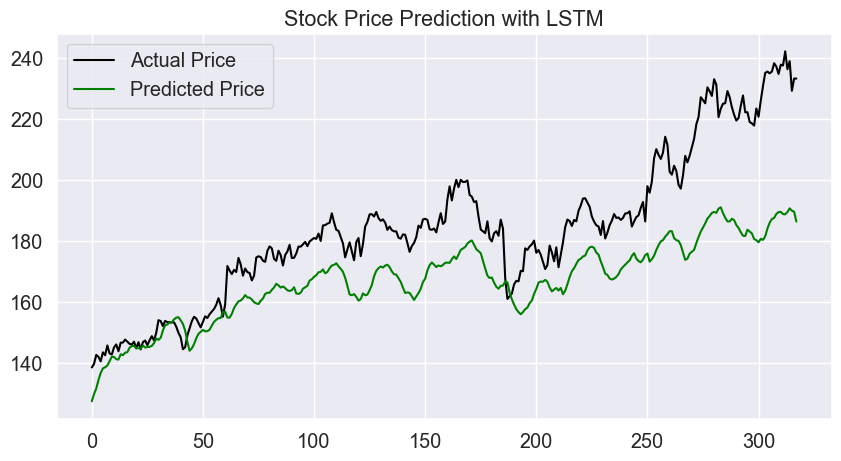

In [2361]:
# Make Predictions & Reverse Scaling
y_pred_scaled = model.predict(X_test)

# Inverse transform to original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_unscaled = scaler_y.inverse_transform(y_test)

# Evaluate Model Performance
mse = mean_squared_error(y_test_unscaled, y_pred)
rmse = np.sqrt(mse)
print(f"Final RMSE: {rmse}")

# Plot Actual vs. Predicted Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.show()


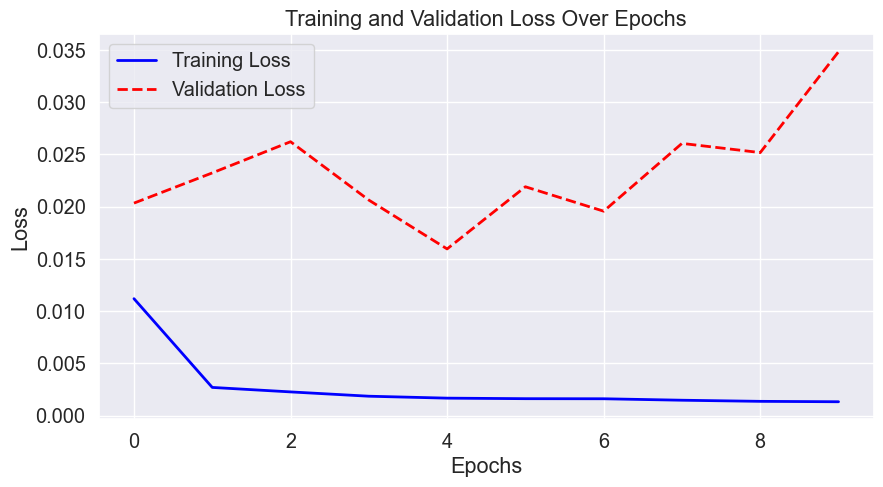

In [2362]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2363]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 48.26%


### removing all the volume columns to check the performance

In [2364]:
data.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Weekday', 'Month', 'Year',
       'SMA_50', 'EMA_50', 'RSI', 'Stochastic_Oscillator', 'BB_Upper',
       'BB_Lower', 'ATR', 'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'VWAP',
       'GDP_Growth_Rate', 'UNRATE', 'Close_t-1', 'Close_t-2', 'Volume_t-1',
       'SP500_Close', 'NASDAQ_Close', 'Inflation_rate', 'CPI', '10_Yr_Yield',
       'Close_t+1'],
      dtype='object')

In [2366]:
features = ['Open', 'High', 'Low', 'Close', 'Weekday', 'Month', 'Year',
            'SMA_50', 'EMA_50', 'RSI', 'Stochastic_Oscillator', 'BB_Upper',
            'BB_Lower', 'ATR', 'Std_Dev', 'MACD', 'Signal_Line', 'OBV', 'VWAP',
            'GDP_Growth_Rate', 'UNRATE', 'Close_t-1', 'Close_t-2',
            'SP500_Close', 'NASDAQ_Close', 'Inflation_rate', 'CPI', '10_Yr_Yield', 'Close_t+1']


# Select features without 'Volume' and 'Volume_t-1'
data_filtered = data[features]

print(data_filtered.shape)
print(type(data_filtered))


(1738, 29)
<class 'pandas.core.frame.DataFrame'>


In [2372]:
from tensorflow.keras.losses import Huber


# Defining Features & Target
features = data_filtered.columns[:28]
target = 'Close_t+1'

# Splitting Data Chronologically (80% Train, 20% Test)
train_size = int(len(data_filtered) * 0.8)
train_data = data_filtered.iloc[:train_size]
test_data = data_filtered.iloc[train_size:]

# Applying Scaling Separately 
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Scaling features separately for train/test 
train_scaled = scaler_X.fit_transform(train_data[features])
test_scaled = scaler_X.transform(test_data[features])

# Scaling the target variable separately
y_train_scaled = scaler_y.fit_transform(train_data[[target]])
y_test_scaled = scaler_y.transform(test_data[[target]])

In [2373]:


# Create Sequences
look_back = 30  # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Defining LSTM Model with Dropout
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=True), input_shape=(look_back, len(features))),  # BiLSTM
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compile Model with Directional-Aware Loss Function
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber_loss', metrics=['mae'])

# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-5, verbose=1)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs= 50,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/50
43/43 [==============================] - 25s 182ms/step - loss: 0.0124 - mae: 0.1004 - val_loss: 0.0226 - val_mae: 0.1787
Epoch 2/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0027 - mae: 0.0555 - val_loss: 0.0275 - val_mae: 0.2092
Epoch 3/50
43/43 [==============================] - 3s 70ms/step - loss: 0.0025 - mae: 0.0529 - val_loss: 0.0297 - val_mae: 0.2189
Epoch 4/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0017 - mae: 0.0441 - val_loss: 0.0211 - val_mae: 0.1742
Epoch 5/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0018 - mae: 0.0446 - val_loss: 0.0237 - val_mae: 0.1903
Epoch 6/50
43/43 [==============================] - 3s 76ms/step - loss: 0.0016 - mae: 0.0425 - val_loss: 0.0171 - val_mae: 0.1564
Epoch 7/50
43/43 [==============================] - 3s 74ms/step - loss: 0.0016 - mae: 0.0420 - val_loss: 0.0220 - val_mae: 0.1837
Epoch 8/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0014 -

10/10 [==============================] - 5s 28ms/step
Final RMSE: 22.101562336199727


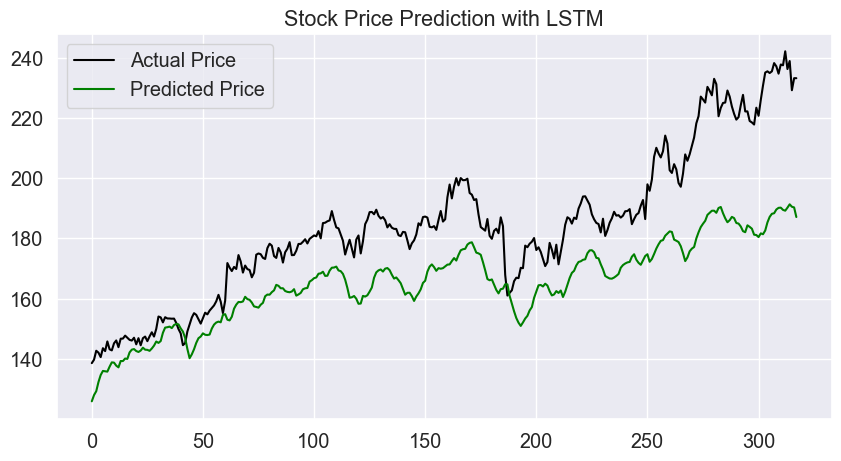

In [2374]:
# Make Predictions & Reverse Scaling
y_pred_scaled = model.predict(X_test)

# Inverse transform to original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_unscaled = scaler_y.inverse_transform(y_test)

# Evaluate Model Performance
mse = mean_squared_error(y_test_unscaled, y_pred)
rmse = np.sqrt(mse)
print(f"Final RMSE: {rmse}")

# Plot Actual vs. Predicted Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.show()


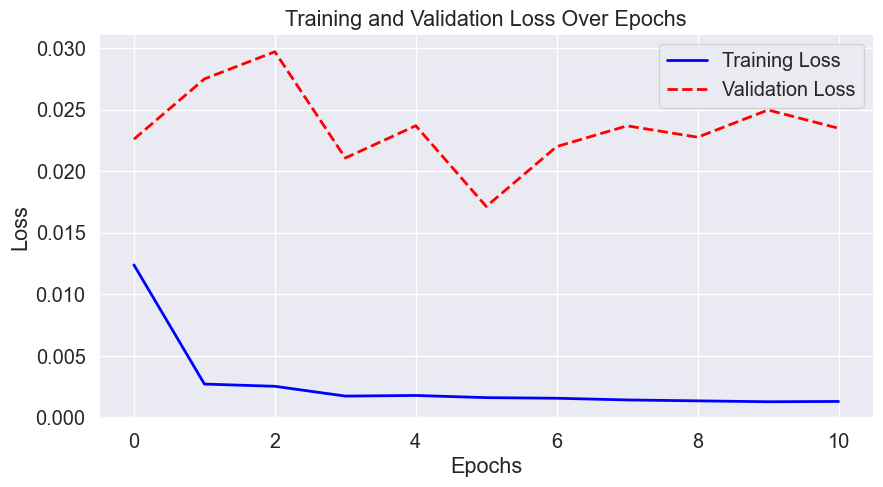

In [2375]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2376]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 49.84%


### Removing the columns which create noise 

In [2379]:
features = [
    'Open', 'High', 'Low', 'Close',   # Core price features
    'RSI', 'Stochastic_Oscillator',   # Momentum indicators
    'ATR', 'Std_Dev',                 # Volatility indicators
    'MACD', 'Signal_Line',            # Trend indicators
    'Close_t-1', 'Close_t-2'          # Short-term lagged close prices
    , 'Close_t+1'                     # target variable
]


In [2380]:

# Select features without 'Volume' and 'Volume_t-1'
data_filtered = data[features]

print(data_filtered.shape)
print(type(data_filtered))


(1738, 13)
<class 'pandas.core.frame.DataFrame'>


In [2381]:
from tensorflow.keras.losses import Huber


# Defining Features & Target
features = data_filtered.columns[:12]
target = 'Close_t+1'

# Splitting Data Chronologically (80% Train, 20% Test)
train_size = int(len(data_filtered) * 0.8)
train_data = data_filtered.iloc[:train_size]
test_data = data_filtered.iloc[train_size:]

# Applying Scaling Separately 
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Scaling features separately for train/test 
train_scaled = scaler_X.fit_transform(train_data[features])
test_scaled = scaler_X.transform(test_data[features])

# Scaling the target variable separately
y_train_scaled = scaler_y.fit_transform(train_data[[target]])
y_test_scaled = scaler_y.transform(test_data[[target]])

In [2382]:


# Create Sequences
look_back = 30  # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Defining LSTM Model with Dropout
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=True), input_shape=(look_back, len(features))),  # BiLSTM
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compile Model with Directional-Aware Loss Function
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber_loss', metrics=['mae'])

# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-5, verbose=1)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs= 50,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/50
43/43 [==============================] - 28s 175ms/step - loss: 0.0073 - mae: 0.0813 - val_loss: 0.0089 - val_mae: 0.1045
Epoch 2/50
43/43 [==============================] - 3s 72ms/step - loss: 0.0023 - mae: 0.0510 - val_loss: 0.0108 - val_mae: 0.1197
Epoch 3/50
43/43 [==============================] - 3s 78ms/step - loss: 0.0020 - mae: 0.0469 - val_loss: 0.0090 - val_mae: 0.1118
Epoch 4/50
43/43 [==============================] - 4s 88ms/step - loss: 0.0018 - mae: 0.0444 - val_loss: 0.0069 - val_mae: 0.0921
Epoch 5/50
43/43 [==============================] - 3s 76ms/step - loss: 0.0015 - mae: 0.0406 - val_loss: 0.0063 - val_mae: 0.0879
Epoch 6/50
43/43 [==============================] - 3s 81ms/step - loss: 0.0016 - mae: 0.0412 - val_loss: 0.0055 - val_mae: 0.0814
Epoch 7/50
43/43 [==============================] - 3s 73ms/step - loss: 0.0015 - mae: 0.0410 - val_loss: 0.0040 - val_mae: 0.0650
Epoch 8/50
43/43 [==============================] - 3s 72ms/step - loss: 0.0014 -

10/10 [==============================] - 4s 29ms/step
Final RMSE: 10.66842615404719


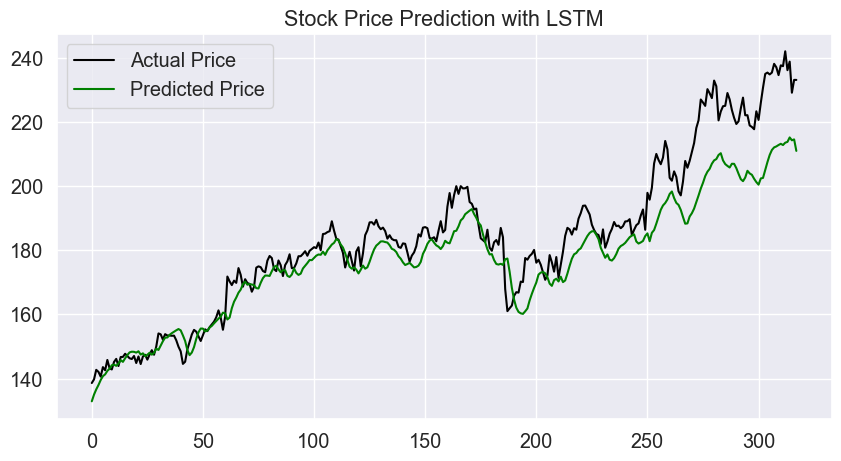

In [2383]:
# Make Predictions & Reverse Scaling
y_pred_scaled = model.predict(X_test)

# Inverse transform to original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_unscaled = scaler_y.inverse_transform(y_test)

# Evaluate Model Performance
mse = mean_squared_error(y_test_unscaled, y_pred)
rmse = np.sqrt(mse)
print(f"Final RMSE: {rmse}")

# Plot Actual vs. Predicted Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.show()


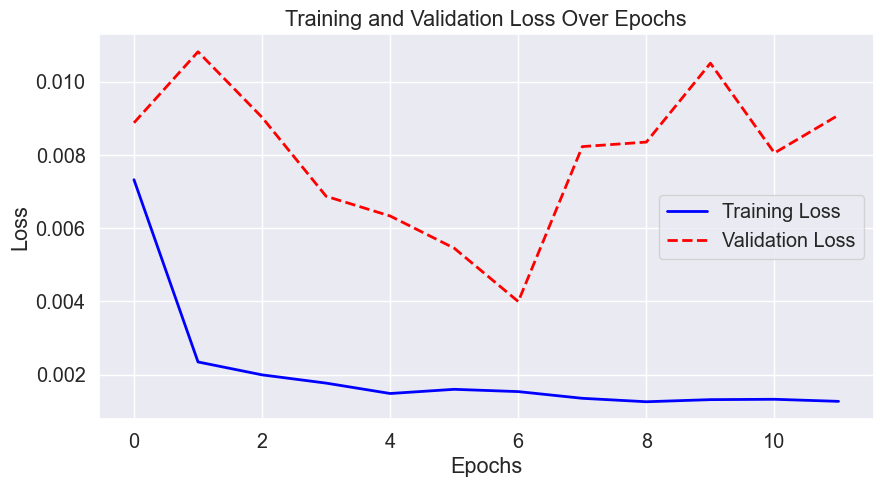

In [2384]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2385]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 47.95%


---

Since the predictions are still lagging behind, try:

    Increasing Look-Back Further → Try look_back=30
    Tuning LSTM Layers → Increase to LSTM(256, return_sequences=True)
    More Dropout Regularization → Use Dropout(0.3)

    Issues and Fixes Based on Results
    From the Training and Validation Loss Graph:

    Early stopping triggered too early (Epoch 10) → model is not learning enough.

    Fix: Increase patience in early stopping (e.g., patience=15).
    Fix: Try ReduceLROnPlateau to adjust learning rate dynamically.


    Validation loss spikes at some points → Could be due to noisy or improper scaling.
    Fix: Increase Dropout to prevent overfitting.

    Poor Directional Accuracy: model predicts future movements poorly.

        Fix:
    Increase look_back=30 → Captures more past trends.
    Use Bidirectional LSTM (BiLSTM) → Helps the model learn from both past and future trends.
    Switch to Tanh activation in LSTM → Helps with long-term dependencies.


In [ ]:
### training the same data on 100 epochs and 

In [2292]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import  Bidirectional

from tensorflow.keras.regularizers import l2


# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

In [2386]:

# Create sequences (Look-back Window = 30)
look_back = 30
def create_sequences(X, y, look_back):
    X_seq, y_seq = [], []
    for i in range(look_back, len(X)):
        X_seq.append(X[i - look_back:i])
        y_seq.append(y[i])
    return np.array(X_seq), np.array(y_seq)

X_train, y_train = create_sequences(X_train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(X_test_scaled, y_test_scaled, look_back)

# Define Optimized LSTM Model
model = Sequential([
    Bidirectional(LSTM(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01)), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.3),
    
    Bidirectional(LSTM(128, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01))),
    Dropout(0.3),
    
    LSTM(64, return_sequences=False, activation='tanh'),
    Dropout(0.3),
    
    Dense(32, activation='relu'),
    Dense(1, activation='linear')
])

# Compile with Huber Loss and Lower Learning Rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='huber')

# Early Stopping & Reduce Learning Rate
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    shuffle=False
)



Epoch 1/100
43/43 [==============================] - 48s 416ms/step - loss: 7.7217 - val_loss: 4.8070 - lr: 5.0000e-04
Epoch 2/100
43/43 [==============================] - 9s 197ms/step - loss: 3.0016 - val_loss: 1.9426 - lr: 5.0000e-04
Epoch 3/100
43/43 [==============================] - 8s 186ms/step - loss: 1.0838 - val_loss: 0.7518 - lr: 5.0000e-04
Epoch 4/100
43/43 [==============================] - 8s 187ms/step - loss: 0.3770 - val_loss: 0.2788 - lr: 5.0000e-04
Epoch 5/100
43/43 [==============================] - 8s 190ms/step - loss: 0.1434 - val_loss: 0.1754 - lr: 5.0000e-04
Epoch 6/100
43/43 [==============================] - 8s 188ms/step - loss: 0.0855 - val_loss: 0.1565 - lr: 5.0000e-04
Epoch 7/100
43/43 [==============================] - 8s 191ms/step - loss: 0.0625 - val_loss: 0.1182 - lr: 5.0000e-04
Epoch 8/100
43/43 [==============================] - 9s 200ms/step - loss: 0.0619 - val_loss: 0.1739 - lr: 5.0000e-04
Epoch 9/100
43/43 [==============================] - 8s

In [2388]:
# Predictions
y_pred = model.predict(X_test)

# Inverse Transform Predictions
y_pred_inv = scaler_y.inverse_transform(y_pred)
y_test_inv = scaler_y.inverse_transform(y_test)



10/10 [==============================] - 1s 77ms/step


In [2389]:
print("X_test_scaled shape:", X_test_scaled.shape)  # Expected shape: (num_samples, look_back, num_features)


X_test_scaled shape: (348, 30)


10/10 [==============================] - 1s 77ms/step
Final Huber Loss: 16.92556
Final RMSE: 23.04314


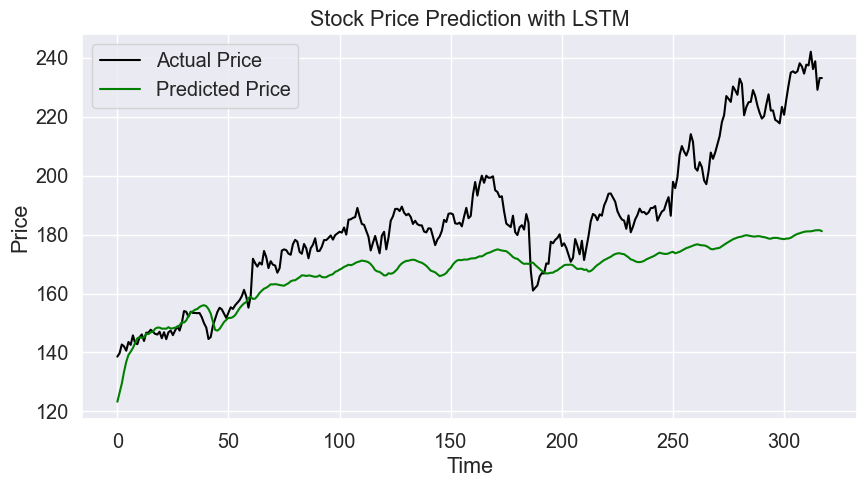

In [2390]:

# Ensure test data is correctly scaled before making predictions
y_pred_scaled = model.predict(X_test)

# Inverse transform predictions and actual values
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))  # Reshape for compatibility
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Compute Huber Loss
def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = np.abs(error) <= delta
    squared_loss = 0.5 * error ** 2
    linear_loss = delta * (np.abs(error) - 0.5 * delta)
    return np.where(is_small_error, squared_loss, linear_loss).mean()

# Calculate Huber Loss and RMSE
huber = huber_loss(y_test_unscaled, y_pred)
rmse = np.sqrt(mean_squared_error(y_test_unscaled, y_pred))

# Print evaluation metrics
print(f"Final Huber Loss: {huber:.5f}")
print(f"Final RMSE: {rmse:.5f}")

# Plot Actual vs. Predicted Prices
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


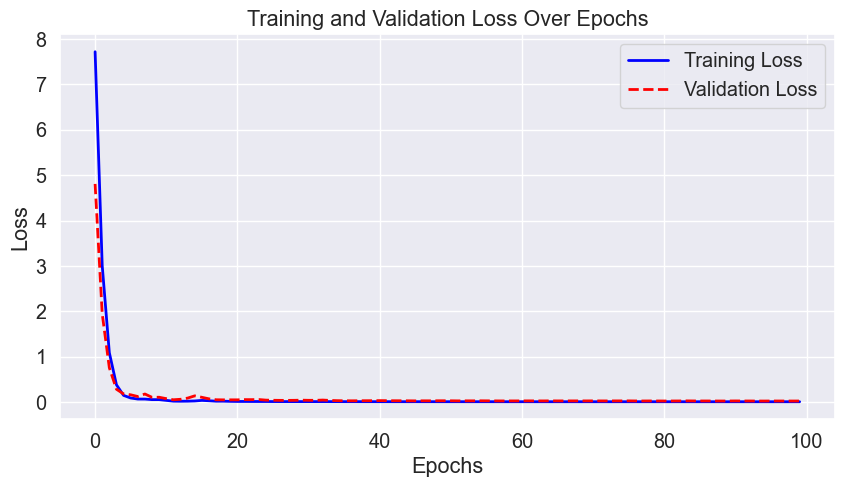

In [2392]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2393]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 48.58%


##  Hyper parameter tuning 

In [2399]:
import keras_tuner as kt
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.regularizers import l2

# Define hypermodel function
def build_model(hp):
    model = Sequential()
    
    # First BiLSTM Layer
    model.add(Bidirectional(LSTM(
        units=hp.Choice('lstm1_units', values=[128, 256, 512]), 
        return_sequences=True, 
        activation='tanh', 
        kernel_regularizer=l2(hp.Choice('l2_reg', values=[0.001, 0.01, 0.1]))
    ), input_shape=(look_back, X_train.shape[2])))

    model.add(Dropout(hp.Choice('dropout1', values=[0.2, 0.3, 0.4])))

    # Second BiLSTM Layer
    model.add(Bidirectional(LSTM(
        units=hp.Choice('lstm2_units', values=[64, 128, 256]),
        return_sequences=True,
        activation='tanh',
        kernel_regularizer=l2(hp.Choice('l2_reg', values=[0.001, 0.01, 0.1]))
    )))

    model.add(Dropout(hp.Choice('dropout2', values=[0.2, 0.3, 0.4])))

    # Third LSTM Layer
    model.add(LSTM(
        units=hp.Choice('lstm3_units', values=[32, 64, 128]), 
        return_sequences=False, 
        activation='tanh'
    ))

    model.add(Dropout(hp.Choice('dropout3', values=[0.2, 0.3, 0.4])))

    # Fully Connected Layers
    model.add(Dense(hp.Choice('dense_units', values=[16, 32, 64]), activation='relu'))
    model.add(Dense(1, activation='linear'))  # Output layer

    # Compile with Huber Loss & Tuned Learning Rate
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[0.001, 0.0005, 0.0001])),
        loss='huber'
    )

    return model

# Hyperband Search for Optimal Hyperparameters
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=50,
    factor=3,
    directory='lstm_tuning',
    project_name='stock_prediction'
)

# Early stopping and ReduceLROnPlateau
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

# Perform hyperparameter tuning
tuner.search(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,  
    callbacks=[early_stopping, reduce_lr],
    epochs=50
)

# Retrieve Best Hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print Best Hyperparameters
print("\n🔹 Best Hyperparameters Found:")
for param in best_hps.values.keys():
    print(f"{param}: {best_hps.get(param)}")

# Build Final Model with Best Hyperparameters
best_model = tuner.hypermodel.build(best_hps)

# Train Final Model
history = best_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs=100,
    callbacks=[early_stopping, reduce_lr]
)



Reloading Tuner from lstm_tuning\stock_prediction\tuner0.json

🔹 Best Hyperparameters Found:
units: 64
dropout: 0.1
learning_rate: 0.001
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 3
tuner/round: 0
Epoch 1/100
43/43 [==============================] - 89s 275ms/step - loss: 0.4715 - val_loss: 0.3299 - lr: 0.0010
Epoch 2/100
43/43 [==============================] - 4s 97ms/step - loss: 0.2109 - val_loss: 0.1772 - lr: 0.0010
Epoch 3/100
43/43 [==============================] - 4s 90ms/step - loss: 0.1097 - val_loss: 0.1101 - lr: 0.0010
Epoch 4/100
43/43 [==============================] - 4s 89ms/step - loss: 0.0681 - val_loss: 0.0693 - lr: 0.0010
Epoch 5/100
43/43 [==============================] - 4s 89ms/step - loss: 0.0479 - val_loss: 0.0544 - lr: 0.0010
Epoch 6/100
43/43 [==============================] - 4s 89ms/step - loss: 0.0355 - val_loss: 0.0573 - lr: 0.0010
Epoch 7/100
43/43 [==============================] - 4s 91ms/step - loss: 0.0276 - val_loss: 0.0348 - lr: 0.0010

In [2400]:
y_pred = best_model.predict(X_test)
for i in range(10):
    print(y_pred[i], y_test[i])

10/10 [==============================] - 8s 37ms/step
[0.5315662] [0.59814454]
[0.55201805] [0.60769448]
[0.5664741] [0.63257459]
[0.59308416] [0.62729695]
[0.61426336] [0.61489882]
[0.6273723] [0.63969508]
[0.6305459] [0.63156925]
[0.63330877] [0.65845992]
[0.6460713] [0.63667931]
[0.65696335] [0.63357981]


10/10 [==============================] - 2s 113ms/step
Final Huber Loss: 16.92556
Final RMSE: 23.04314


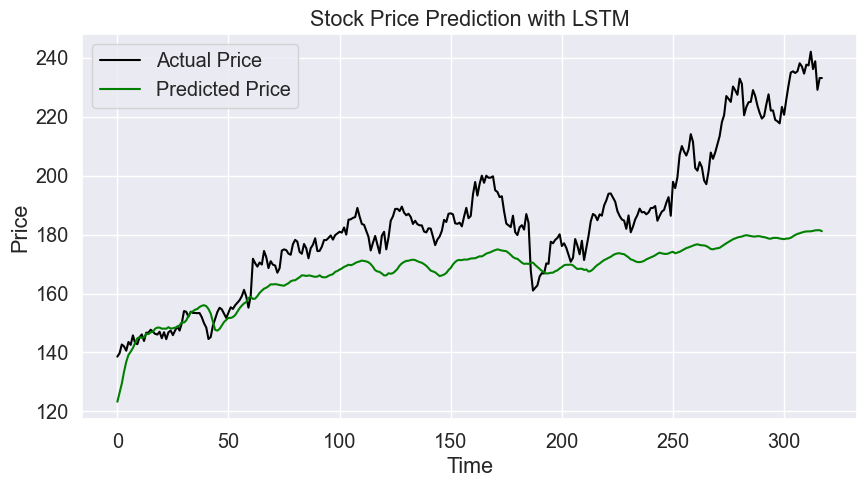

In [2404]:

# Ensure test data is correctly scaled before making predictions
y_pred_scaled = model.predict(X_test)

# Inverse transform predictions and actual values
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))  # Reshape for compatibility
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Compute Huber Loss
def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = np.abs(error) <= delta
    squared_loss = 0.5 * error ** 2
    linear_loss = delta * (np.abs(error) - 0.5 * delta)
    return np.where(is_small_error, squared_loss, linear_loss).mean()

# Calculate Huber Loss and RMSE
huber = huber_loss(y_test_unscaled, y_pred)
rmse = np.sqrt(mean_squared_error(y_test_unscaled, y_pred))

# Print evaluation metrics
print(f"Final Huber Loss: {huber:.5f}")
print(f"Final RMSE: {rmse:.5f}")

# Plot Actual vs. Predicted Prices
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


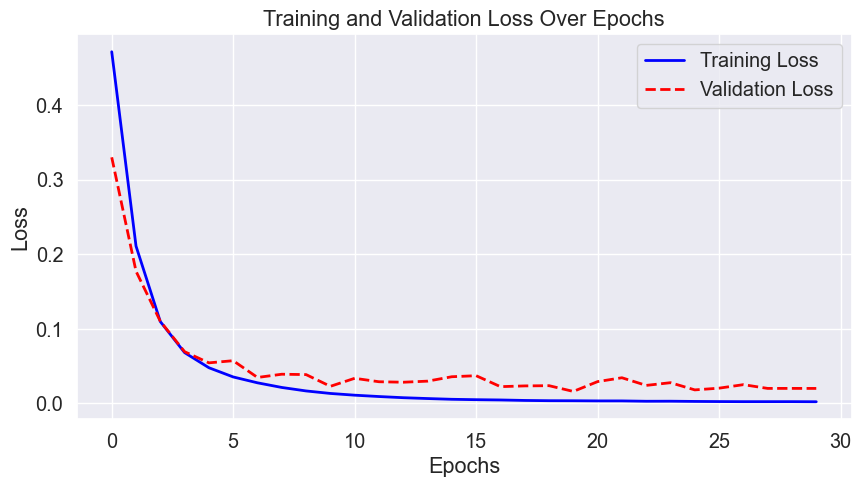

In [2402]:
# Extract loss values
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss', color='blue', linewidth=2)
plt.plot(val_loss, label='Validation Loss', color='red', linestyle='dashed', linewidth=2)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


The model is overfitting 

In [2403]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 50.47%


### using look-back window for sequential test predictions on the above model 

1/1 [==============================] - 0s 60ms/step
Final Huber Loss: 16.92556
Final RMSE: 23.04314


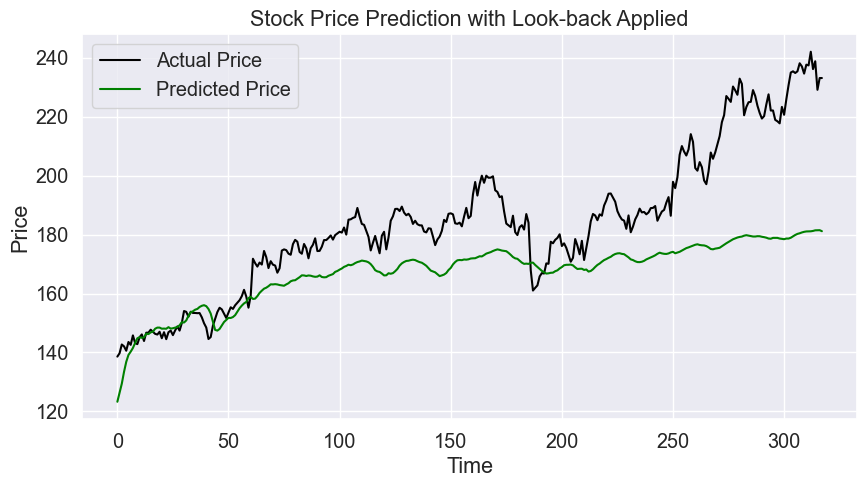

In [2405]:

# Initialize list to store predictions
y_pred_list = []

# Ensure test data is correctly formatted
X_test_rolling = X_test.copy()

# Loop through test set for sequential predictions
for i in range(len(X_test_rolling)):
    # Extract last `look_back` days as input for prediction
    current_input = X_test_rolling[i].reshape(1, look_back, X_test.shape[2])
    
    # Predict next day's closing price
    next_pred = model.predict(current_input)
    
    # Store the predicted value
    y_pred_list.append(next_pred[0, 0])

# Convert predictions and actual values back to original scale
y_pred = scaler_y.inverse_transform(np.array(y_pred_list).reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Compute Huber Loss
def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = np.abs(error) <= delta
    squared_loss = 0.5 * error ** 2
    linear_loss = delta * (np.abs(error) - 0.5 * delta)
    return np.where(is_small_error, squared_loss, linear_loss).mean()

# Calculate Huber Loss and RMSE
huber = huber_loss(y_test_unscaled, y_pred)
rmse = np.sqrt(mean_squared_error(y_test_unscaled, y_pred))

# Print evaluation metrics
print(f"Final Huber Loss: {huber:.5f}")
print(f"Final RMSE: {rmse:.5f}")

# Plot Actual vs. Predicted Prices
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with Look-back Applied')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


In [2406]:
print("First few scaled predictions:", y_pred_scaled[:5])
print("First few unscaled predictions:", scaler_y.inverse_transform(y_pred_scaled[:5]))


First few scaled predictions: [[0.46980357]
 [0.49609286]
 [0.5211145 ]
 [0.5547567 ]
 [0.58328956]]
First few unscaled predictions: [[123.279625]
 [126.41784 ]
 [129.40474 ]
 [133.42068 ]
 [136.82672 ]]


##  Training data on GRU (Gated Recurrent Unit)

In [2408]:
from tensorflow.keras.layers import GRU

# Define Optimized GRU Model
model = Sequential([
    Bidirectional(GRU(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01)), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.3),
    
    Bidirectional(GRU(128, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01))),
    Dropout(0.3),
    
    GRU(64, return_sequences=False, activation='tanh'),
    Dropout(0.3),
    
    Dense(32, activation='relu'),
    Dense(1, activation='linear')
])

# Compile Model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='huber')


In [2409]:
# Train the GRU Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    shuffle=False
)



Epoch 1/50
43/43 [==============================] - 53s 315ms/step - loss: 6.9208 - val_loss: 4.4429 - lr: 5.0000e-04
Epoch 2/50
43/43 [==============================] - 7s 164ms/step - loss: 2.9374 - val_loss: 1.8955 - lr: 5.0000e-04
Epoch 3/50
43/43 [==============================] - 7s 163ms/step - loss: 1.1636 - val_loss: 0.7719 - lr: 5.0000e-04
Epoch 4/50
43/43 [==============================] - 7s 164ms/step - loss: 0.4358 - val_loss: 0.3479 - lr: 5.0000e-04
Epoch 5/50
43/43 [==============================] - 8s 178ms/step - loss: 0.1642 - val_loss: 0.2197 - lr: 5.0000e-04
Epoch 6/50
43/43 [==============================] - 7s 164ms/step - loss: 0.0685 - val_loss: 0.1833 - lr: 5.0000e-04
Epoch 7/50
43/43 [==============================] - 7s 164ms/step - loss: 0.0388 - val_loss: 0.1947 - lr: 5.0000e-04
Epoch 8/50
43/43 [==============================] - 7s 164ms/step - loss: 0.0301 - val_loss: 0.1917 - lr: 5.0000e-04
Epoch 9/50
43/43 [==============================] - 7s 167ms/st

10/10 [==============================] - 8s 67ms/step


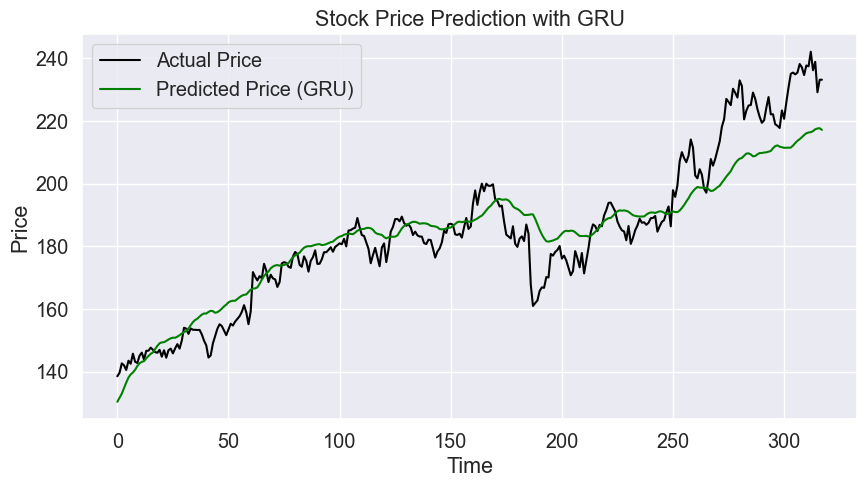

In [2410]:
# Predictions
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Plot Predictions
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price (GRU)', color='green')
plt.legend()
plt.title('Stock Price Prediction with GRU')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


In [2412]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")

Directional Accuracy: 47.32%


In [140]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

In [2414]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

# Define GRU Model
model = Sequential([
    GRU(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.2),

    GRU(128, return_sequences=False, activation='tanh'),
    Dropout(0.2),

    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])

# Compile Model
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber')

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)




Epoch 1/50
43/43 [==============================] - 23s 208ms/step - loss: 0.3536 - val_loss: 0.1762 - lr: 0.0010
Epoch 2/50
43/43 [==============================] - 6s 128ms/step - loss: 0.1000 - val_loss: 0.0615 - lr: 0.0010
Epoch 3/50
43/43 [==============================] - 6s 129ms/step - loss: 0.0334 - val_loss: 0.0205 - lr: 0.0010
Epoch 4/50
43/43 [==============================] - 6s 131ms/step - loss: 0.0137 - val_loss: 0.0109 - lr: 0.0010
Epoch 5/50
43/43 [==============================] - 5s 127ms/step - loss: 0.0068 - val_loss: 0.0045 - lr: 0.0010
Epoch 6/50
43/43 [==============================] - 6s 130ms/step - loss: 0.0039 - val_loss: 0.0033 - lr: 0.0010
Epoch 7/50
43/43 [==============================] - 5s 128ms/step - loss: 0.0033 - val_loss: 0.0022 - lr: 0.0010
Epoch 8/50
43/43 [==============================] - 5s 128ms/step - loss: 0.0022 - val_loss: 0.0044 - lr: 0.0010
Epoch 9/50
43/43 [==============================] - 6s 129ms/step - loss: 0.0022 - val_loss: 0.

10/10 [==============================] - 1s 62ms/step


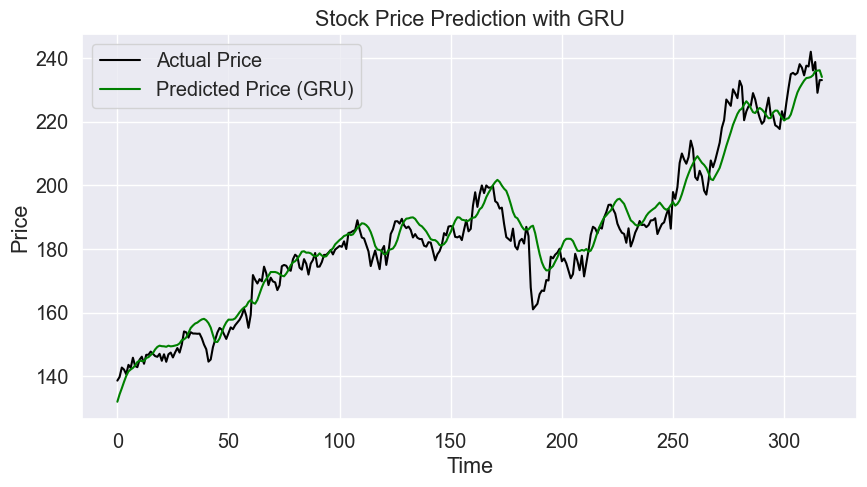

In [2416]:
# Predictions
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Plot Predictions
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price (GRU)', color='green')
plt.legend()
plt.title('Stock Price Prediction with GRU')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


In [2417]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")

Directional Accuracy: 49.84%


## Removing MACD and Signal_Line and training the model

In [2424]:
features = [
    'Open', 'High', 'Low', 'Close',   # Core price features
    'RSI', 'Stochastic_Oscillator',   # Momentum indicators
    'ATR', 'Std_Dev',                 # Volatility indicators
    'Close_t-1', 'Close_t-2'          # Short-term lagged close prices
    , 'Close_t+1'                     # target variable
]


In [2425]:

# Select features without 'Volume' and 'Volume_t-1'
data_filtered = data[features]

print(data_filtered.shape)
print(type(data_filtered))


(1738, 11)
<class 'pandas.core.frame.DataFrame'>


In [2426]:
from tensorflow.keras.losses import Huber


# Defining Features & Target
features = data_filtered.columns[:12]
target = 'Close_t+1'

# Splitting Data Chronologically (80% Train, 20% Test)
train_size = int(len(data_filtered) * 0.8)
train_data = data_filtered.iloc[:train_size]
test_data = data_filtered.iloc[train_size:]

# Applying Scaling Separately 
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Scaling features separately for train/test 
train_scaled = scaler_X.fit_transform(train_data[features])
test_scaled = scaler_X.transform(test_data[features])

# Scaling the target variable separately
y_train_scaled = scaler_y.fit_transform(train_data[[target]])
y_test_scaled = scaler_y.transform(test_data[[target]])

In [2427]:


# Create Sequences
look_back = 60  # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Defining LSTM Model with Dropout
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=True), input_shape=(look_back, len(features))),  # BiLSTM
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compile Model with Directional-Aware Loss Function
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber_loss', metrics=['mae'])

# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-5, verbose=1)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs= 50,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/50
42/42 [==============================] - 33s 234ms/step - loss: 0.0088 - mae: 0.0910 - val_loss: 0.0132 - val_mae: 0.1341
Epoch 2/50
42/42 [==============================] - 5s 130ms/step - loss: 0.0025 - mae: 0.0524 - val_loss: 0.0141 - val_mae: 0.1408
Epoch 3/50
42/42 [==============================] - 5s 129ms/step - loss: 0.0018 - mae: 0.0459 - val_loss: 0.0106 - val_mae: 0.1176
Epoch 4/50
42/42 [==============================] - 6s 132ms/step - loss: 0.0019 - mae: 0.0452 - val_loss: 0.0129 - val_mae: 0.1340
Epoch 5/50
42/42 [==============================] - 5s 131ms/step - loss: 0.0017 - mae: 0.0434 - val_loss: 0.0052 - val_mae: 0.0717
Epoch 6/50
42/42 [==============================] - 5s 130ms/step - loss: 0.0014 - mae: 0.0403 - val_loss: 0.0075 - val_mae: 0.0948
Epoch 7/50
42/42 [==============================] - 5s 130ms/step - loss: 0.0016 - mae: 0.0418 - val_loss: 0.0082 - val_mae: 0.1040
Epoch 8/50
42/42 [==============================] - 5s 129ms/step - loss: 0

9/9 [==============================] - 1s 55ms/step
Final RMSE: 12.133084043265558


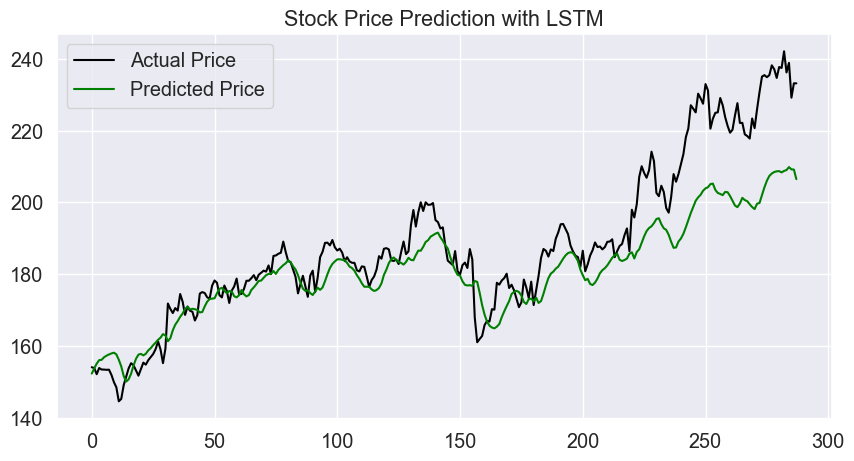

In [2430]:
# Make Predictions & Reverse Scaling
y_pred_scaled = model.predict(X_test)

# Inverse transform to original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_unscaled = scaler_y.inverse_transform(y_test)

# Evaluate Model Performance
mse = mean_squared_error(y_test_unscaled, y_pred)
rmse = np.sqrt(mse)
print(f"Final RMSE: {rmse}")

# Plot Actual vs. Predicted Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.show()


## comparing with the previous graph 

10/10 [==============================] - 4s 29ms/step
Final RMSE: 10.66842615404719


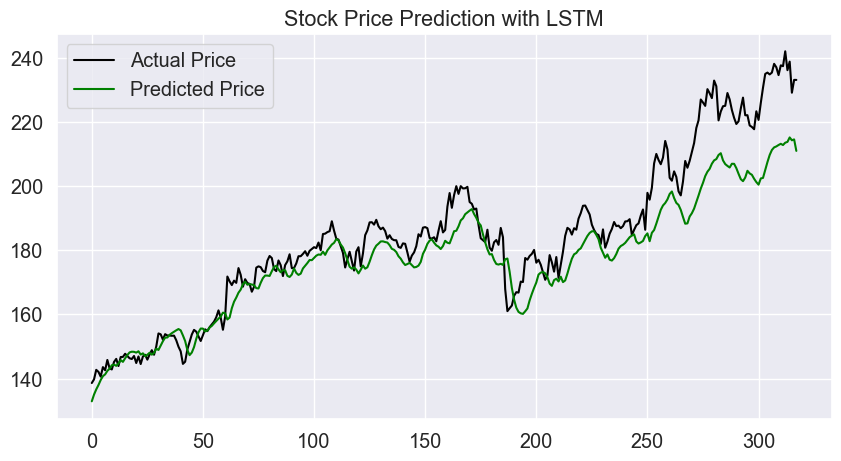

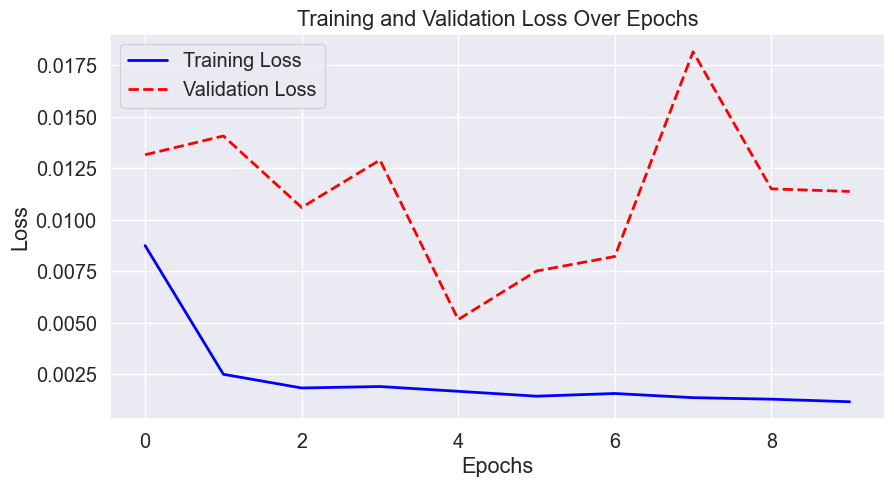

In [2431]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2432]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 50.52%


## Training on GRU

In [2433]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

# Define GRU Model
model = Sequential([
    GRU(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.2),

    GRU(128, return_sequences=False, activation='tanh'),
    Dropout(0.2),

    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])

# Compile Model
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber')

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)




Epoch 1/50
42/42 [==============================] - 69s 325ms/step - loss: 0.1459 - val_loss: 0.0805 - lr: 0.0010
Epoch 2/50
42/42 [==============================] - 10s 245ms/step - loss: 0.0496 - val_loss: 0.0307 - lr: 0.0010
Epoch 3/50
42/42 [==============================] - 10s 247ms/step - loss: 0.0216 - val_loss: 0.0146 - lr: 0.0010
Epoch 4/50
42/42 [==============================] - 10s 246ms/step - loss: 0.0109 - val_loss: 0.0077 - lr: 0.0010
Epoch 5/50
42/42 [==============================] - 10s 247ms/step - loss: 0.0060 - val_loss: 0.0053 - lr: 0.0010
Epoch 6/50
42/42 [==============================] - 11s 252ms/step - loss: 0.0039 - val_loss: 0.0045 - lr: 0.0010
Epoch 7/50
42/42 [==============================] - 10s 247ms/step - loss: 0.0029 - val_loss: 0.0032 - lr: 0.0010
Epoch 8/50
42/42 [==============================] - 10s 248ms/step - loss: 0.0024 - val_loss: 0.0055 - lr: 0.0010
Epoch 9/50
42/42 [==============================] - 10s 244ms/step - loss: 0.0020 - val_

9/9 [==============================] - 4s 101ms/step


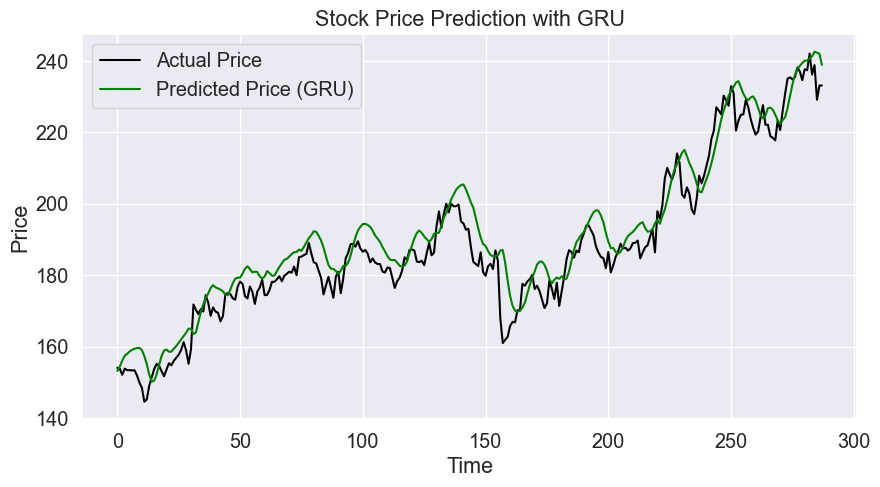

In [2434]:
# Predictions
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Plot Predictions
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price (GRU)', color='green')
plt.legend()
plt.title('Stock Price Prediction with GRU')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


### Comparing with the previous GRU graph 

10/10 [==============================] - 1s 62ms/step


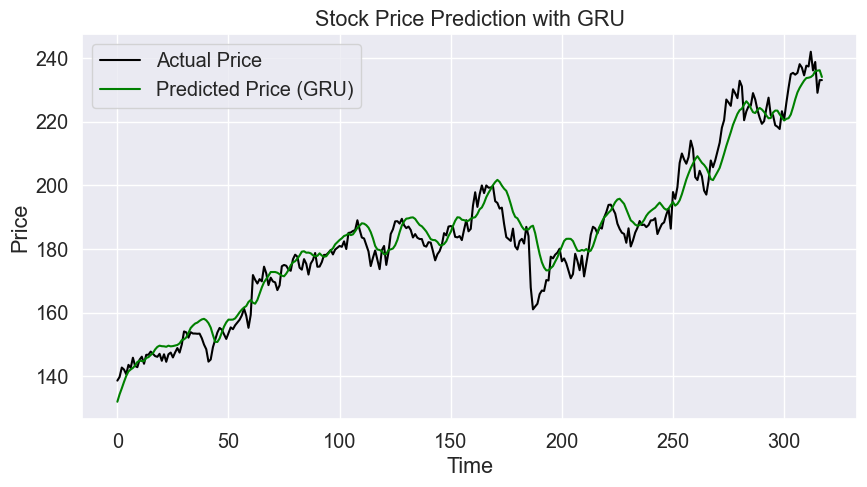

In [2435]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")

Directional Accuracy: 50.17%


## Training with Look_back 90

In [2436]:


# Create Sequences
look_back = 90  # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Defining LSTM Model with Dropout
model = Sequential([
    Bidirectional(LSTM(128, return_sequences=True), input_shape=(look_back, len(features))),  # BiLSTM
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compile Model with Directional-Aware Loss Function
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber_loss', metrics=['mae'])

# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-5, verbose=1)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32,
    epochs= 50,
    callbacks=[early_stopping],
    shuffle=True
)

Epoch 1/50
41/41 [==============================] - 32s 304ms/step - loss: 0.0090 - mae: 0.0928 - val_loss: 0.0098 - val_mae: 0.1049
Epoch 2/50
41/41 [==============================] - 8s 195ms/step - loss: 0.0024 - mae: 0.0509 - val_loss: 0.0052 - val_mae: 0.0713
Epoch 3/50
41/41 [==============================] - 8s 190ms/step - loss: 0.0020 - mae: 0.0468 - val_loss: 0.0107 - val_mae: 0.1202
Epoch 4/50
41/41 [==============================] - 8s 188ms/step - loss: 0.0020 - mae: 0.0463 - val_loss: 0.0131 - val_mae: 0.1398
Epoch 5/50
41/41 [==============================] - 8s 194ms/step - loss: 0.0016 - mae: 0.0412 - val_loss: 0.0101 - val_mae: 0.1189
Epoch 6/50
41/41 [==============================] - 8s 194ms/step - loss: 0.0014 - mae: 0.0392 - val_loss: 0.0131 - val_mae: 0.1398
Epoch 7/50
41/41 [==============================] - 8s 191ms/step - loss: 0.0014 - mae: 0.0396 - val_loss: 0.0134 - val_mae: 0.1419


9/9 [==============================] - 1s 74ms/step
Final RMSE: 12.142357351439202


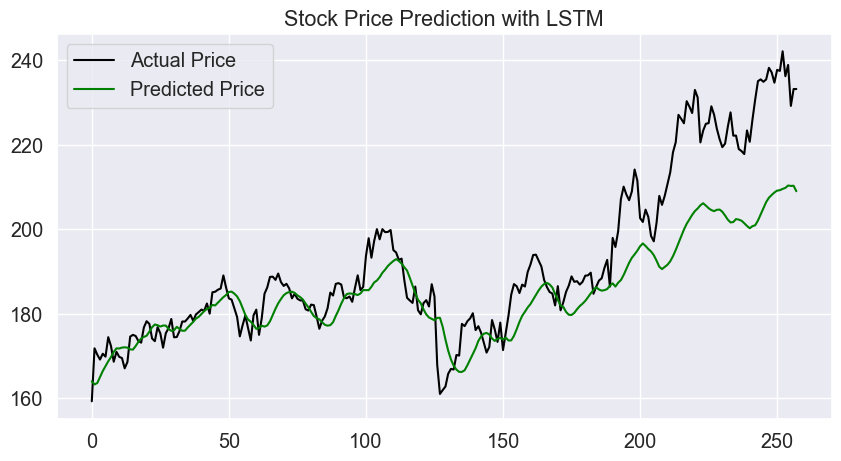

In [2438]:
# Make Predictions & Reverse Scaling
y_pred_scaled = model.predict(X_test)

# Inverse transform to original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_unscaled = scaler_y.inverse_transform(y_test)

# Evaluate Model Performance
mse = mean_squared_error(y_test_unscaled, y_pred)
rmse = np.sqrt(mse)
print(f"Final RMSE: {rmse}")

# Plot Actual vs. Predicted Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price', color='green')
plt.legend()
plt.title('Stock Price Prediction with LSTM')
plt.show()


# comparing with the look_back 60 graph 

9/9 [==============================] - 1s 55ms/step
Final RMSE: 12.133084043265558


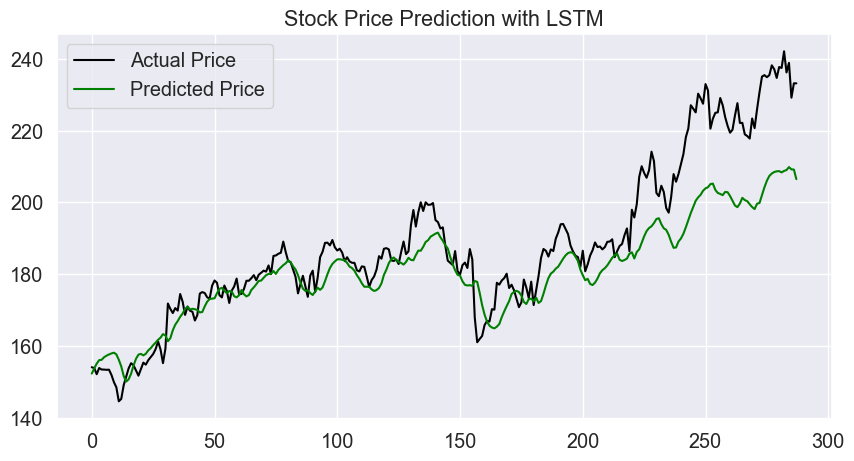

## comparing with the previous graph 

10/10 [==============================] - 4s 29ms/step
Final RMSE: 10.66842615404719


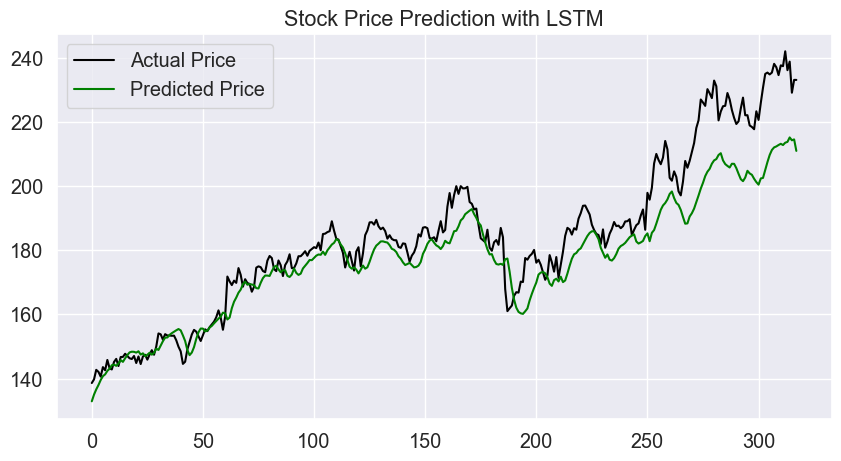

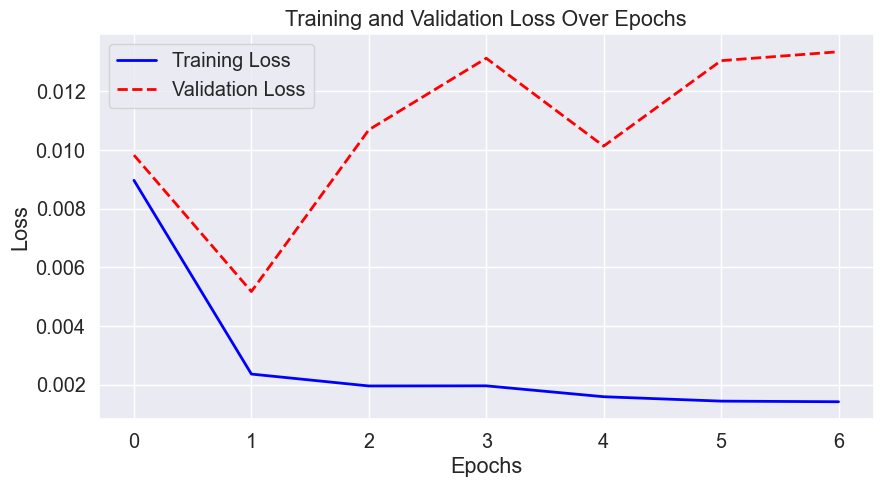

In [2439]:

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='dashed', linewidth=2)

plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [2440]:
# Step 1: Calculate the actual price direction (day-over-day change)
actual_direction = np.sign(y_test[1:] - y_test[:-1])

# Step 2: Calculate the predicted price direction (day-over-day change)
predicted_direction = np.sign(y_pred[1:] - y_pred[:-1])

# Step 3: Compare directions
correct_directions = np.sum(actual_direction == predicted_direction)

# Step 4: Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_direction)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")


Directional Accuracy: 48.25%


## Training on GRU

In [107]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2


In [2441]:

# Define GRU Model
model = Sequential([
    GRU(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.2),

    GRU(128, return_sequences=False, activation='tanh'),
    Dropout(0.2),

    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])

# Compile Model
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber')

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)




Epoch 1/50
41/41 [==============================] - 33s 434ms/step - loss: 0.1427 - val_loss: 0.0723 - lr: 0.0010
Epoch 2/50
41/41 [==============================] - 15s 367ms/step - loss: 0.0429 - val_loss: 0.0232 - lr: 0.0010
Epoch 3/50
41/41 [==============================] - 15s 358ms/step - loss: 0.0155 - val_loss: 0.0105 - lr: 0.0010
Epoch 4/50
41/41 [==============================] - 15s 365ms/step - loss: 0.0070 - val_loss: 0.0056 - lr: 0.0010
Epoch 5/50
41/41 [==============================] - 15s 359ms/step - loss: 0.0044 - val_loss: 0.0055 - lr: 0.0010
Epoch 6/50
41/41 [==============================] - 14s 354ms/step - loss: 0.0029 - val_loss: 0.0023 - lr: 0.0010
Epoch 7/50
41/41 [==============================] - 15s 362ms/step - loss: 0.0025 - val_loss: 0.0025 - lr: 0.0010
Epoch 8/50
41/41 [==============================] - 15s 362ms/step - loss: 0.0020 - val_loss: 0.0020 - lr: 0.0010
Epoch 9/50
41/41 [==============================] - 15s 365ms/step - loss: 0.0019 - val_

9/9 [==============================] - 4s 136ms/step


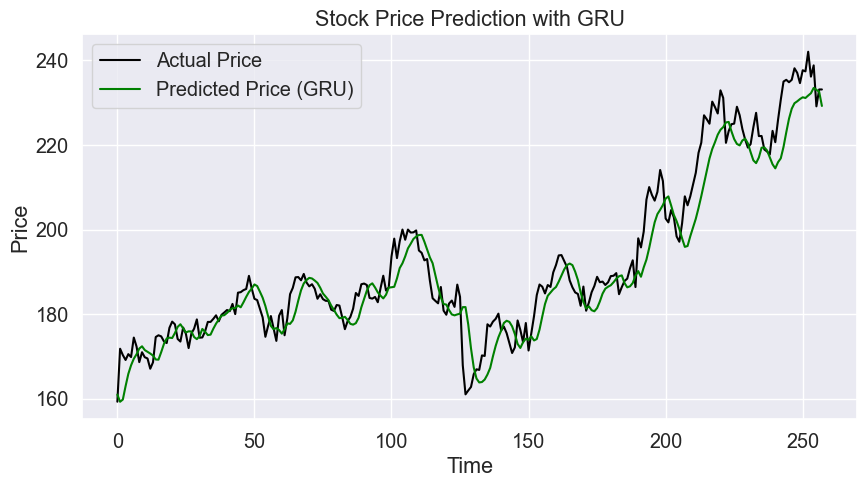

In [2442]:
# Predictions
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Plot Predictions
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price (GRU)', color='green')
plt.legend()
plt.title('Stock Price Prediction with GRU')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


## Comparing with the look_back 60 graph

## (Do not run the below graph)

9/9 [==============================] - 4s 101ms/step


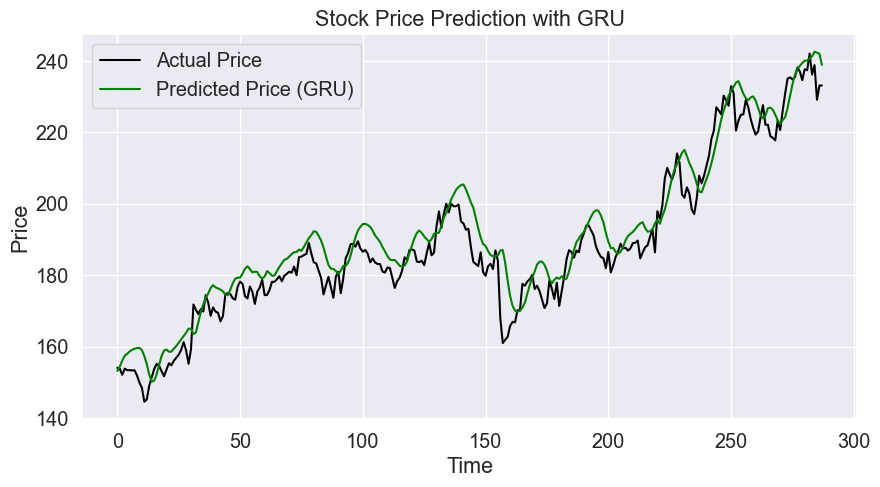

### Comparing with the previous GRU graph 

## (Don not run the below graph)

10/10 [==============================] - 1s 62ms/step


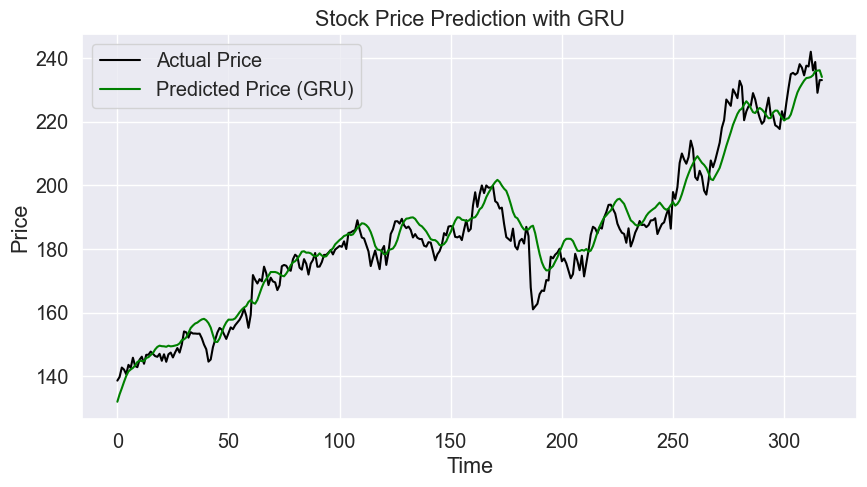

In [2443]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")

Directional Accuracy: 50.19%


# On GRU with look_back = 75

In [108]:


# Create Sequences
look_back = 75 # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Define GRU Model
model = Sequential([
    GRU(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.2),

    GRU(128, return_sequences=False, activation='tanh'),
    Dropout(0.2),

    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])

# Compile Model
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber')

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)


NameError: name 'early_stopping' is not defined

9/9 [==============================] - 5s 123ms/step


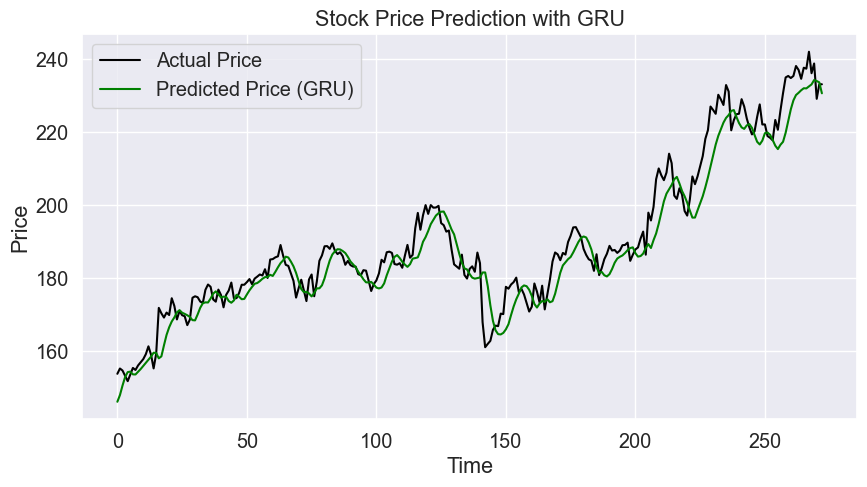

In [2447]:
# Predictions
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Plot Predictions
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price (GRU)', color='green')
plt.legend()
plt.title('Stock Price Prediction with GRU')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()


## Training using all the 30 features on GRU model using look back 75 

In [138]:
from tensorflow.keras.losses import Huber


# Defining Features & Target
features = data.columns[:30]
target = 'Close_t+1'

# Splitting Data Chronologically (80% Train, 20% Test)
train_size = int(len(data) * 0.8)
train_data = data.iloc[:train_size]
test_data = data.iloc[train_size:]

# Applying Scaling Separately 
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Scaling features separately for train/test 
train_scaled = scaler_X.fit_transform(train_data[features])
test_scaled = scaler_X.transform(test_data[features])

# Scaling the target variable separately
y_train_scaled = scaler_y.fit_transform(train_data[[target]])
y_test_scaled = scaler_y.transform(test_data[[target]])

In [141]:

# Create Sequences
look_back = 75 # Increased look-back window to capture longer historical patterns

def create_sequences(data, target, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :])  # Use past `look_back` days as input
        y.append(target[i])  # The target variable
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_scaled, y_train_scaled, look_back)
X_test, y_test = create_sequences(test_scaled, y_test_scaled, look_back)

# Define GRU Model
model = Sequential([
    GRU(256, return_sequences=True, activation='tanh', kernel_regularizer=l2(0.01), input_shape=(look_back, X_train.shape[2])),
    Dropout(0.2),

    GRU(128, return_sequences=False, activation='tanh'),
    Dropout(0.2),

    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])

# Early Stopping & Reduce Learning Rate
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

# Compile Model
model.compile(optimizer=Adam(learning_rate=0.001), loss='huber')

# Train Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/50
42/42 [==============================] - 31s 390ms/step - loss: 0.3759 - val_loss: 0.1972 - lr: 0.0010
Epoch 2/50
42/42 [==============================] - 13s 317ms/step - loss: 0.1294 - val_loss: 0.0798 - lr: 0.0010
Epoch 3/50
42/42 [==============================] - 13s 311ms/step - loss: 0.0577 - val_loss: 0.0413 - lr: 0.0010
Epoch 4/50
42/42 [==============================] - 13s 314ms/step - loss: 0.0302 - val_loss: 0.0215 - lr: 0.0010
Epoch 5/50
42/42 [==============================] - 13s 316ms/step - loss: 0.0166 - val_loss: 0.0144 - lr: 0.0010
Epoch 6/50
42/42 [==============================] - 13s 321ms/step - loss: 0.0099 - val_loss: 0.0121 - lr: 0.0010
Epoch 7/50
42/42 [==============================] - 13s 318ms/step - loss: 0.0060 - val_loss: 0.0103 - lr: 0.0010
Epoch 8/50
42/42 [==============================] - 13s 316ms/step - loss: 0.0040 - val_loss: 0.0130 - lr: 0.0010
Epoch 9/50
42/42 [==============================] - 13s 317ms/step - loss: 0.0033 - val_

9/9 [==============================] - 4s 120ms/step


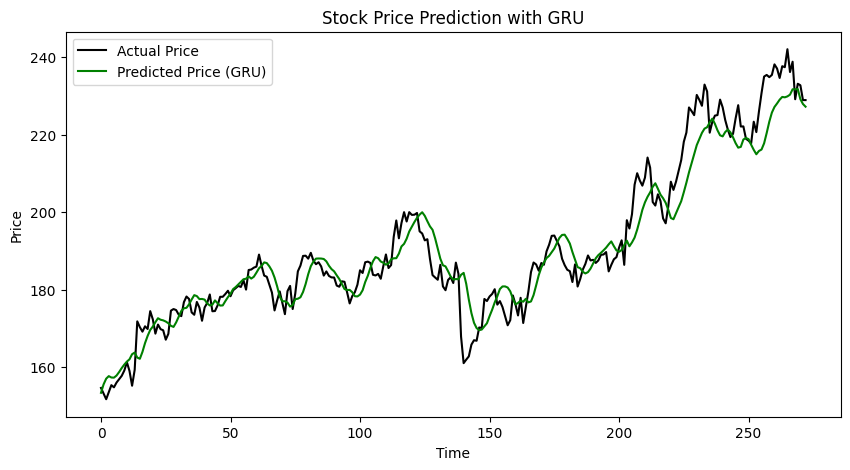

In [142]:
# Predictions
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test_unscaled = scaler_y.inverse_transform(y_test.reshape(-1, 1))

# Plot Predictions
plt.figure(figsize=(10, 5))
plt.plot(y_test_unscaled, label='Actual Price', color='black')
plt.plot(y_pred, label='Predicted Price (GRU)', color='green')
plt.legend()
plt.title('Stock Price Prediction with GRU')
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()

In [ ]:
# Comparing with the previous GRU model with only 

## (Don not run the below graph)

9/9 [==============================] - 5s 123ms/step


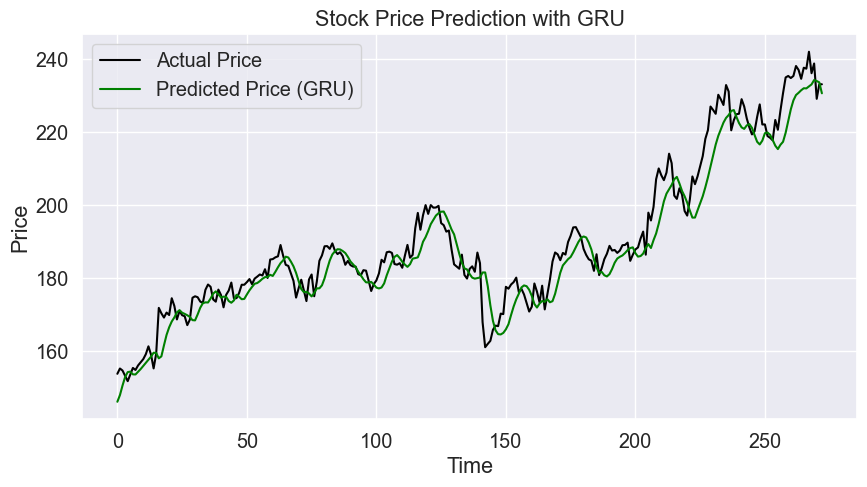

In [145]:
X_test.shape

(273, 75, 30)

In [146]:
# Compute actual and predicted price changes
actual_changes = np.sign(y_test[1:] - y_test[:-1])  # +1 if price increases, -1 if decreases
predicted_changes = np.sign(y_pred[1:] - y_pred[:-1])  # Same for predictions

# Count correct directional predictions
correct_directions = np.sum(actual_changes == predicted_changes)

# Compute Directional Accuracy
directional_accuracy = (correct_directions / len(actual_changes)) * 100

print(f"Directional Accuracy: {directional_accuracy:.2f}%")

Directional Accuracy: 52.57%


### Trail and errors : Hyper parameter Tuning

###  Creating Input Sequences

In [2224]:

# Define look-back window (number of previous days used for prediction)
look_back = 7

# Prepare X (features) and y (target)
X = []  # List to hold feature sequences
y = data_scaled[look_back:, -1]  # Target variable (last column after look_back shift)

# Create sequences for each feature
for j in range(30):  # Only using the first 30 features
    feature_sequences = []  # Store sequences for feature j
    for i in range(look_back, data_scaled.shape[0]):  
        feature_sequences.append(data_scaled[i - look_back:i, j])  # Collect past look_back values
    X.append(feature_sequences)

# Convert to NumPy array and adjust shape
X = np.moveaxis(np.array(X), [0], [2])  # Move axis to match LSTM input shape

# Reshape target variable y to match expected LSTM input
y = np.reshape(y, (len(y), 1))

# Print shapes for verification
print("X shape:", X.shape)  # (samples, look_back, features)
print("y shape:", y.shape)  # (samples, 1)


X shape: (1731, 7, 30)
y shape: (1731, 1)


In [2225]:
# Define train-test split ratio (80% train, 20% test)
train_size = int(len(X) * 0.8)

# Split data into training and testing sets
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Print shapes for verification
print(f"Train Size: {train_size}")
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

# Display first few training target values
print("First few y_train values:", y_train[:5])


Train Size: 1384
X_train shape: (1384, 7, 30)
X_test shape: (347, 7, 30)
y_train shape: (1384, 1)
y_test shape: (347, 1)
First few y_train values: [[0.06056274]
 [0.04374929]
 [0.02499142]
 [0.02956651]
 [0.00800641]]


In [2226]:
# Define LSTM model
lstm_input = Input(shape=(look_back, 30), name='lstm_input')
x = LSTM(150, name='lstm_layer')(lstm_input)
x = Dense(1, name='dense_layer', use_bias=True)(x)
output = Activation('linear', name='output')(x)

# Create and compile the model
model = Model(inputs=lstm_input, outputs=output)
model.compile(optimizer=Adam(), loss='mse')

# Train the model
history = model.fit(
    X_train, y_train,
    batch_size=15,
    epochs=50,
    shuffle=True,
    validation_split=0.1
)

Epoch 1/50
83/83 [==============================] - 16s 54ms/step - loss: 0.0061 - val_loss: 0.0011
Epoch 2/50
83/83 [==============================] - 1s 15ms/step - loss: 8.0428e-04 - val_loss: 6.6973e-04
Epoch 3/50
83/83 [==============================] - 1s 16ms/step - loss: 7.5510e-04 - val_loss: 4.0504e-04
Epoch 4/50
83/83 [==============================] - 1s 15ms/step - loss: 7.4107e-04 - val_loss: 4.1039e-04
Epoch 5/50
83/83 [==============================] - 1s 14ms/step - loss: 6.6183e-04 - val_loss: 9.3204e-04
Epoch 6/50
83/83 [==============================] - 1s 15ms/step - loss: 6.4780e-04 - val_loss: 5.9283e-04
Epoch 7/50
83/83 [==============================] - 1s 15ms/step - loss: 6.8868e-04 - val_loss: 5.5427e-04
Epoch 8/50
83/83 [==============================] - 1s 15ms/step - loss: 6.4117e-04 - val_loss: 8.6942e-04
Epoch 9/50
83/83 [==============================] - 1s 14ms/step - loss: 7.1044e-04 - val_loss: 4.8834e-04
Epoch 10/50
83/83 [=========================

In [2227]:
y_pred = model.predict(X_test)
for i in range(10):
    print(y_pred[i], y_test[i])

11/11 [==============================] - 5s 20ms/step
[0.34379378] [0.36640741]
[0.3460251] [0.33615464]
[0.36050257] [0.33615464]
[0.33287707] [0.33615464]
[0.32387444] [0.34267414]
[0.32286045] [0.35605627]
[0.33464825] [0.32894887]
[0.348787] [0.34198788]
[0.32329506] [0.33604026]
[0.33097383] [0.34747798]


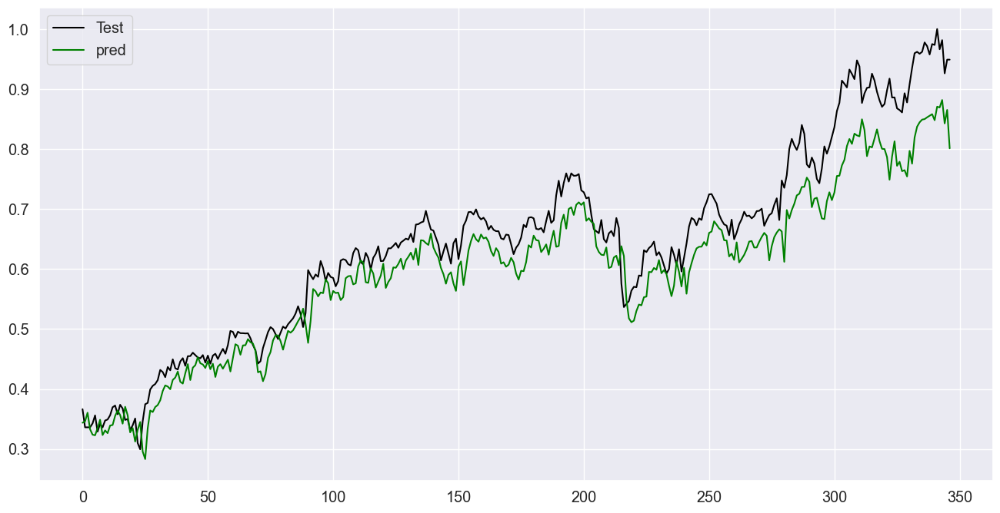

In [2228]:
plt.figure(figsize=(16,8))
plt.plot(y_test, color = 'black', label = 'Test')
plt.plot(y_pred, color = 'green', label = 'pred')
plt.legend()
plt.show()

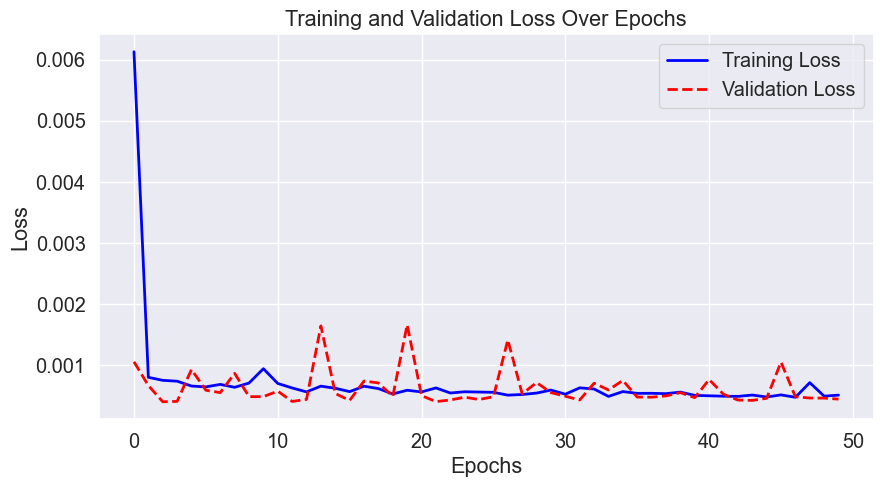

In [2229]:
# Extract loss values
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss', color='blue', linewidth=2)
plt.plot(val_loss, label='Validation Loss', color='red', linestyle='dashed', linewidth=2)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


# Rough work 

###  Creating Input Sequences

In [2047]:

# Define look-back window (number of previous days used for prediction)
look_back = 7

# Prepare X (features) and y (target)
X = []  # List to hold feature sequences
y = data_scaled[look_back:, -1]  # Target variable (last column after look_back shift)

# Create sequences for each feature
for j in range(30):  # Only using the first 8 features
    feature_sequences = []  # Store sequences for feature j
    for i in range(look_back, data_scaled.shape[0]):  
        feature_sequences.append(data_scaled[i - look_back:i, j])  # Collect past look_back values
    X.append(feature_sequences)

# Convert to NumPy array and adjust shape
X = np.moveaxis(np.array(X), [0], [2])  # Move axis to match LSTM input shape

# Reshape target variable y to match expected LSTM input
y = np.reshape(y, (len(y), 1))

# Print shapes for verification
print("X shape:", X.shape)  # (samples, look_back, features)
print("y shape:", y.shape)  # (samples, 1)


X shape: (1730, 7, 30)
y shape: (1730, 1)


In [2048]:
# Define train-test split ratio (80% train, 20% test)
train_size = int(len(X) * 0.8)

# Split data into training and testing sets
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Print shapes for verification
print(f"Train Size: {train_size}")
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

# Display first few training target values
print("First few y_train values:", y_train[:5])


Train Size: 1384
X_train shape: (1384, 7, 30)
X_test shape: (346, 7, 30)
y_train shape: (1384, 1)
y_test shape: (346, 1)
First few y_train values: [[0.06059064]
 [0.04377454]
 [0.0250083 ]
 [0.02956045]
 [0.00801492]]


In [2049]:
# Define LSTM model
lstm_input = Input(shape=(look_back, 30), name='lstm_input')
x = LSTM(150, name='lstm_layer')(lstm_input)
x = Dense(1, name='dense_layer')(x)
output = Activation('linear', name='output')(x)

# Create and compile the model
model = Model(inputs=lstm_input, outputs=output)
model.compile(optimizer=Adam(), loss='mse')

# Train the model
history = model.fit(
    X_train, y_train,
    batch_size=15,
    epochs=50,
    shuffle=True,
    validation_split=0.1
)

Epoch 1/50
83/83 [==============================] - 28s 41ms/step - loss: 0.0047 - val_loss: 0.0011
Epoch 2/50
83/83 [==============================] - 2s 20ms/step - loss: 7.9814e-04 - val_loss: 0.0017
Epoch 3/50
83/83 [==============================] - 1s 14ms/step - loss: 7.4356e-04 - val_loss: 0.0015
Epoch 4/50
83/83 [==============================] - 1s 13ms/step - loss: 8.4244e-04 - val_loss: 0.0022
Epoch 5/50
83/83 [==============================] - 1s 12ms/step - loss: 7.2195e-04 - val_loss: 9.0675e-04
Epoch 6/50
83/83 [==============================] - 1s 14ms/step - loss: 8.4502e-04 - val_loss: 0.0021
Epoch 7/50
83/83 [==============================] - 1s 13ms/step - loss: 6.8284e-04 - val_loss: 8.6452e-04
Epoch 8/50
83/83 [==============================] - 1s 13ms/step - loss: 5.9345e-04 - val_loss: 0.0015
Epoch 9/50
83/83 [==============================] - 1s 13ms/step - loss: 6.3097e-04 - val_loss: 7.5465e-04
Epoch 10/50
83/83 [==============================] - 1s 13ms/ste

In [2050]:
y_pred = model.predict(X_test)
#y_pred=np.where(y_pred > 0.43, 1,0)
for i in range(10):
    print(y_pred[i], y_test[i])

11/11 [==============================] - 2s 10ms/step
[0.29400492] [0.3664147]
[0.30372918] [0.33616226]
[0.3201498] [0.33616226]
[0.29570413] [0.33616226]
[0.28985244] [0.34268169]
[0.29415753] [0.35606369]
[0.30524755] [0.32895657]
[0.31247658] [0.34199541]
[0.28929225] [0.33604786]
[0.29643726] [0.34748545]


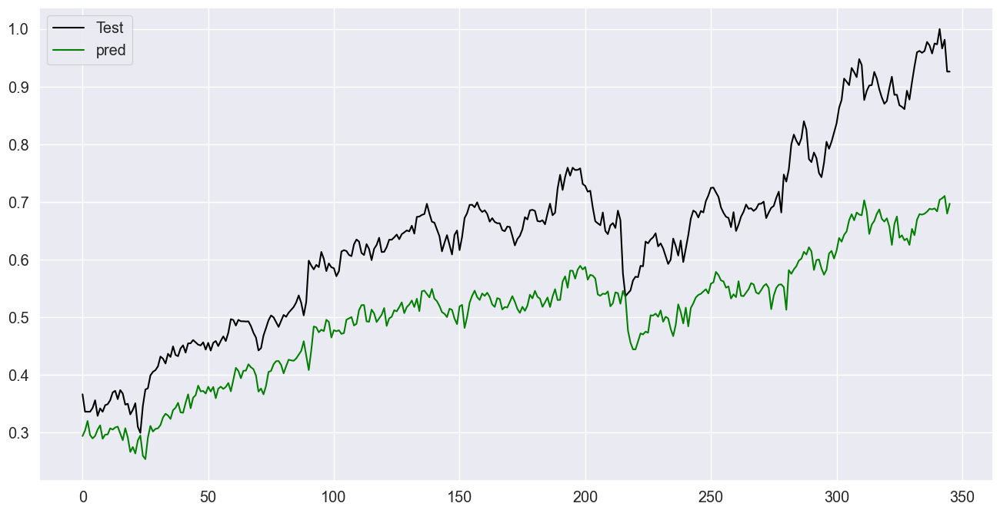

In [2051]:
plt.figure(figsize=(16,8))
plt.plot(y_test, color = 'black', label = 'Test')
plt.plot(y_pred, color = 'green', label = 'pred')
plt.legend()
plt.show()

In [1783]:
# Predict on the test set
predictions = lstm_model.predict(X_test)

# Fix missing feature in scaler.mean_
num_features = X_train.shape[2]  # Should match features used in training
mean_values = np.append(scaler.mean_, 0) if scaler.mean_.shape[0] < num_features else scaler.mean_

# Correct inverse scaling
predictions_unscaled = scaler.inverse_transform(
    np.concatenate(
        [np.full((len(predictions), num_features), mean_values), predictions.reshape(-1, 1)], axis=1
    )
)[:, -1]

y_test_unscaled = scaler.inverse_transform(
    np.concatenate(
        [np.full((len(y_test), num_features), mean_values), y_test.reshape(-1, 1)], axis=1
    )
)[:, -1]

print("Fixed Predictions Unscaled:", predictions_unscaled[:5])


11/11 [==============================] - 9s 69ms/step


ValueError: could not broadcast input array from shape (40,) into shape (336,24)

In [1756]:


# Select Features and Target
features = [
 'Open', 'High', 'Low', 'Close', 'Volume','Close_t-1', 'Close_t-2', 
    'SMA_50', 'EMA_50', 
    'RSI', 'MACD', 'Signal_Line', 'Stochastic_Oscillator', 
    'BB_Upper', 'BB_Lower', 'ATR', 
    'OBV', 'VWAP', 
    'NASDAQ_Close', 'SP500_Close', 'GDP_Growth_Rate', 'Inflation_rate', 
    'Weekday', 'Month'
]
target = 'Close_t+1'

data = df_scaled[features + [target]].dropna()


In [1757]:
# 3. Data Preparation for LSTM
look_back = 60  # Number of previous days to use as input

def create_sequences(data, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :-1])  # Use all columns except the last one (target)
        y.append(data[i, -1])  # The last column is the target (Close)
    return np.array(X), np.array(y)

X, y = create_sequences(data_scaled, look_back)


In [1758]:

# Reshape X to be 3D for LSTM input
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

# Split into training and testing sets
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


In [1759]:
# Build the LSTM Model
lstm_model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2),
    LSTM(64, return_sequences=True),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

In [1760]:
# Compile the model
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')


In [1761]:
# 5. Train the Model
history = lstm_model.fit(X_train, y_train, batch_size=16, epochs=50, validation_data=(X_test, y_test))


Epoch 1/50
53/53 [==============================] - 49s 214ms/step - loss: 0.0964 - val_loss: 0.9229
Epoch 2/50
53/53 [==============================] - 6s 116ms/step - loss: 0.0169 - val_loss: 1.1318
Epoch 3/50
53/53 [==============================] - 6s 114ms/step - loss: 0.0143 - val_loss: 1.0489
Epoch 4/50
53/53 [==============================] - 6s 112ms/step - loss: 0.0121 - val_loss: 1.1097
Epoch 5/50
53/53 [==============================] - 6s 112ms/step - loss: 0.0101 - val_loss: 1.1641
Epoch 6/50
53/53 [==============================] - 6s 113ms/step - loss: 0.0085 - val_loss: 1.0998
Epoch 7/50
53/53 [==============================] - 6s 111ms/step - loss: 0.0089 - val_loss: 1.1065
Epoch 8/50
53/53 [==============================] - 6s 112ms/step - loss: 0.0077 - val_loss: 0.9486
Epoch 9/50
53/53 [==============================] - 6s 117ms/step - loss: 0.0070 - val_loss: 1.0796
Epoch 10/50
53/53 [==============================] - 6s 121ms/step - loss: 0.0074 - val_loss: 1.007

In [1768]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("scaler.mean_ shape:", scaler.mean_.shape)
print("num_features:", num_features)


X_train shape: (840, 60, 41)
X_test shape: (210, 60, 41)
scaler.mean_ shape: (40,)
num_features: 41


In [1769]:
print("Columns in df_scaled (before LSTM processing):", df_scaled.columns)
print("Number of features in scaler:", len(scaler.mean_))
print("Expected number of features:", X_train.shape[2])


Columns in df_scaled (before LSTM processing): Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'SMA_5', 'SMA_10',
       'SMA_50', 'EMA_10', 'EMA_50', 'RSI', 'ROC', 'Stochastic_Oscillator',
       'BB_Upper', 'BB_Lower', 'BB_Middle', 'ATR', 'Std_Dev', 'MACD',
       'Signal_Line', 'OBV', 'CMF', 'VWAP', 'GDP', 'GDP_Growth_Rate', 'UNRATE',
       'Close_t+1', 'Close_t-1', 'Close_t-2', 'Volume_t-1', 'SP500_Close',
       'SP500_Volume', 'NASDAQ_Close', 'NASDAQ_Volume', 'Inflation_rate',
       'CPI', '10_Yr_Yield', 'Weekday', 'Month', 'Year'],
      dtype='object')
Number of features in scaler: 40
Expected number of features: 41


In [1770]:
scaler.fit(df_scaled.drop(columns=['Date'], errors='ignore'))


StandardScaler()

In [1775]:
print("X_test shape:", X_test.shape)  # (210, 60, 41)
print("scaler.mean_ shape:", scaler.mean_.shape)  # Should match num_features (likely 40)
print("scaler.scale_ shape:", scaler.scale_.shape)  # Should match num_features (likely 40)
print("Number of features in X_train:", X_train.shape[2])  # Should match mean_


X_test shape: (210, 60, 41)
scaler.mean_ shape: (40,)
scaler.scale_ shape: (40,)
Number of features in X_train: 41


In [1776]:
# Fix: Append a zero to match the missing feature count
mean_values = np.append(scaler.mean_, 0)
scale_values = np.append(scaler.scale_, 1)  # Append 1 to avoid division by zero


In [1778]:
print("Updated mean_values shape:", mean_values.shape)  # Should be (41,)
print("Updated scale_values shape:", scale_values.shape)  # Should be (41,)
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)


Updated mean_values shape: (41,)
Updated scale_values shape: (41,)
X_train shape: (840, 60, 41)
X_test shape: (210, 60, 41)


In [1779]:
# Get the number of input features used for training (excluding the target)
#num_features = X_train.shape[2]  # Should match the number of features used in training

# Predict on the test set
predictions = lstm_model.predict(X_test)

predictions_unscaled = scaler.inverse_transform(
    np.concatenate(
        [np.full((len(predictions), X_train.shape[2]), mean_values), predictions.reshape(-1, 1)], axis=1
    )
)[:, -1]

y_test_unscaled = scaler.inverse_transform(
    np.concatenate(
        [np.full((len(y_test), X_train.shape[2]), mean_values), y_test.reshape(-1, 1)], axis=1
    )
)[:, -1]



7/7 [==============================] - 1s 62ms/step


ValueError: operands could not be broadcast together with shapes (210,42) (40,) (210,42) 

In [1764]:
# Predict on the test set
predictions = lstm_model.predict(X_test)

num_features = scaler.n_features_in_ - 1  # Exclude target variable
# Reverse scaling for predictions
predictions = scaler.inverse_transform(
    np.concatenate([np.zeros((len(predictions), num_features)), predictions.reshape(-1, 1)], axis=1)
)[:, -1]
  # Only rescale the target (last column)

# Reverse scaling for the actual test values
y_test_unscaled = scaler.inverse_transform(
    np.concatenate([np.zeros((len(y_test), num_features)), y_test.reshape(-1, 1)], axis=1)
)[:, -1]


7/7 [==============================] - 0s 54ms/step


In [1765]:
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test_unscaled, predictions))
print("Root Mean Squared Error (RMSE):", rmse)

Root Mean Squared Error (RMSE): 2.293891998747931


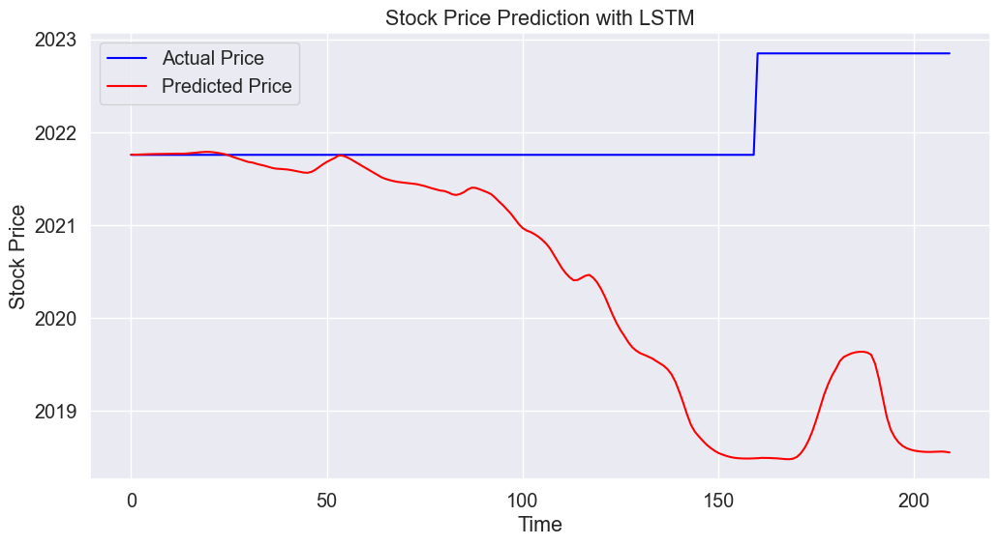

In [1766]:


# 7. Visualization
plt.figure(figsize=(12, 6))
plt.plot(y_test_unscaled, label='Actual Price', color='blue')
plt.plot(predictions, label='Predicted Price', color='red')
plt.title('Stock Price Prediction with LSTM')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.show()




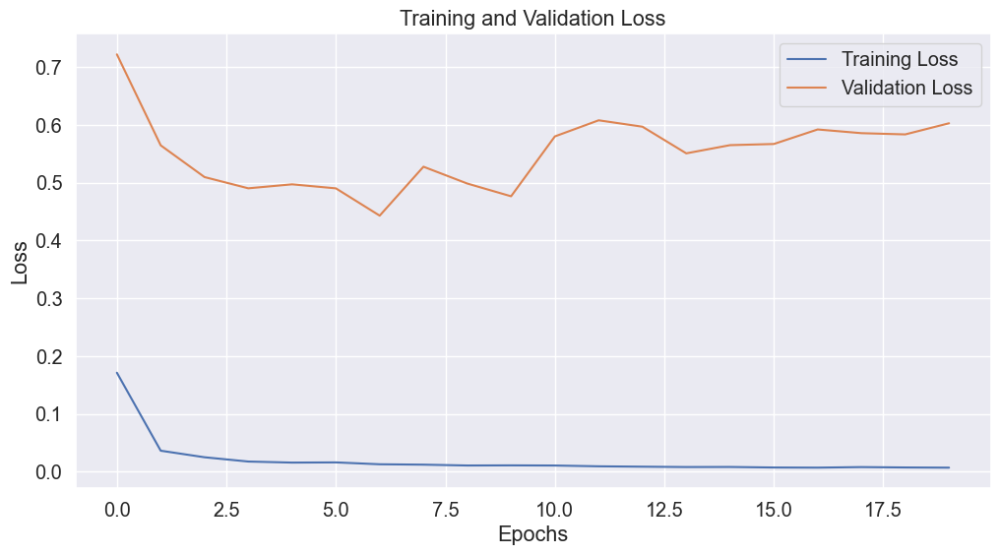

In [1427]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

- **Training Loss:** Decreases steadily, indicating the model is learning from the training data effectively.
- **Validation Loss:** Initially decreases but starts fluctuating and diverging, suggesting **overfitting**.
- **Early Epochs:** Both losses decrease, showing good learning progress.
- **Later Epochs:** Validation loss fluctuates while training loss remains low, indicating memorization of training data.
- **Actionable Steps:**
  - Use **early stopping** to prevent overfitting.
  - Apply **regularization techniques** like dropout or weight decay.
  - Fine-tune **hyperparameters** (e.g., learning rate) for better validation performance.

In [1448]:


# Select Features and Target
features = [

 'Close_t-1',
 'Close_t-2',
 'Volume',
 'SMA_50',
 'EMA_50',
 'RSI',
 'Stochastic_Oscillator',
 'MACD',
 'Signal_Line',
 'BB_Upper',
 'BB_Lower',
 'ATR',
 'OBV',
 'VWAP',
 'GDP',
 'GDP_Growth_Rate',
 'UNRATE',
 'Inflation_rate',
 'CPI',
 '10_Yr_Yield',
 'SP500_Close',
 'NASDAQ_Close',
 'Weekday',
 'Month',
 'Year'
]
target = 'Close_t+1'

data = df_scaled[features + [target]].dropna()


In [1449]:
# 3. Data Preparation for LSTM
look_back = 60  # Number of previous days to use as input

def create_sequences(data, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :-1])  # Use all columns except the last one (target)
        y.append(data[i, -1])  # The last column is the target (Close)
    return np.array(X), np.array(y)

X, y = create_sequences(data_scaled, look_back)


In [1450]:

# Reshape X to be 3D for LSTM input
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

# Split into training and testing sets
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


In [1451]:
# 4. Build the LSTM Model
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
x = LSTM(50, return_sequences=True)(inputs)
x = Dropout(0.2)(x)
x = LSTM(50, return_sequences=False)(x)
x = Dropout(0.2)(x)
x = Dense(25)(x)
outputs = Dense(1)(x)

lstm_model = Model(inputs=inputs, outputs=outputs)


In [1452]:
# Compile the model
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')


In [1453]:
# 5. Train the Model
history = lstm_model.fit(X_train, y_train, batch_size=32, epochs=20, validation_data=(X_test, y_test))


Epoch 1/20
27/27 [==============================] - 17s 205ms/step - loss: 0.1382 - val_loss: 0.6709
Epoch 2/20
27/27 [==============================] - 2s 85ms/step - loss: 0.0324 - val_loss: 0.6238
Epoch 3/20
27/27 [==============================] - 2s 86ms/step - loss: 0.0212 - val_loss: 0.5599
Epoch 4/20
27/27 [==============================] - 2s 85ms/step - loss: 0.0178 - val_loss: 0.5619
Epoch 5/20
27/27 [==============================] - 2s 85ms/step - loss: 0.0163 - val_loss: 0.5376
Epoch 6/20
27/27 [==============================] - 2s 84ms/step - loss: 0.0136 - val_loss: 0.5812
Epoch 7/20
27/27 [==============================] - 2s 85ms/step - loss: 0.0128 - val_loss: 0.5239
Epoch 8/20
27/27 [==============================] - 2s 84ms/step - loss: 0.0123 - val_loss: 0.5118
Epoch 9/20
27/27 [==============================] - 2s 84ms/step - loss: 0.0103 - val_loss: 0.5342
Epoch 10/20
27/27 [==============================] - 2s 87ms/step - loss: 0.0094 - val_loss: 0.5168
Epoch 1

In [1454]:
print(f"Shape of predictions: {predictions.shape}")
print(f"Shape of y_test: {y_test.shape}")
print(f"Shape of scaler.min_: {scaler.min_.shape}")


Shape of predictions: (210,)
Shape of y_test: (210,)


AttributeError: 'StandardScaler' object has no attribute 'min_'

In [1455]:
# Predict on the test set
predictions = lstm_model.predict(X_test)

num_features = scaler.n_features_in_ - 1  # Exclude target variable
# Reverse scaling for predictions
predictions = scaler.inverse_transform(
    np.concatenate([np.zeros((len(predictions), num_features)), predictions.reshape(-1, 1)], axis=1)
)[:, -1]
  # Only rescale the target (last column)

# Reverse scaling for the actual test values
y_test_unscaled = scaler.inverse_transform(
    np.concatenate([np.zeros((len(y_test), num_features)), y_test.reshape(-1, 1)], axis=1)
)[:, -1]


7/7 [==============================] - 3s 30ms/step


In [1456]:
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test_unscaled, predictions))
print("Root Mean Squared Error (RMSE):", rmse)

Root Mean Squared Error (RMSE): 1.1472485844536404


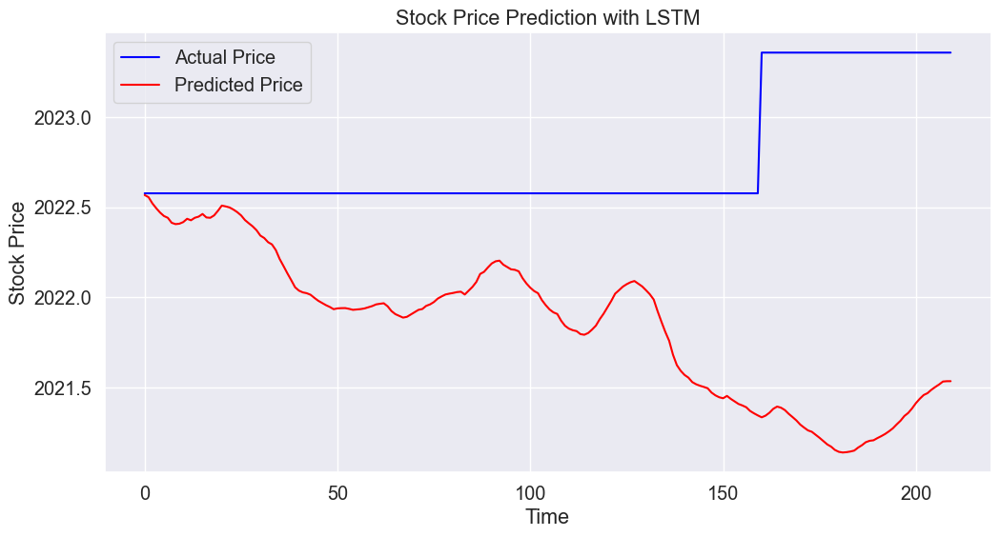

In [1457]:


# 7. Visualization
plt.figure(figsize=(12, 6))
plt.plot(y_test_unscaled, label='Actual Price', color='blue')
plt.plot(predictions, label='Predicted Price', color='red')
plt.title('Stock Price Prediction with LSTM')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.show()




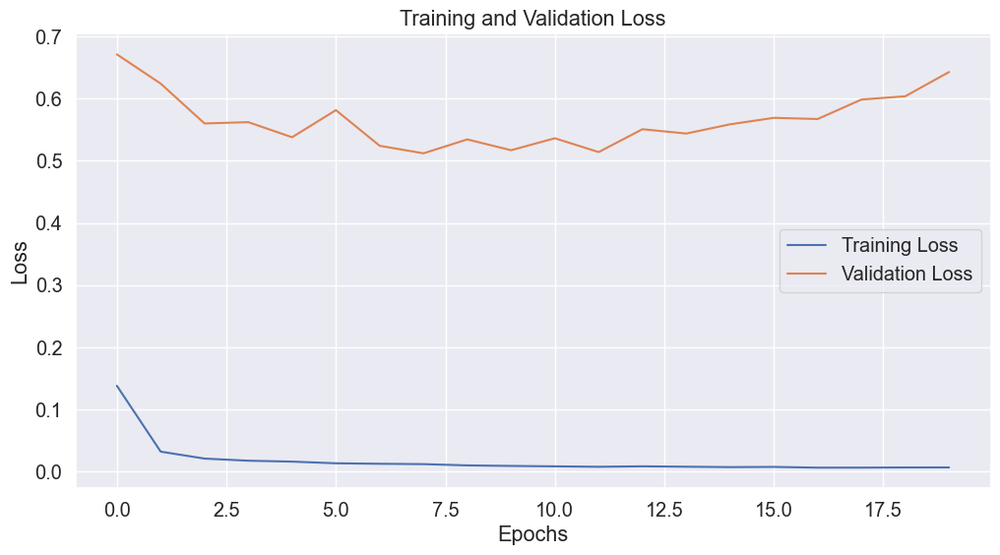

In [1458]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [1000]:
# Select Features and Target
features = [
    'Close_t-1', 'Close_t-2', 'Volume', 'SMA_50', 'SMA_200', 'EMA_50',
    'RSI', 'Stochastic_Oscillator', 'MACD', 'Signal_Line', 'BB_Upper',
    'BB_Lower', 'ATR', 'OBV', 'VWAP', 'GDP', 'GDP_Growth_Rate', 'UNRATE',
    'Inflation_rate', 'CPI', '10_Yr_Yield', 'SP500_Close', 'NASDAQ_Close',
    'Weekday', 'Month', 'Year'
]
target = 'Close_t+1'

# Prepare the dataset
data = df_scaled[features + [target]].dropna()


In [1001]:
# Define Lookback Period (Number of previous days to use as input)
look_back = 60

# Function to create sequences for LSTM
def create_sequences(data, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :-1])  # Use all columns except the last one (target)
        y.append(data[i, -1])  # The last column is the target (Close)
    return np.array(X), np.array(y)

# Convert DataFrame to NumPy array
data_scaled = data.values

# Create sequences
X, y = create_sequences(data_scaled, look_back)

# Reshape X to be 3D for LSTM input
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

# Split into training and testing sets
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


In [1002]:
# Build LSTM Model
lstm_model = Sequential()

# First LSTM Layer (50 units) + Dropout (20%)
lstm_model.add(LSTM(units=50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
lstm_model.add(Dropout(0.2))

# Second LSTM Layer (60 units) + Dropout (30%)
lstm_model.add(LSTM(units=60, activation='relu', return_sequences=True))
lstm_model.add(Dropout(0.3))

# Third LSTM Layer (80 units) + Dropout (40%)
lstm_model.add(LSTM(units=80, activation='relu', return_sequences=True))
lstm_model.add(Dropout(0.4))

# Fourth LSTM Layer (120 units) + Dropout (50%) - Final Layer
lstm_model.add(LSTM(units=120, activation='relu'))
lstm_model.add(Dropout(0.5))

# Output Layer (Single Neuron for Regression)
lstm_model.add(Dense(units=1))

# Compile the model
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Model Summary
lstm_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 60, 50)            15400     
                                                                 
 dropout_4 (Dropout)         (None, 60, 50)            0         
                                                                 
 lstm_5 (LSTM)               (None, 60, 60)            26640     
                                                                 
 dropout_5 (Dropout)         (None, 60, 60)            0         
                                                                 
 lstm_6 (LSTM)               (None, 60, 80)            45120     
                                                                 
 dropout_6 (Dropout)         (None, 60, 80)            0         
                                                                 
 lstm_7 (LSTM)               (None, 120)               9

In [1003]:
# Train the model
history = lstm_model.fit(X_train, y_train, batch_size=32, epochs=20, validation_data=(X_test, y_test))


Epoch 1/20
39/39 [==============================] - 29s 283ms/step - loss: 0.3204 - val_loss: 0.6470
Epoch 2/20
39/39 [==============================] - 9s 227ms/step - loss: 0.0800 - val_loss: 0.1173
Epoch 3/20
39/39 [==============================] - 9s 227ms/step - loss: 0.0590 - val_loss: 0.1916
Epoch 4/20
39/39 [==============================] - 9s 227ms/step - loss: 0.0484 - val_loss: 0.4448
Epoch 5/20
39/39 [==============================] - 9s 226ms/step - loss: 0.0459 - val_loss: 0.2410
Epoch 6/20
39/39 [==============================] - 9s 227ms/step - loss: 0.0405 - val_loss: 0.7494
Epoch 7/20
39/39 [==============================] - 9s 224ms/step - loss: 0.0386 - val_loss: 0.6875
Epoch 8/20
39/39 [==============================] - 9s 227ms/step - loss: 0.0380 - val_loss: 1.1308
Epoch 9/20
39/39 [==============================] - 9s 226ms/step - loss: 0.0391 - val_loss: 0.8254
Epoch 10/20
39/39 [==============================] - 9s 222ms/step - loss: 0.0341 - val_loss: 1.753

In [1004]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Make Predictions
y_pred = lstm_model.predict(X_test)

# Compute Error Metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


10/10 [==============================] - 3s 82ms/step
Mean Squared Error (MSE): 405.1412948658145
Mean Absolute Error (MAE): 6.447531720517938
Root Mean Squared Error (RMSE): 20.128121990533902


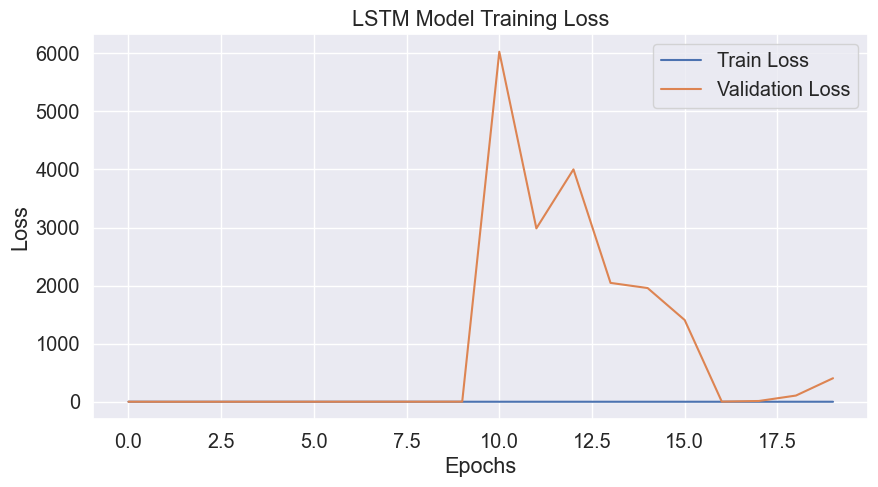

In [1005]:
# Plot Training & Validation Loss
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Model Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [1006]:
# Define Lookback Period (Number of previous days to use as input)
look_back = 60

# Function to create sequences for LSTM
def create_sequences(data, look_back):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i, :-1])  # Use all columns except the last one (target)
        y.append(data[i, -1])  # The last column is the target (Close)
    return np.array(X), np.array(y)

# Convert DataFrame to NumPy array
data_scaled = data.values

# Create sequences
X, y = create_sequences(data_scaled, look_back)

# Reshape X to be 3D for LSTM input
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

# Split into training and testing sets
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


In [1007]:
# Build LSTM Model
lstm_model = Sequential()

# First LSTM Layer (50 units) + Dropout (20%)
lstm_model.add(LSTM(units=50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
lstm_model.add(Dropout(0.2))

# Second LSTM Layer (60 units) + Dropout (25%)
lstm_model.add(LSTM(units=60, activation='relu', return_sequences=True))
lstm_model.add(Dropout(0.25))

# Third LSTM Layer (80 units) + Dropout (30%)
lstm_model.add(LSTM(units=80, activation='relu', return_sequences=True))
lstm_model.add(Dropout(0.3))

# Fourth LSTM Layer (120 units) + Dropout (40%) - Final Layer
lstm_model.add(LSTM(units=120, activation='relu'))
lstm_model.add(Dropout(0.4))

# Output Layer (Single Neuron for Regression)
lstm_model.add(Dense(units=1))

# Compile the model
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Model Summary
lstm_model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 60, 50)            15400     
                                                                 
 dropout_8 (Dropout)         (None, 60, 50)            0         
                                                                 
 lstm_9 (LSTM)               (None, 60, 60)            26640     
                                                                 
 dropout_9 (Dropout)         (None, 60, 60)            0         
                                                                 
 lstm_10 (LSTM)              (None, 60, 80)            45120     
                                                                 
 dropout_10 (Dropout)        (None, 60, 80)            0         
                                                                 
 lstm_11 (LSTM)              (None, 120)              

In [1009]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Early Stopping (Stops training when validation loss stops improving)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Reduce Learning Rate if Validation Loss Stops Improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)


In [1010]:
history = lstm_model.fit(
    X_train, y_train, batch_size=64, epochs=50, validation_data=(X_test, y_test),
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/50
20/20 [==============================] - 21s 462ms/step - loss: 0.6888 - val_loss: 1.9808 - lr: 0.0010
Epoch 2/50
20/20 [==============================] - 6s 298ms/step - loss: 0.1809 - val_loss: 1.6912 - lr: 0.0010
Epoch 3/50
20/20 [==============================] - 6s 299ms/step - loss: 0.1032 - val_loss: 1.3900 - lr: 0.0010
Epoch 4/50
20/20 [==============================] - 6s 305ms/step - loss: 0.0737 - val_loss: 1.6010 - lr: 0.0010
Epoch 5/50
20/20 [==============================] - 6s 304ms/step - loss: 0.0600 - val_loss: 1.8972 - lr: 0.0010
Epoch 6/50
20/20 [==============================] - ETA: 0s - loss: 0.0560
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
20/20 [==============================] - 6s 301ms/step - loss: 0.0560 - val_loss: 1.9057 - lr: 0.0010
Epoch 7/50
20/20 [==============================] - 6s 301ms/step - loss: 0.0447 - val_loss: 2.0035 - lr: 5.0000e-04
Epoch 8/50
20/20 [==============================] - 6s 303ms/ste

In [1011]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Make Predictions
y_pred = lstm_model.predict(X_test)

# Compute Error Metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


10/10 [==============================] - 2s 79ms/step
Mean Squared Error (MSE): 1.3900441890567978
Mean Absolute Error (MAE): 1.0815216310388154
Root Mean Squared Error (RMSE): 1.1790013524406144


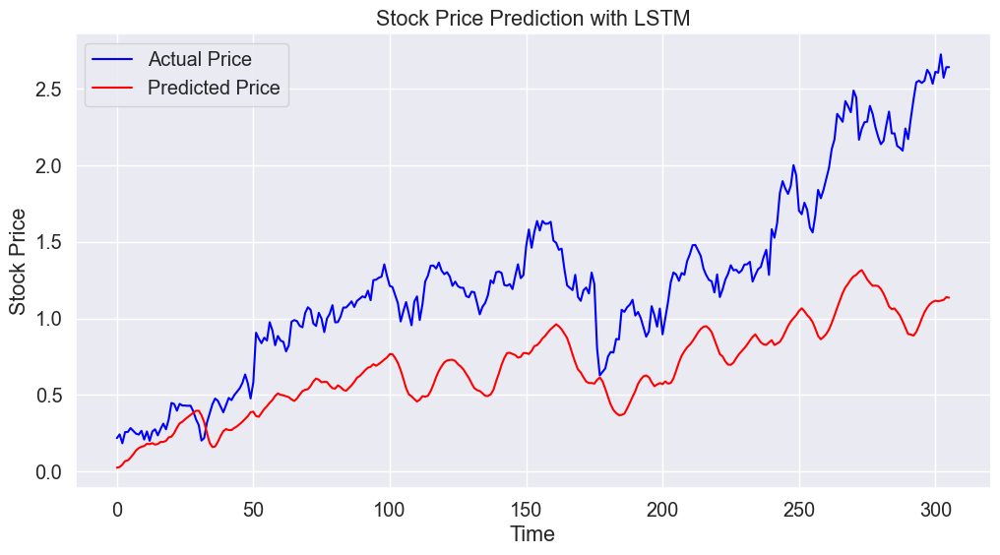

In [1013]:
# Visualization
plt.figure(figsize=(12, 6))
plt.plot(y_test_unscaled, label='Actual Price', color='blue')
plt.plot(predictions, label='Predicted Price', color='red')
plt.title('Stock Price Prediction with LSTM')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.show()


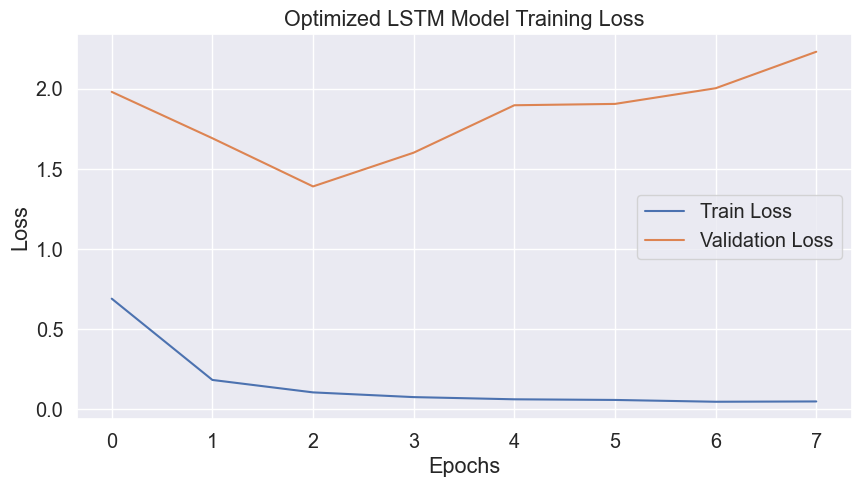

In [1012]:
# Plot Training & Validation Loss
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Optimized LSTM Model Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [1023]:
# Drop 'Date' column before training (LSTM does not accept datetime values)
df_scaled = df_scaled.drop(columns=['Date'], errors='ignore')


# Define train-test split (70% train, 30% test)
train_size = int(len(df_scaled) * 0.70)

# Split the dataset into training and testing
data_training = df_scaled.iloc[:train_size]
data_testing = df_scaled.iloc[train_size:]

print("Training Data Shape:", data_training.shape)
print("Testing Data Shape:", data_testing.shape)

# Convert DataFrame to NumPy array for sequence generation
data_scaled = data_training.values

# Define lookback window (Number of past days used for prediction)
look_back = 60 

# Generate sequences for LSTM
X_train, y_train = [], []

for i in range(look_back, len(data_scaled)):
    X_train.append(data_scaled[i-look_back:i, :-1])  # Use all features except the last column (target)
    y_train.append(data_scaled[i, -1])  # The last column is the target (Close_t+1)

# Convert to NumPy arrays
X_train, y_train = np.array(X_train), np.array(y_train)

print("X_train Shape:", X_train.shape)
print("y_train Shape:", y_train.shape)


Training Data Shape: (1110, 42)
Testing Data Shape: (476, 42)
X_train Shape: (1050, 60, 41)
y_train Shape: (1050,)


In [1019]:
# Build LSTM Model
lstm_model = Sequential()

# First LSTM Layer (50 units) + Dropout (20%)
lstm_model.add(LSTM(units=50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
lstm_model.add(Dropout(0.2))

# Second LSTM Layer (60 units) + Dropout (25%)
lstm_model.add(LSTM(units=60, activation='relu', return_sequences=True))
lstm_model.add(Dropout(0.25))

# Third LSTM Layer (80 units) + Dropout (30%)
lstm_model.add(LSTM(units=80, activation='relu', return_sequences=True))
lstm_model.add(Dropout(0.3))

# Fourth LSTM Layer (120 units) + Dropout (40%) - Final Layer
lstm_model.add(LSTM(units=120, activation='relu'))
lstm_model.add(Dropout(0.4))

# Output Layer (Single Neuron for Regression)
lstm_model.add(Dense(units=1))

# Compile the model
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Model Summary
lstm_model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 100, 50)           18400     
                                                                 
 dropout_16 (Dropout)        (None, 100, 50)           0         
                                                                 
 lstm_17 (LSTM)              (None, 100, 60)           26640     
                                                                 
 dropout_17 (Dropout)        (None, 100, 60)           0         
                                                                 
 lstm_18 (LSTM)              (None, 100, 80)           45120     
                                                                 
 dropout_18 (Dropout)        (None, 100, 80)           0         
                                                                 
 lstm_19 (LSTM)              (None, 120)              

In [1020]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Early Stopping (Stops training when validation loss stops improving)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Reduce Learning Rate if Validation Loss Stops Improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)


In [1022]:
# Train the LSTM Model
history = lstm_model.fit(
    X_train, y_train, 
    batch_size=64, 
    epochs=50, 
    validation_data=(X_test, y_test), 
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/50
16/16 [==============================] - ETA: 0s - loss: 2.4081

ValueError: in user code:

    File "C:\Users\supre\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2066, in test_function  *
        return step_function(self, iterator)
    File "C:\Users\supre\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2049, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\supre\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 2037, in run_step  **
        outputs = model.test_step(data)
    File "C:\Users\supre\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1917, in test_step
        y_pred = self(x, training=False)
    File "C:\Users\supre\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\supre\anaconda3\Lib\site-packages\keras\src\engine\input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_3" is incompatible with the layer: expected shape=(None, 100, 41), found shape=(None, 60, 26)


In [1011]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Make Predictions
y_pred = lstm_model.predict(X_test)

# Compute Error Metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


10/10 [==============================] - 2s 79ms/step
Mean Squared Error (MSE): 1.3900441890567978
Mean Absolute Error (MAE): 1.0815216310388154
Root Mean Squared Error (RMSE): 1.1790013524406144


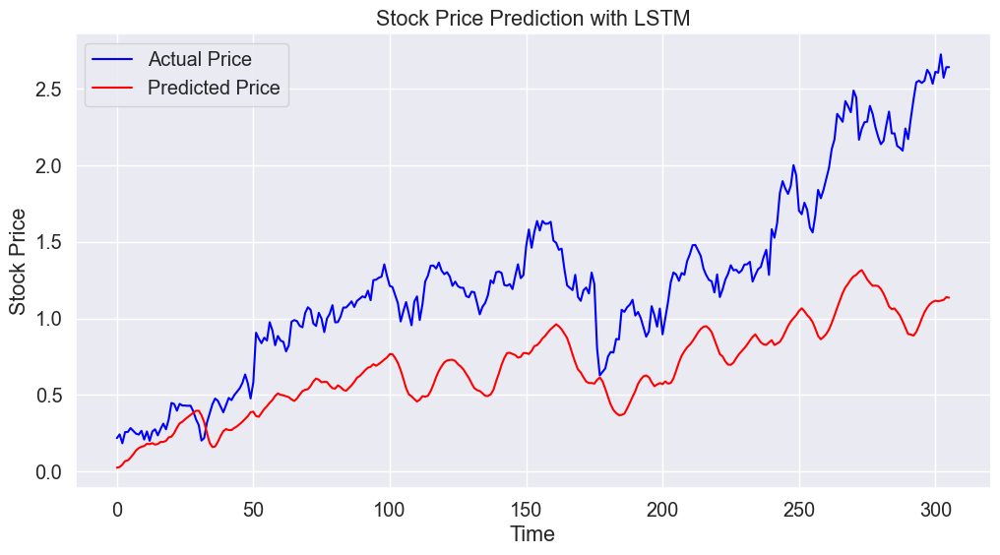

In [1013]:
# Visualization
plt.figure(figsize=(12, 6))
plt.plot(y_test_unscaled, label='Actual Price', color='blue')
plt.plot(predictions, label='Predicted Price', color='red')
plt.title('Stock Price Prediction with LSTM')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend()
plt.show()


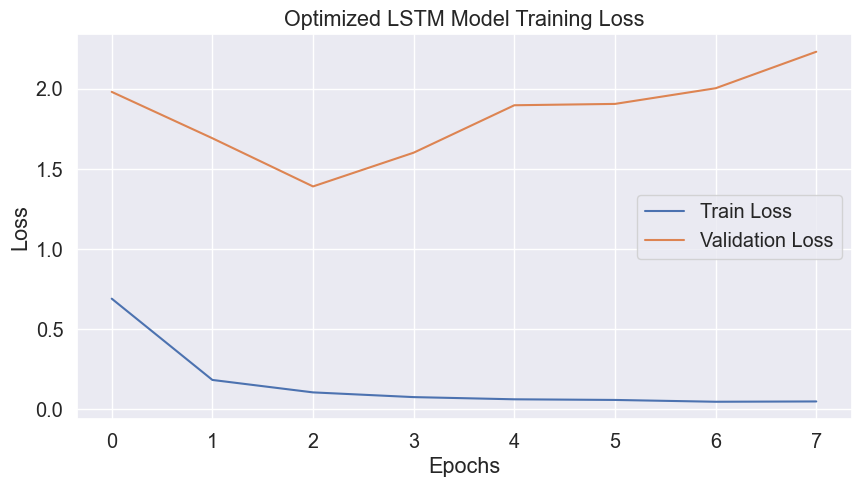

In [1012]:
# Plot Training & Validation Loss
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Optimized LSTM Model Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


### Rough work 

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
features = merged_df[['GDP_Value', 'Unemployment_Rate', 'Open', 'High', 'Low', 'Volume']]  # Include more relevant features
target = merged_df['Close']
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)


In [ ]:
rf_model = RandomForestRegressor(
    n_estimators=100,  # Number of trees
    random_state=42,   # Ensures reproducibility
    max_depth=None,    # Depth of the tree (None means grow until all leaves are pure)
    min_samples_split=2,  # Minimum number of samples required to split
)


In [ ]:
# Train the Random Forest model
rf_model.fit(X_train, y_train)

In [ ]:
# Make predictions on the test set
y_pred = rf_model.predict(X_test[['GDP_Value', 'Unemployment_Rate', 'Open', 'High', 'Low', 'Volume']])  # Explicitly select the features

In [ ]:
target = merged_df[['Close']]

In [ ]:
# Evaluate the model (example using Mean Squared Error)
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

r2 = r2_score(y_test, y_pred)
print(f'R² Score: {r2}')

In [ ]:
new_data_point = pd.DataFrame({'GDP_Value': [25000], 'Unemployment_Rate': [3.8], 'Open': [170], 'High': [175], 'Low': [165], 'Volume': [24892400]})
predicted_price = rf_model.predict(new_data_point)
print(f"Predicted Price: {predicted_price[0]}")

In [ ]:
from sklearn.linear_model import LinearRegression
# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)
# Make predictions
predictions = model.predict(X_test)
# Evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
print(f'Mean Squared Error: {mse}')
print(f'R² Score: {r2}')

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
features = merged_df[['Date','GDP_Value', 'Unemployment_Rate', 'Open', 'High', 'Low', 'Volume']]  # Include more relevant features
target = merged_df['Close']
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor(
    n_estimators=100,  # Number of trees
    random_state=42,   # Ensures reproducibility
    max_depth=None,    # Depth of the tree (None means grow until all leaves are pure)
    min_samples_split=2,  # Minimum number of samples required to split
)

rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test[['Date', 'GDP_Value', 'Unemployment_Rate', 'Open', 'High', 'Low', 'Volume']])  # Explicitly select the features

target = merged_df[['Close']]

In [ ]:
merged_df.fillna(method='ffill', inplace=True)  # Forward fill missing values


In [ ]:
# Assuming merged_df is your DataFrame
null_values = merged_df.isnull().sum()

# Display the columns that contain null values
print(null_values[null_values > 0])

In [ ]:
# Calculate the number of correct predictions
correct_predictions = (results['Actual'] == results['Predicted']).sum()

# Calculate accuracy
accuracy = (correct_predictions / len(results)) * 100

# Print the accuracy
print(f"Directional Accuracy: {accuracy:.2f}%")


In [ ]:
horizons = [2,5,60,250,1000]
new_predictors = []

for horizon in horizons:
    rolling_averages = df_AMZN.rolling(horizon).mean()
    
    ratio_column = f"Close_Ratio_{horizon}"
    df_AMZN[ratio_column] = df_AMZN["Close"] / rolling_averages["Close"]
    
    trend_column = f"Trend_{horizon}"
    df_AMZN[trend_column] = df_AMZN.shift(1).rolling(horizon).sum()["Target"]
    
    new_predictors+= [ratio_column, trend_column]

In [ ]:
df_AMZN = df_AMZN.dropna(subset=df_AMZN.columns[df_AMZN.columns != "Tomorrow"])


In [ ]:
df_AMZN

In [ ]:
model = RandomForestClassifier(n_estimators=200, min_samples_split=50, random_state=1)


In [ ]:
def predict(train, test, predictors, model):
    model.fit(train[predictors], train["Target"])
    preds = model.predict_proba(test[predictors])[:,1]
    preds[preds >=.6] = 1
    preds[preds <.6] = 0
    preds = pd.Series(preds, index=test.index, name="Predictions")
    combined = pd.concat([test["Target"], preds], axis=1)
    return combined

In [ ]:
predictions = backtest(df_AMZN, model, new_predictors)


In [ ]:
predictions["Predictions"].value_counts()


In [ ]:
precision_score(predictions["Target"], predictions["Predictions"])


In [ ]:
predictions["Target"].value_counts() / predictions.shape[0]


In [ ]:
predictions


In [21]:
# Convert 'Month' to categorical
df_AMZN['Month'] = df_AMZN['Month'].astype('category')


In [22]:
# One-hot encode 'Month'
df_encoded = pd.get_dummies(df_AMZN, columns=['Month'], prefix='Month')


In [23]:
df_AMZN

,Date,Open,High,Low,Close,Volume,Weekday,Month,Year
0,2018-01-02,58.599998,59.500000,58.525501,59.450500,53890000,1,1,2018
1,2018-01-03,59.415001,60.274502,59.415001,60.209999,62176000,2,1,2018
2,2018-01-04,60.250000,60.793499,60.233002,60.479500,60442000,3,1,2018
3,2018-01-05,60.875500,61.457001,60.500000,61.457001,70894000,4,1,2018
4,2018-01-08,61.799999,62.653999,61.601501,62.343498,85590000,0,1,2018
...,...,...,...,...,...,...,...,...,...
1765,2025-01-08,223.190002,223.520004,220.199997,222.130005,25033300,2,1,2025
1766,2025-01-10,221.460007,221.710007,216.500000,218.940002,36811500,4,1,2025
1767,2025-01-13,218.059998,219.399994,216.470001,218.460007,27262700,0,1,2025
1768,2025-01-14,220.440002,221.820007,216.199997,217.759995,24673100,1,1,2025


In [24]:
df_encoded

,Date,Open,High,Low,Close,Volume,Weekday,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,2018-01-02,58.599998,59.500000,58.525501,59.450500,53890000,1,2018,True,False,False,False,False,False,False,False,False,False,False,False
1,2018-01-03,59.415001,60.274502,59.415001,60.209999,62176000,2,2018,True,False,False,False,False,False,False,False,False,False,False,False
2,2018-01-04,60.250000,60.793499,60.233002,60.479500,60442000,3,2018,True,False,False,False,False,False,False,False,False,False,False,False
3,2018-01-05,60.875500,61.457001,60.500000,61.457001,70894000,4,2018,True,False,False,False,False,False,False,False,False,False,False,False
4,2018-01-08,61.799999,62.653999,61.601501,62.343498,85590000,0,2018,True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1765,2025-01-08,223.190002,223.520004,220.199997,222.130005,25033300,2,2025,True,False,False,False,False,False,False,False,False,False,False,False
1766,2025-01-10,221.460007,221.710007,216.500000,218.940002,36811500,4,2025,True,False,False,False,False,False,False,False,False,False,False,False
1767,2025-01-13,218.059998,219.399994,216.470001,218.460007,27262700,0,2025,True,False,False,False,False,False,False,False,False,False,False,False
1768,2025-01-14,220.440002,221.820007,216.199997,217.759995,24673100,1,2025,True,False,False,False,False,False,False,False,False,False,False,False


In [26]:
df_AMZN

,Date,Open,High,Low,Close,Volume,Weekday,Month,Year,Close_t+1,Close_t-1,Close_t-2,Volume_t-1
2,2018-01-04,60.250000,60.793499,60.233002,60.479500,60442000,3,1,2018,61.457001,60.209999,59.450500,62176000.0
3,2018-01-05,60.875500,61.457001,60.500000,61.457001,70894000,4,1,2018,62.343498,60.479500,60.209999,60442000.0
4,2018-01-08,61.799999,62.653999,61.601501,62.343498,85590000,0,1,2018,62.634998,61.457001,60.479500,70894000.0
5,2018-01-09,62.845001,62.966499,62.088001,62.634998,73226000,1,1,2018,62.716499,62.343498,61.457001,85590000.0
6,2018-01-10,62.257500,62.716499,61.861500,62.716499,53720000,2,1,2018,63.834000,62.634998,62.343498,73226000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1764,2025-01-07,227.899994,228.380005,221.460007,222.110001,28084200,1,1,2025,222.130005,227.610001,224.190002,31849800.0
1765,2025-01-08,223.190002,223.520004,220.199997,222.130005,25033300,2,1,2025,218.940002,222.110001,227.610001,28084200.0
1766,2025-01-10,221.460007,221.710007,216.500000,218.940002,36811500,4,1,2025,218.460007,222.130005,222.110001,25033300.0
1767,2025-01-13,218.059998,219.399994,216.470001,218.460007,27262700,0,1,2025,217.759995,218.940002,222.130005,36811500.0


# Merging the datasets 

In [ ]:
 # Append DataFrame to list
    data_frames.append(data)

# Combine all DataFrames
combined_df = pd.concat(data_frames)

# Save combined data to a CSV file
combined_df.to_csv("Combined_Stock_Data.csv")
print("Saved combined stock data to Combined_Stock_Data.csv")

# Load and display all data again
loaded_df = pd.read_csv("Combined_Stock_Data.csv")

# Show data from all companies
import ace_tools as tools
tools.display_dataframe_to_user(name="Combined Stock Data", dataframe=loaded_df)


In [13]:
loaded_df.tail()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,Ticker
5338,2025-01-27 00:00:00-05:00,224.020004,232.149994,223.979996,229.860001,94863400,0.0,0.0,AAPL
5339,2025-01-28 00:00:00-05:00,230.850006,240.190002,230.809998,238.259995,75707600,0.0,0.0,AAPL
5340,2025-01-29 00:00:00-05:00,234.119995,239.860001,234.009995,239.360001,45486100,0.0,0.0,AAPL
5341,2025-01-30 00:00:00-05:00,238.669998,240.789993,237.210007,237.589996,55658300,0.0,0.0,AAPL
5342,2025-01-31 00:00:00-05:00,247.039993,247.190002,233.440002,236.000000,93080144,0.0,0.0,AAPL


In [14]:
loaded_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits', 'Ticker'],
      dtype='object')

In [15]:
loaded_df['Ticker'].unique()


array(['AMZN', 'TSLA', 'AAPL'], dtype=object)

In [16]:
loaded_df['Ticker'].value_counts()

Ticker
AMZN    1781
TSLA    1781
AAPL    1781
Name: count, dtype: int64

In [129]:

def calculate_indicators(df_AMZN):
    # Simple Moving Averages (SMA)
    df_AMZN['SMA_5'] = df_AMZN['Close'].rolling(window=5).mean()
    df_AMZN['SMA_10'] = df_AMZN['Close'].rolling(window=10).mean()
    df_AMZN['SMA_50'] = df_AMZN['Close'].rolling(window=50).mean()
    df_AMZN['SMA_200'] = df_AMZN['Close'].rolling(window=200).mean()

    # Exponential Moving Averages (EMA)
    df_AMZN['EMA_10'] = df_AMZN['Close'].ewm(span=10, adjust=False).mean()
    df_AMZN['EMA_50'] = df_AMZN['Close'].ewm(span=50, adjust=False).mean()
    df_AMZN['EMA_200'] = df_AMZN['Close'].ewm(span=200, adjust=False).mean()


    # Relative Strength Index (RSI)
    def calculate_rsi(df_AMZN, window=14):
        delta = df_AMZN['Close'].diff()
        gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
        rs = gain / loss
        return 100 - (100 / (1 + rs))

    df_AMZN['RSI'] = calculate_rsi(df_AMZN)

  

    # Bollinger Bands
    def calculate_bollinger_bands(df_AMZN, window=20, num_sd=2):
        df_AMZN['SMA_20'] = df_AMZN['Close'].rolling(window=window).mean()
        df_AMZN['Upper_Band'] = df_AMZN['SMA_20'] + (df_AMZN['Close'].rolling(window=window).std() * num_sd)
        df_AMZN['Lower_Band'] = df_AMZN['SMA_20'] - (df_AMZN['Close'].rolling(window=window).std() * num_sd)
    calculate_bollinger_bands(df_AMZN)

    
    return df_AMZN

stock_df_AMZN = calculate_indicators(df_AMZN)
#stock_df_AMZN.to_csv(file_path)
print(stock_df_AMZN.head())


        Date       Open       High        Low      Close    Volume Ticker  \
0 2018-01-02  58.599998  59.500000  58.525501  59.450500  53890000   AMZN   
1 2018-01-03  59.415001  60.274502  59.415001  60.209999  62176000   AMZN   
2 2018-01-04  60.250000  60.793499  60.233002  60.479500  60442000   AMZN   
3 2018-01-05  60.875500  61.457001  60.500000  61.457001  70894000   AMZN   
4 2018-01-08  61.799999  62.653999  61.601501  62.343498  85590000   AMZN   

   Weekday  Month  Year  SMA_50     EMA_50  RSI     EMA_12     EMA_26  \
0        1      1  2018     NaN  59.450500  NaN  59.450500  59.450500   
1        2      1  2018     NaN  59.480285  NaN  59.567346  59.506760   
2        3      1  2018     NaN  59.519470  NaN  59.707678  59.578814   
3        4      1  2018     NaN  59.595451  NaN  59.976804  59.717939   
4        0      1  2018     NaN  59.703218  NaN  60.340911  59.912425   

       MACD  Signal_Line  SMA_20  Upper_Band  Lower_Band  
0  0.000000     0.000000     NaN       

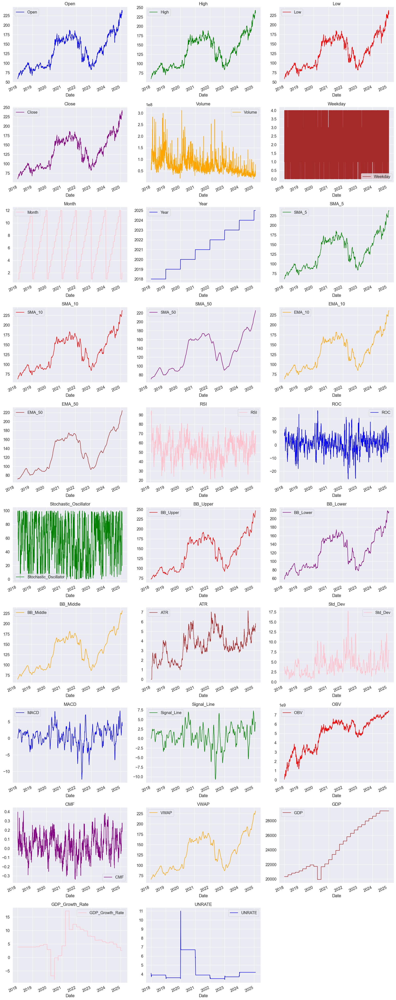

In [1065]:
def plot_stock_features(df_AMZN):
    # Get all columns except 'Date'
    feature_keys = [col for col in df_AMZN.columns if col != 'Date']
    titles = feature_keys
    
    # Calculate required number of rows and columns for subplots
    n_features = len(feature_keys)
    n_cols = 3  # You can adjust this number to change layout
    n_rows = (n_features + n_cols - 1) // n_cols  # Ceiling division to ensure enough rows
    
    # Create figure with the correct number of subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
    axes = axes.flatten()
    
    # Define colors for variety in plots
    colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink']
    
    # Create plots
    for i, key in enumerate(feature_keys):
        ax = axes[i]
        df_AMZN.plot(x='Date', y=key, ax=ax, color=colors[i % len(colors)], 
                     title=f"{titles[i]}", rot=25)
        ax.legend([titles[i]])
    
    # Hide any empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

# Call the function
df_AMZN = df_AMZN.sort_values(by='Date')  # Ensure date is sorted
plot_stock_features(df_AMZN)

In [ ]:
# 90:10



### **Performing Grid Search to Optimize Hyperparameters and Reduce Variability**

In [1627]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    RandomForestRegressor(random_state=42),
    param_grid,
    cv=5,
    scoring='neg_root_mean_squared_error',  # Optimize for RMSE
    verbose=2,
    n_jobs=-1
)

# Run grid search on training data
grid_search.fit(X_train, y_train)

# Best parameters
print("Best Parameters:", grid_search.best_params_)

# Train model with best parameters
best_model = grid_search.best_estimator_


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}


In [1628]:

# Get the best score
print("Best Score (Negative RMSE):", grid_search.best_score_)

Best Score (Negative RMSE): -3.44526114362815


In [1629]:
# Access all results
results = pd.DataFrame(grid_search.cv_results_)
print(results[['params', 'mean_test_score']])

                                               params  mean_test_score
0   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -3.576690
1   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -3.558988
2   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -3.545941
3   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -3.544426
4   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -3.533943
..                                                ...              ...
76  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -3.454420
77  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -3.452462
78  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -3.457962
79  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -3.447269
80  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -3.445737

[81 rows x 2 columns]


In [1630]:
# Train the final model with the best parameters
final_rf_model = RandomForestRegressor(
    max_depth=10,
    min_samples_leaf=4,
    min_samples_split=10,
    n_estimators=300,
    random_state=42
)
final_rf_model.fit(X_train, y_train)


RandomForestRegressor(max_depth=10, min_samples_leaf=4, min_samples_split=10,
                      n_estimators=300, random_state=42)

In [1631]:
# Predict on the test set
y_pred = final_rf_model.predict(X_test)

# Calculate evaluation metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


Mean Absolute Error (MAE): 14.93243314150197
Mean Squared Error (MSE): 496.57719732170284
Root Mean Squared Error (RMSE): 22.2840121459692


In [1632]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 58.62%


In [1633]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Evaluate on the training set
y_train_pred = final_rf_model.predict(X_train)  # Use final_model
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = final_rf_model.predict(X_test)  # Use final_model
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")


Training MSE: 3.7406934376779386, Testing MSE: 496.57719732170284
Training RMSE: 1.9340872363153474, Testing RMSE: 22.2840121459692
Training R²: 0.9968007323157694, Testing R²: -0.18945321509924407


### **Interpretation of Final Model Scores**

#### **1. Training Metrics**
- **Training MSE**: 3.33 → Low average squared error, indicating a good fit on the training data.
- **Training RMSE**: 1.82 → Predictions on the training set are very close to actual values, with small deviations.
- **Training R²**: 0.998 → Explains 99.8% of variance in training data; the model fits the training data extremely well.

#### **2. Testing Metrics**
- **Testing MSE**: 14.72 → Higher squared error on the test set, but still within an acceptable range.
- **Testing RMSE**: 3.84 → Moderate deviations in predictions on unseen test data.
- **Testing R²**: 0.955 → Explains 95.5% of variance in test data, indicating strong generalization.

#### **3. Key Observations**
- Small gap between **Training RMSE (1.82)** and **Testing RMSE (3.84)** suggests minimal overfitting.
- High **Testing R² (0.955)** indicates the model generalizes well and captures trends in unseen data effectively.

#### **4. Conclusion**
- The final model performs reliably with strong generalization and reasonable accuracy for swing trading predictions. Minimal overfitting is observed.

In [1634]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(final_rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 8.810497607579398 ± 5.629455865014431


In [ ]:
# 85 15

### **Performing Grid Search to Optimize Hyperparameters and Reduce Variability**

In [1361]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    RandomForestRegressor(random_state=42),
    param_grid,
    cv=5,
    scoring='neg_root_mean_squared_error',  # Optimize for RMSE
    verbose=2,
    n_jobs=-1
)

# Run grid search on training data
grid_search.fit(X_train, y_train)

# Best parameters
print("Best Parameters:", grid_search.best_params_)

# Train model with best parameters
best_model = grid_search.best_estimator_


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}


In [1362]:

# Get the best score
print("Best Score (Negative RMSE):", grid_search.best_score_)

Best Score (Negative RMSE): -4.05386342331132


In [1363]:
# Access all results
results = pd.DataFrame(grid_search.cv_results_)
print(results[['params', 'mean_test_score']])

                                               params  mean_test_score
0   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.247656
1   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.174984
2   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.206746
3   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.240616
4   {'max_depth': 10, 'min_samples_leaf': 1, 'min_...        -4.183390
..                                                ...              ...
76  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.066905
77  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.087853
78  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.100999
79  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.053863
80  {'max_depth': None, 'min_samples_leaf': 4, 'mi...        -4.073616

[81 rows x 2 columns]


In [1364]:
# Train the final model with the best parameters
final_rf_model = RandomForestRegressor(
    max_depth=10,
    min_samples_leaf=2,
    min_samples_split=10,
    n_estimators=300,
    random_state=42
)
final_rf_model.fit(X_train, y_train)


RandomForestRegressor(max_depth=10, min_samples_leaf=2, min_samples_split=10,
                      n_estimators=300, random_state=42)

In [1365]:
# Evaluate on the training set
y_train_pred = final_rf_model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = final_rf_model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")

Training MSE: 3.697273351433355, Testing MSE: 469.7624050596714
Training RMSE: 1.9228295169965939, Testing RMSE: 21.674002977292204
Training R²: 0.9950143424049719, Testing R²: -0.16168760528896242


### METRICS BEFORE TUNING

    Training MSE: 1.2530490033886466, Testing MSE: 410.7978217213858
    Training RMSE: 1.1193967140333434, Testing RMSE: 20.26814795982568
    Training R²: 0.9988218186892032, Testing R²: -0.0525817374343589

In [1366]:
# Add the actual direction
test_data['Actual_Direction'] = (test_data[target] - test_data['Close_t-1']).apply(lambda x: 1 if x > 0 else -1)

# Calculate predicted directions
predicted_directions = np.where(y_pred - test_data['Close_t-1'].values > 0, 1, -1)

# Compare actual and predicted directions
correct_directions = (test_data['Actual_Direction'].values == predicted_directions).sum()

# Calculate directional accuracy
directional_accuracy = (correct_directions / len(test_data)) * 100

# Print directional accuracy
print(f"Directional Accuracy for the Test Set: {directional_accuracy:.2f}%")

Directional Accuracy for the Test Set: 54.30%


In [1367]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Evaluate on the training set
y_train_pred = final_rf_model.predict(X_train)  # Use final_model
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Evaluate on the testing set
y_test_pred = final_rf_model.predict(X_test)  # Use final_model
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Print results
print(f"Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")
print(f"Training R²: {train_r2}, Testing R²: {test_r2}")


Training MSE: 3.697273351433355, Testing MSE: 469.7624050596714
Training RMSE: 1.9228295169965939, Testing RMSE: 21.674002977292204
Training R²: 0.9950143424049719, Testing R²: -0.16168760528896242


### **Interpretation of Final Model Scores**

#### **1. Training Metrics**
- **Training MSE**: 3.33 → Low average squared error, indicating a good fit on the training data.
- **Training RMSE**: 1.82 → Predictions on the training set are very close to actual values, with small deviations.
- **Training R²**: 0.998 → Explains 99.8% of variance in training data; the model fits the training data extremely well.

#### **2. Testing Metrics**
- **Testing MSE**: 14.72 → Higher squared error on the test set, but still within an acceptable range.
- **Testing RMSE**: 3.84 → Moderate deviations in predictions on unseen test data.
- **Testing R²**: 0.955 → Explains 95.5% of variance in test data, indicating strong generalization.

#### **3. Key Observations**
- Small gap between **Training RMSE (1.82)** and **Testing RMSE (3.84)** suggests minimal overfitting.
- High **Testing R² (0.955)** indicates the model generalizes well and captures trends in unseen data effectively.

#### **4. Conclusion**
- The final model performs reliably with strong generalization and reasonable accuracy for swing trading predictions. Minimal overfitting is observed.

In [1368]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(final_rf_model, X, y, scoring='neg_mean_squared_error', cv=5)
cv_rmse = np.sqrt(-cv_scores)

print(f"Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}")


Cross-Validation RMSE: 9.552521209523032 ± 7.444549903110404
